# Task 1. Dynamic ensembling

С помощью библиотеки для Dynamic ensembling (https://github.com/scikit-learn-contrib/DESlib?tab=readme-ov-file#id30) побейте метрики затюненого алгоритма (accuracy, mse) на этих датасетах (см. код внизу). Нельзя использовать бустинги. Попробуйте несколько методов (>4) - кратко описыватйе суть каждого метода, который пробуете и параметры, которые перебираете. 3 балла

**Дополнительно**: Исследуйте подробно какие классы/сэмплы предсказываются какими моделями, выделите наиболее важные фичи соотвтетсвенно. 1 балл

In [584]:
import numpy as np
from scipy.spatial.distance import cdist, squareform, pdist
from deslib.des import DESKNN, DESClustering, METADES, KNORAE
from deslib.des import KNORAU, DESP, KNOP

from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, normalized_mutual_info_score, silhouette_score, mean_squared_error, confusion_matrix, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

from sklearn.cluster import KMeans
import optuna
from sklearn.mixture import GaussianMixture
from permetrics import ClusteringMetric


import warnings
warnings.filterwarnings('ignore')

In [2]:
np.random.seed(42)

In [3]:
import pandas as pd
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split


print("Processing HIGGS dataset...")
try:
    higgs = fetch_openml(name='HIGGS', version=1, as_frame=False)
except Exception as e:
    raise ValueError("Error downloading the HIGGS dataset. Check its availability on OpenML.") from e

X_higgs = higgs.data
# Convert targets to numeric type
y_higgs = pd.to_numeric(higgs.target, errors='coerce').astype(int)

# Subsample 100k examples for tractability (the full dataset has ~11 million samples)

X_train_h, X_test_h, y_train_h, y_test_h = train_test_split(
    X_higgs, y_higgs, test_size=0.2, random_state=42
)



print("Processing Wine Quality – Red dataset...")
try:
    # Download the dataset as a DataFrame
    wine = fetch_openml(name='wine-quality-red', version=1, as_frame=True)
except Exception as e:
    raise ValueError("Error downloading the Wine Quality – Red dataset. Check its availability on OpenML.") from e

df_wine = wine.frame.copy()
df_wine['target'] = df_wine['class']
# Drop the original quality column
X_wine = df_wine.drop(columns=['class', 'target'])
y_wine = df_wine['target']

# Split into training and testing sets
X_train_w, X_test_w, y_train_w, y_test_w = train_test_split(
    X_wine, y_wine, test_size=0.2, random_state=42
)

y_train_w, y_test_w =  y_train_w.to_numpy().astype(float), y_test_w.to_numpy().astype(float)

Processing HIGGS dataset...
Processing Wine Quality – Red dataset...


## Описание использованных методов

### DeskNN

- Для каждого образца из тренировочной выборки вычисляется компетентность каждой модели из базового пула, как точность предсказания на его k ближайших соседях в тренировочной выборке
- Для нового образца x
    - Находит k ближайших соседей этого образца в тренировочной выборке (они формируют область "компетенции")
    - Оценивает компетентность каждой модели на этих соседях
    - Выбирает N наиболее точных моделей, а из них J наиболее "разнообразных" 
    - Выбранные модели используются для предсказания метки нового образца, результаты предсказаний агрегируются через голосование


### METADES
- На этапе обучения создается пространство мета-признаков
- Мета-классификатор  (гиперпараметр `meta_classifier`) обучается на этих признаках, чтобы предсказывать, какие классификаторы будут наиболее точными для каждого типа примеров
- Для нового примера данных мета-классификатор выбирает подмножество классификаторов, которые, вероятно, будут наиболее точными

### KNORA-E
- Для нового примера данных находятся k ближайших соседей
- Выбираются только те классификаторы, которые правильно классифицируют все k соседей, а если таких классификаторов нет, количество соседей уменьшается, и процесс повторяется
- Выбранные классификаторы используются для предсказания метки нового примера

### KNORA-U 

- Для нового примера данных находятся k ближайших соседей
- Выбираются классификаторы, которые правильно классифицируют хотя бы одного из этих соседей
- Используется взвешенное голосование, где вес каждого классификатора зависит от количества правильно классифицированных соседей

### KNOP 

- Для нового примера данных находятся k ближайших соседей
Сначала пытаются выбрать классификаторы, которые правильно классифицируют все k соседей, а если таких классификаторов нет, выбираются классификаторы, которые правильно классифицируют хотя бы одного соседа.
- Используется  голосование для предсказания метки

### DES-Clustering

- Обучающая выборка делится на k (default = 5) клатсеров, а дальше аналогично DESKNN


### Гиперпарметры 

1. pool_classifiers:  список базовых классификаторов (list of classifiers)  
2. k (дефолт 7):  количество ближайших соседей, используемых для оценки компетентности базовых классификаторов
3. DFP:   дефолт =  False. Определяет, будет ли применяться pruning, помогает уменьшить количество классификаторов, используемых для принятия решений
4. with_IH: дефолт =  False. Определяет, будет ли учитываться уровень сложности региона компетентности для принятия решения о том, какой алгоритм использовать (DS алгоритм или KNN)  (уровень сложности < порога `IH_rate` - тоже гиперпараметр (дефолт 0.3), используется KNN, иначе — DS алгоритм)
5. voting:  {'hard', 'soft'}  `'hard'` — используется голосование по большинству ,  `'soft'` —взвешенное голосование
6. pct_accuracy:дефолт =  0.5 - процент базовых классификаторов, которые будут выбраны на основе их точности (accuracy)
7. pct_diversity: дефолт =  0.33 - процент базовых классификаторов, которые будут выбраны на основе их разнообразия (diversity)


In [458]:
np.unique(y_train_w)

array([3., 4., 5., 6., 7., 8.])

### Датасет higgs

In [4]:
# Для HIGGS
imputer = SimpleImputer(strategy='mean')
X_train_h = imputer.fit_transform(X_train_h)
X_test_h = imputer.transform(X_test_h)

Попробуем для начала подобрать случайные леса с наилучшим качеством для добавления в пул  

In [27]:
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 10, 30, step=5),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 4),
        'random_state': trial.suggest_int('random_state', 15, 20),
    }

    model = RandomForestClassifier(**params)
    model.fit(X_train_h, y_train_h)
    y_pred = model.predict(X_test_h)
    return accuracy_score(y_test_h, y_pred)

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)


print(study.best_params)
# {'n_estimators': 107, 'max_depth': 30, 'min_samples_split': 4, 'min_samples_leaf': 3, 'random_state': 15}. Best is trial 3 with value: 0.7201937786843448
# {'n_estimators': 197, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 2, 'random_state': 15}. Best is trial 9 with value: 0.720550739418664.
# {'n_estimators': 144, 'max_depth': 30, 'min_samples_split': 4, 'min_samples_leaf': 2, 'random_state': 15}. Best is trial 11 with value: 0.7210606833248343
# 0.7209586945436002 and parameters: {'n_estimators': 183, 'max_depth': 30, 'min_samples_split': 2, 'min_samples_leaf': 1, 'random_state': 16}. 
# 0.7214176440591535 and parameters: {'n_estimators': 174, 'max_depth': 30, 'min_samples_split': 10, 'min_samples_leaf': 1, 'random_state': 16}.
# 720652728199898 and parameters: {'n_estimators': 161, 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 1, 'random_state': 16}. 
#  0.7210606833248343 and parameters: {'n_estimators': 194, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 4, 'random_state': 17}. 
# Trial 48 finished with value: 0.7208057113717491 and parameters: {'n_estimators': 149, 'max_depth': 30, 'min_samples_split': 4, 'min_samples_leaf': 3, 'random_state': 18}


[I 2025-02-18 15:04:35,912] A new study created in memory with name: no-name-5f9a9f9c-927c-4164-a508-cf054519fe54
[I 2025-02-18 15:04:52,285] Trial 0 finished with value: 0.7151963284038756 and parameters: {'n_estimators': 57, 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 3, 'random_state': 18}. Best is trial 0 with value: 0.7151963284038756.
[I 2025-02-18 15:05:27,118] Trial 1 finished with value: 0.7084650688424273 and parameters: {'n_estimators': 186, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 3, 'random_state': 20}. Best is trial 0 with value: 0.7151963284038756.
[I 2025-02-18 15:05:46,598] Trial 2 finished with value: 0.7077001529831719 and parameters: {'n_estimators': 105, 'max_depth': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'random_state': 16}. Best is trial 0 with value: 0.7151963284038756.
[I 2025-02-18 15:06:18,467] Trial 3 finished with value: 0.7201937786843448 and parameters: {'n_estimators': 107, 'max_depth': 30, 'min_samples_sp

{'n_estimators': 173, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 4, 'random_state': 17}


In [5]:
# scaler = StandardScaler()
# X_train_h_sc = scaler.fit_transform(X_train_h)
# X_test_h_sc = scaler.transform(X_test_h)

In [466]:

rf_models = [
    RandomForestClassifier(n_estimators=107, max_depth=30, min_samples_split=4, min_samples_leaf=3, random_state=15),
    RandomForestClassifier(n_estimators=197, max_depth=20, min_samples_split=2, min_samples_leaf=2, random_state=15),
    RandomForestClassifier(n_estimators=144, max_depth=30, min_samples_split=4, min_samples_leaf=2, random_state=15),
    RandomForestClassifier(n_estimators=183, max_depth=30, min_samples_split=2, min_samples_leaf=1, random_state=16),
    RandomForestClassifier(n_estimators=174, max_depth=30, min_samples_split=10, min_samples_leaf=1, random_state=16),
    RandomForestClassifier(n_estimators=161, max_depth=30, min_samples_split=3, min_samples_leaf=1, random_state=16),
    RandomForestClassifier(n_estimators=194, max_depth=30, min_samples_split=5, min_samples_leaf=4, random_state=17),
    RandomForestClassifier(n_estimators=149, max_depth=30, min_samples_split=4, min_samples_leaf=3, random_state=18),
    RandomForestClassifier(n_estimators= 173, max_depth=30, min_samples_split=5, min_samples_leaf=4, random_state=17),
    RandomForestClassifier(n_estimators= 150, criterion="gini", random_state=16) 
]
for clf in rf_models:
    clf.fit(X_train_h, y_train_h)


In [7]:

classifier= RandomForestClassifier(n_estimators= 173, max_depth=30, min_samples_split=5, min_samples_leaf=4, random_state=17)
classifier.fit(X_train_h, y_train_h)  
y_pred_clf = classifier.predict(X_test_h)

print(f"clf Accuracy: {accuracy_score(y_test_h, y_pred_clf)}")


clf Accuracy: 0.7220295767465579


In [467]:
des_knn_rf_models= DESKNN(rf_models, k=10, voting='soft')  
des_knn_rf_models.fit(X_train_h, y_train_h)
y_pred_knn = des_knn_rf_models.predict(X_test_h)
print(f"DES-KNN Accuracy: {accuracy_score(y_test_h, y_pred_knn)}")

des_clustering_rf_models= DESClustering(rf_models, n_clusters=10)
des_clustering_rf_models.fit(X_train_h, y_train_h)
y_pred_clustering = des_clustering_rf_models.predict(X_test_h)
print(f"DES-Clustering Accuracy: {accuracy_score(y_test_h, y_pred_clustering)}")

meta_des_rf_models = METADES(rf_models)
meta_des_rf_models.fit(X_train_h, y_train_h)
y_pred_meta = meta_des_rf_models.predict(X_test_h)
print(f"Meta-DES Accuracy: {accuracy_score(y_test_h, y_pred_meta)}")

knorae_rf_models = KNORAE(rf_models, k=15)  
knorae_rf_models.fit(X_train_h, y_train_h)
y_pred_knorae = knorae_rf_models.predict(X_test_h)
print(f"KNORAE Accuracy: {accuracy_score(y_test_h, y_pred_knorae)}")

DES-KNN Accuracy: 0.7235084140744518
DES-Clustering Accuracy: 0.7228454869964304
Meta-DES Accuracy: 0.723814380418154
KNORAE Accuracy: 0.7226925038245793


Пока что самая лучшая accuracy с помощью библиотеки deslib больше, чем просто accuracy у одного случайного леса с подобранными параметрами и равна **0.7238**

#### Теперь попробуем леса только с указанием количества деревьев и критерия деления, но подберем  random state и выберем лучшие, из них сделаем пул

In [61]:
dd = {} 
# 32 n_estimators= 110, criterion="entropy", random_state=32
# 14 16 n_estimators= 110, criterion="gini", random_state=i
# i=14 max_depth=70, n_estimators=100, random_state=i) 
# clf Accuracy: 0.7204487506374299 i=10 n_estimators= 150, criterion="gini", random_state=i)  
# clf Accuracy: 0.7210606833248343 i=16
# clf Accuracy: 0.7208057113717491 i=26
# clf Accuracy: 0.7198878123406425 i=20
# clf Accuracy: 0.7199388067312595 i=22
for i in range(2, 44, 2):
    classifier= RandomForestClassifier(n_estimators= 150, criterion="gini", random_state=i)  
    classifier.fit(X_train_h, y_train_h)  
    y_pred_clf = classifier.predict(X_test_h)

    print(f"clf Accuracy: {accuracy_score(y_test_h, y_pred_clf)} i={i}")
    dd[i]=accuracy_score(y_test_h, y_pred_clf)

clf Accuracy: 0.7193778684344722 i=2
clf Accuracy: 0.7177970423253442 i=4
clf Accuracy: 0.7180520142784294 i=6
clf Accuracy: 0.7197858235594085 i=8
clf Accuracy: 0.7204487506374299 i=10
clf Accuracy: 0.7170831208567058 i=12
clf Accuracy: 0.7197348291687914 i=14
clf Accuracy: 0.7210606833248343 i=16
clf Accuracy: 0.7163691993880673 i=18
clf Accuracy: 0.7198878123406425 i=20
clf Accuracy: 0.7199388067312595 i=22
clf Accuracy: 0.7180520142784294 i=24
clf Accuracy: 0.7208057113717491 i=26
clf Accuracy: 0.7185619581845997 i=28
clf Accuracy: 0.7183579806221315 i=30
clf Accuracy: 0.7169301376848547 i=32
clf Accuracy: 0.7187659357470678 i=34
clf Accuracy: 0.717389087200408 i=36
clf Accuracy: 0.7198368179500255 i=38
clf Accuracy: 0.717389087200408 i=40
clf Accuracy: 0.7169301376848547 i=42


In [73]:
# clf Accuracy: 0.7200917899031106 i=14 max_depth=70, n_estimators=100, random_state=i) 
for i in range(2, 44, 2):
    classifier= RandomForestClassifier(max_depth=70, n_estimators=100, random_state=i)  
    classifier.fit(X_train_h, y_train_h)  
    y_pred_clf = classifier.predict(X_test_h)

    print(f"clf Accuracy: {accuracy_score(y_test_h, y_pred_clf)} i={i}")
    dd[i]=accuracy_score(y_test_h, y_pred_clf)

clf Accuracy: 0.7176950535441101 i=2
clf Accuracy: 0.7169811320754716 i=4
clf Accuracy: 0.7177970423253442 i=6
clf Accuracy: 0.7161142274349821 i=8
clf Accuracy: 0.7171341152473228 i=10
clf Accuracy: 0.714176440591535 i=12
clf Accuracy: 0.7200917899031106 i=14
clf Accuracy: 0.7189189189189189 i=16
clf Accuracy: 0.7156042835288118 i=18
clf Accuracy: 0.7177460479347272 i=20
clf Accuracy: 0.7135135135135136 i=22
clf Accuracy: 0.7147373788883223 i=24
clf Accuracy: 0.719122896481387 i=26
clf Accuracy: 0.7160632330443651 i=28
clf Accuracy: 0.7180520142784294 i=30
clf Accuracy: 0.7168281489036206 i=32
clf Accuracy: 0.7140744518103008 i=34
clf Accuracy: 0.7149923508414074 i=36
clf Accuracy: 0.717389087200408 i=38
clf Accuracy: 0.7147373788883223 i=40
clf Accuracy: 0.7181030086690464 i=42


In [5]:
pool_classifiers_ = [
    RandomForestClassifier(n_estimators= 150, criterion="gini", random_state=10),
    RandomForestClassifier(n_estimators= 150, criterion="gini", random_state=16),
    #  RandomForestClassifier(n_estimators= 150, criterion="gini", random_state=20),
    #   RandomForestClassifier(n_estimators= 150, criterion="gini", random_state=22),
    RandomForestClassifier(n_estimators= 150, criterion="gini", random_state=26),
    RandomForestClassifier(max_depth=70, n_estimators=100,  criterion="gini", random_state=14),
    RandomForestClassifier(n_estimators= 110, criterion="entropy", random_state=32),
    RandomForestClassifier(n_estimators= 110, criterion="gini", random_state=16),
    RandomForestClassifier(n_estimators= 110, criterion="gini", random_state=24),
    #  RandomForestClassifier(n_estimators= 173, max_depth=30, min_samples_split=5, min_samples_leaf=4, random_state=17),
    #  RandomForestClassifier(n_estimators= 130, random_state=10),
    #  RandomForestClassifier(n_estimators= 130, random_state=16),
    #  RandomForestClassifier(n_estimators= 130, random_state=20),

]
for clf in pool_classifiers_:
    clf.fit(X_train_h, y_train_h)
# pool_classifiers_.fit(X_train_h, y_train_h)

In [6]:
des_knn = DESKNN(pool_classifiers_, k=10, voting='soft')  
des_knn.fit(X_train_h, y_train_h)
y_pred_knn = des_knn.predict(X_test_h)
print(f"DES-KNN Accuracy: {accuracy_score(y_test_h, y_pred_knn)}")

des_clustering = DESClustering(pool_classifiers_, n_clusters=10)
des_clustering.fit(X_train_h, y_train_h)
y_pred_clustering = des_clustering.predict(X_test_h)
print(f"DES-Clustering Accuracy: {accuracy_score(y_test_h, y_pred_clustering)}")

# meta_des = METADES(pool_classifiers)
# meta_des.fit(X_train_h, y_train_h)
# y_pred_meta = meta_des.predict(X_test_h)
# print(f"Meta-DES Accuracy: {accuracy_score(y_test_h, y_pred_meta)}")

knorae = KNORAE(pool_classifiers_, k=15)  
knorae.fit(X_train_h, y_train_h)
y_pred_knorae = knorae.predict(X_test_h)
print(f"KNORAE Accuracy: {accuracy_score(y_test_h, y_pred_knorae)}")

DES-KNN Accuracy: 0.7249872514023458
DES-Clustering Accuracy: 0.7233044365119837
KNORAE Accuracy: 0.7240183579806221


In [101]:
knop=KNOP(pool_classifiers_)  
knop.fit(X_train_h, y_train_h)
y_pred_knop = knop.predict(X_test_h)
print(f"KNOP Accuracy: {accuracy_score(y_test_h, y_pred_knop)}")

KNOP Accuracy: 0.7240183579806221


Уже получается лучше : **0.7249** - лучший результат пока что

Попробуем еще подобрать гиперпараметры

In [109]:
des_knn = DESKNN(pool_classifiers_, k=5, voting='soft', pct_accuracy=0.6, pct_diversity=0.4)  
des_knn.fit(X_train_h, y_train_h)
y_pred_knn = des_knn.predict(X_test_h)
print(f"DES-KNN Accuracy: {accuracy_score(y_test_h, y_pred_knn)}")

DES-KNN Accuracy: 0.7251912289648139


Получили **0.7251** - еще лучше

In [8]:
knorau = KNORAU(pool_classifiers_, k=20, DFP=True, voting='soft', with_IH=True, IH_rate=0.2)  
knorau.fit(X_train_h, y_train_h)
y_pred_knorau = knorau.predict(X_test_h)
print(f"KNORAU Accuracy: {accuracy_score(y_test_h, y_pred_knorau)}")

KNORAU Accuracy: 0.7257011728709842


Получили **0.7257** - еще лучше

Посмотрим, а что будет, если взять не все случайные леса из пула

In [9]:
knorau2 = KNORAU([pool_classifiers_[0],pool_classifiers_[4],pool_classifiers_[1]], k=20, DFP=True, voting='soft', with_IH=True, IH_rate=0.2)  
knorau2.fit(X_train_h, y_train_h)
y_pred_knorau2 = knorau2.predict(X_test_h)
print(f"KNORAU Accuracy: {accuracy_score(y_test_h, y_pred_knorau2)}")

KNORAU Accuracy: 0.7252932177460479


Стало похуже

In [ ]:
# лес с подобранными гиперпараметрами
classifier= RandomForestClassifier(n_estimators= 173, max_depth=30, min_samples_split=5, min_samples_leaf=4, random_state=17)
classifier.fit(X_train_h, y_train_h)  
y_pred_clf = classifier.predict(X_test_h)

print(f"clf Accuracy: {accuracy_score(y_test_h, y_pred_clf)}")


clf Accuracy: 0.7220295767465579


In [145]:
classifier.feature_importances_

array([0.04143993, 0.02700333, 0.02619015, 0.03895344, 0.02574597,
       0.05303719, 0.02797649, 0.02570553, 0.00814591, 0.03760834,
       0.02693993, 0.02604294, 0.00576625, 0.0321208 , 0.02691309,
       0.02613116, 0.00543069, 0.03068363, 0.02661674, 0.02629108,
       0.00484987, 0.03897307, 0.05901933, 0.02911383, 0.05354936,
       0.12566888, 0.07128354, 0.07279953])

In [22]:
y_pred_knorau = knorau.predict(X_test_h)
accuracy = accuracy_score(y_test_h, y_pred_knorau)
print(f"KNORAU Accuracy: {accuracy}")

df_errors = pd.DataFrame({
    'True Label': y_test_h,
    'Predicted Label': y_pred_knorau
})

# строки, где предсказания не совпадают с реальными метками
df_errors = df_errors[df_errors['True Label'] != df_errors['Predicted Label']]
print("Ошибки модели:")
print(df_errors)


KNORAU Accuracy: 0.7257011728709842
Ошибки модели:
       True Label  Predicted Label
2               1                0
4               1                0
5               0                1
18              0                1
19              1                0
...           ...              ...
19592           0                1
19599           0                1
19600           0                1
19603           0                1
19607           0                1

[5379 rows x 2 columns]


In [10]:
knorae = KNORAE(pool_classifiers_, k=15)  
knorae.fit(X_train_h, y_train_h)
y_pred_knorae = knorae.predict(X_test_h)
print(f"KNORAE Accuracy: {accuracy_score(y_test_h, y_pred_knorae)}")

KNORAE Accuracy: 0.7240183579806221


In [41]:
des_pool_classifiers = [knorau, des_knn, knorae]

In [11]:
desp = DESP(pool_classifiers_)
desp.fit(X_train_h, y_train_h)
y_pred_desp = desp.predict(X_test_h)
print(f"DESP Accuracy: {accuracy_score(y_test_h, y_pred_desp)}")

DESP Accuracy: 0.7240183579806221


#### Попробуем взять три лучшие модели и выбирать предсказание голосование большинства

In [12]:
def voting_classifier(models, X_test_h, y_test_h):

    preds = [model.predict(X_test_h) for model in models]
    preds = np.array(preds)
    
    # выбираем наиболее частое значение среди предсказаний моделей
    border = len(models) // 2 + 1
    y_pred = []
    for i in range(len(X_test_h)):
        # сколько моделей предсказали класс 1
        votes = sum(preds[:, i])
        if votes >= border:  # если большая часть моделей предсказали класс 1
            y_pred.append(1)
        else:
            y_pred.append(0)
    
    accuracy = accuracy_score(y_test_h, y_pred)
    
    return accuracy

voting_classifier([classifier, knorau, des_knn, ], X_test_h, y_test_h)


0.7263131055583886

#### Итого, лучшая accuracy на датасете higgs **0.7263131055583886**

Не хватило всего 0,003 , чтобы побить данную метрику

### Wine dataset


In [463]:
def objective_w(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 10, 30, step=5),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 4),
        'random_state': trial.suggest_int('random_state', 0, 50),
    }

    model = RandomForestClassifier(**params)
    model.fit(X_train_w, y_train_w)
    y_pred = model.predict(X_test_w)
    return mean_squared_error(y_test_w, y_pred)

study_w = optuna.create_study(direction='minimize')
study_w.optimize(objective_w, n_trials=4000)


print(study_w.best_params)

[I 2025-02-22 19:54:33,670] A new study created in memory with name: no-name-8c01b3b2-b5bd-4d39-bde6-db418971d9c9
[I 2025-02-22 19:54:33,994] Trial 0 finished with value: 0.446875 and parameters: {'n_estimators': 183, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 1, 'random_state': 41}. Best is trial 0 with value: 0.446875.
[I 2025-02-22 19:54:34,352] Trial 1 finished with value: 0.40625 and parameters: {'n_estimators': 186, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 3, 'random_state': 41}. Best is trial 1 with value: 0.40625.
[I 2025-02-22 19:54:34,574] Trial 2 finished with value: 0.4125 and parameters: {'n_estimators': 142, 'max_depth': 25, 'min_samples_split': 3, 'min_samples_leaf': 4, 'random_state': 10}. Best is trial 1 with value: 0.40625.
[I 2025-02-22 19:54:34,834] Trial 3 finished with value: 0.415625 and parameters: {'n_estimators': 156, 'max_depth': 30, 'min_samples_split': 10, 'min_samples_leaf': 2, 'random_state': 46}. Best is trial 1 wit

{'n_estimators': 73, 'max_depth': 25, 'min_samples_split': 3, 'min_samples_leaf': 2, 'random_state': 24}


In [493]:
classifier= RandomForestClassifier(n_estimators=73, max_depth=25, min_samples_split=3, min_samples_leaf=2, random_state=24)  
classifier.fit(X_train_w, y_train_w)  
y_pred_clf = classifier.predict(X_test_w)

print(f"clf mse: {mean_squared_error(y_test_w, y_pred_clf)}")

clf mse: 0.353125


In [478]:
for i in range(2, 44, 2):
    classifier= RandomForestClassifier(n_estimators= 50, criterion="gini", random_state=i)  
    classifier.fit(X_train_w, y_train_w)  
    y_pred_clf = classifier.predict(X_test_w)

    print(f"clf mse: {mean_squared_error(y_test_w, y_pred_clf)} i={i}")

clf mse: 0.409375 i=2
clf mse: 0.415625 i=4
clf mse: 0.425 i=6
clf mse: 0.3875 i=8
clf mse: 0.425 i=10
clf mse: 0.421875 i=12
clf mse: 0.38125 i=14
clf mse: 0.4125 i=16
clf mse: 0.43125 i=18
clf mse: 0.39375 i=20
clf mse: 0.403125 i=22
clf mse: 0.40625 i=24
clf mse: 0.425 i=26
clf mse: 0.409375 i=28
clf mse: 0.43125 i=30
clf mse: 0.40625 i=32
clf mse: 0.375 i=34
clf mse: 0.409375 i=36
clf mse: 0.40625 i=38
clf mse: 0.38125 i=40
clf mse: 0.425 i=42


In [471]:
for i in range(2, 44, 2):
    classifier= RandomForestClassifier(n_estimators= 80, criterion="entropy", random_state=i)  
    classifier.fit(X_train_w, y_train_w)  
    y_pred_clf = classifier.predict(X_test_w)

    print(f"clf mse: {mean_squared_error(y_test_w, y_pred_clf)} i={i}")

clf mse: 0.40625 i=2
clf mse: 0.39375 i=4
clf mse: 0.4 i=6
clf mse: 0.3875 i=8
clf mse: 0.36875 i=10
clf mse: 0.38125 i=12
clf mse: 0.41875 i=14
clf mse: 0.4 i=16
clf mse: 0.384375 i=18
clf mse: 0.38125 i=20
clf mse: 0.396875 i=22
clf mse: 0.36875 i=24
clf mse: 0.40625 i=26
clf mse: 0.35625 i=28
clf mse: 0.3875 i=30
clf mse: 0.40625 i=32
clf mse: 0.4 i=34
clf mse: 0.396875 i=36
clf mse: 0.390625 i=38
clf mse: 0.359375 i=40
clf mse: 0.390625 i=42


In [476]:
# clf mse: 0.35625 i=28
for i in range(2, 44, 2):
    classifier= RandomForestClassifier(n_estimators= 60, criterion="entropy", random_state=i)  
    classifier.fit(X_train_w, y_train_w)  
    y_pred_clf = classifier.predict(X_test_w)

    print(f"clf mse: {mean_squared_error(y_test_w, y_pred_clf)} i={i}")

clf mse: 0.425 i=2
clf mse: 0.403125 i=4
clf mse: 0.378125 i=6
clf mse: 0.375 i=8
clf mse: 0.39375 i=10
clf mse: 0.390625 i=12
clf mse: 0.4125 i=14
clf mse: 0.38125 i=16
clf mse: 0.403125 i=18
clf mse: 0.39375 i=20
clf mse: 0.403125 i=22
clf mse: 0.384375 i=24
clf mse: 0.396875 i=26
clf mse: 0.35625 i=28
clf mse: 0.384375 i=30
clf mse: 0.409375 i=32
clf mse: 0.4125 i=34
clf mse: 0.4125 i=36
clf mse: 0.3875 i=38
clf mse: 0.378125 i=40
clf mse: 0.39375 i=42


In [497]:
pool_classifiers_w = [
    RandomForestClassifier(n_estimators= 60, criterion="entropy", random_state=28),
    RandomForestClassifier(n_estimators= 80, criterion="entropy", random_state=28),
    RandomForestClassifier(n_estimators= 80, criterion="entropy", random_state=40),
    RandomForestClassifier(n_estimators= 50, criterion="gini", random_state=34),
    RandomForestClassifier(n_estimators=73, max_depth=25, min_samples_split=3, min_samples_leaf=2, random_state=24)  
]
for clf in pool_classifiers_w:
    clf.fit(X_train_w, y_train_w)

In [498]:
des_knn= DESKNN(pool_classifiers_w, k=10, voting='soft')  
des_knn.fit(X_train_w, y_train_w)
y_pred_knn = des_knn.predict(X_test_w)
print(f"DES-KNN mse: {mean_squared_error(y_test_w, y_pred_knn)}")

des_clustering= DESClustering(pool_classifiers_w, n_clusters=10)
des_clustering.fit(X_train_w, y_train_w)
y_pred_clustering = des_clustering.predict(X_test_w)
print(f"DES-Clustering mse: {mean_squared_error(y_test_w, y_pred_clustering)}")


knorae = KNORAE(pool_classifiers_w, k=15)  
knorae.fit(X_train_w, y_train_w)
y_pred_knorae = knorae.predict(X_test_w)
print(f"KNORAE mse: {mean_squared_error(y_test_w, y_pred_knorae)}")

DES-KNN mse: 0.384375
DES-Clustering mse: 0.353125
KNORAE mse: 0.365625


In [499]:
knorau = KNORAU(pool_classifiers_w)  
knorau.fit(X_train_w, y_train_w)
y_pred_knorau = knorau.predict(X_test_w)
print(f"KNORAU mse: {mean_squared_error(y_test_w, y_pred_knorau)}")

KNORAU mse: 0.365625


In [500]:
desp = DESP(pool_classifiers_w)
desp.fit(X_train_w, y_train_w)
y_pred_desp = desp.predict(X_test_w)
print(f"DESP mse: {mean_squared_error(y_test_w, y_pred_desp)}")

DESP mse: 0.365625


#### Получаем наименьшее mse **0.353125**

In [ ]:
# ((preds_WINE-y_test_w)**2).mean() ##реальные метрики полученные быстрым грид серчем - каким не скажу! 0.2920704803073154

0.2920704803073154

In [ ]:
# (preds_HIGGS==y_test_h).mean() ##реальные метрики полученные быстрым грид серчем - каким не скажу! 0.7294237633860275

0.7294237633860275

## Дополнительно
Исследуйте подробно какие классы/сэмплы предсказываются какими моделями, выделите наиболее важные фичи соотвтетсвенно. 1 балл

### Датасет wine

In [526]:
for clf in pool_classifiers_w:
    print(clf.feature_importances_)

[0.07311421 0.10158327 0.07662021 0.0698602  0.08138338 0.06504832
 0.0990262  0.08973045 0.07442002 0.12039298 0.14882075]
[0.07273762 0.10020643 0.07600331 0.07043068 0.08053049 0.06490977
 0.1000186  0.09004846 0.07468372 0.12091507 0.14951585]
[0.06959916 0.09813087 0.07733807 0.07226128 0.08615261 0.065891
 0.09832183 0.08598132 0.07181389 0.12182419 0.15268578]
[0.0755552  0.09839244 0.07112347 0.07809843 0.08145372 0.06473232
 0.10760078 0.08978655 0.07765586 0.11714084 0.1384604 ]
[0.07084592 0.0991053  0.07262797 0.07032885 0.077227   0.06434783
 0.10859393 0.09396836 0.07272733 0.11329447 0.15693302]


Видно, что у всех классификаторов похожие feature_importances_ (больше всего все смотрят на последние два признака), поэтому посмотрим на усредненные значения

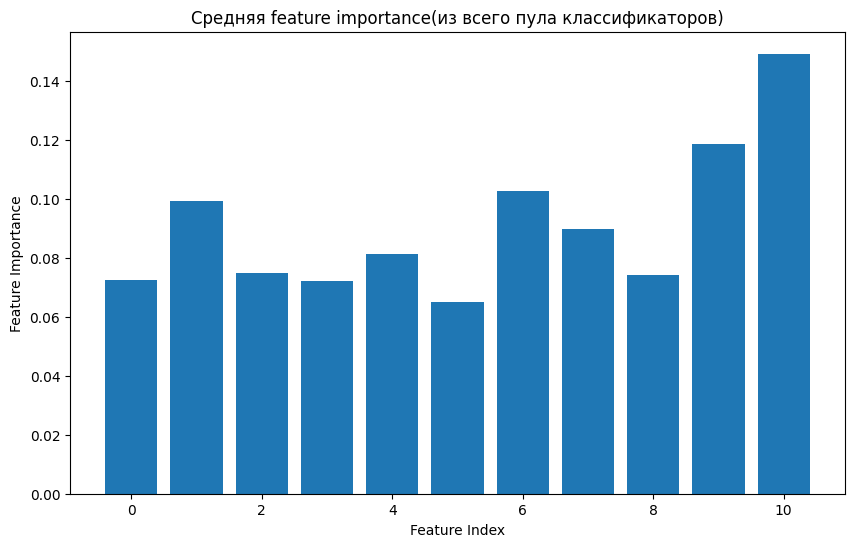

In [504]:
feature_importances = np.zeros(X_train_w.shape[1])
for clf in pool_classifiers_w:
    feature_importances += clf.feature_importances_


feature_importances /= len(pool_classifiers_w)

plt.figure(figsize=(10, 6))
plt.bar(range(X_train_w.shape[1]), feature_importances)
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Средняя feature importance(из всего пула классификаторов)')
plt.show()

In [541]:
feature_names = X_train_w.columns
feature_names


Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [540]:
top_indices = np.argsort(feature_importances)[-5:][::-1]  
top_features = feature_names[top_indices]  
top_importances = feature_importances[top_indices] 

print("Топ-5 самых важных фич:")
for feature, importance in zip(top_features, top_importances):
    print(f"{feature}: {importance:.4f}")

Топ-5 самых важных фич:
alcohol: 0.1493
sulphates: 0.1187
total_sulfur_dioxide: 0.1027
volatile_acidity: 0.0995
density: 0.0899


Эти признаки имеют смысл с точки зрения химического состава вина и его влияния на вкус и аромат (например, **по описанию датасета** сульфаты (`sulphates`) помогают сохранить вино, предотвращая окисление и рост бактерий, поэтому их количество, очевидно, является важным, так же, как и процентное содержание алкоголя (`alcohol`))

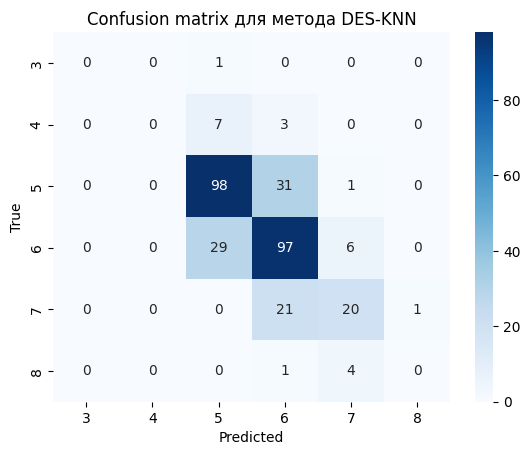

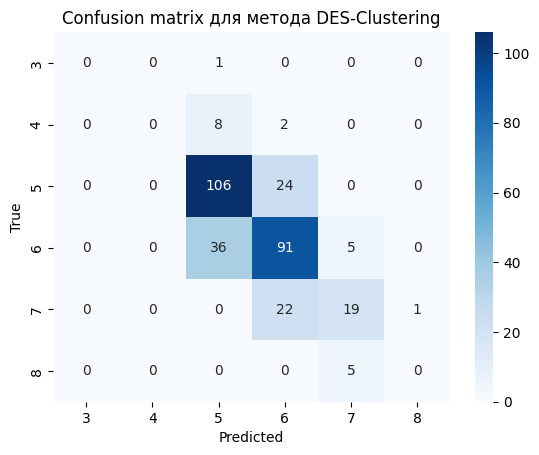

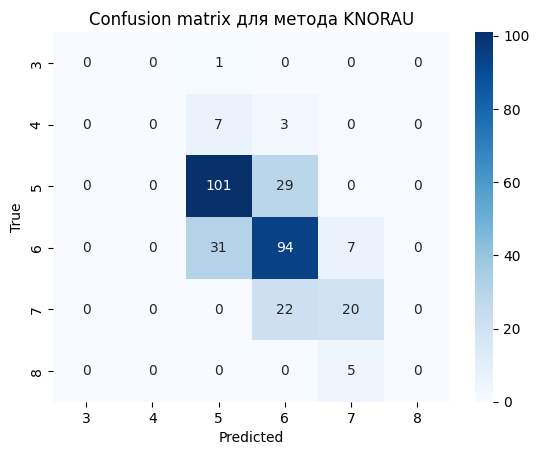

In [523]:
class_labels = [3, 4, 5, 6, 7, 8]  # классы от 3 до 8

cm = confusion_matrix(y_test_w, y_pred_knn)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion matrix для метода DES-KNN')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


cm = confusion_matrix(y_test_w, y_pred_clustering)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',  xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion matrix для метода DES-Clustering')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

cm = confusion_matrix(y_test_w, y_pred_knorau)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion matrix для метода KNORAU')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

Больше всего модели путает 5 и 6 классы и 6 и 7 (представителей этих трех классов сильно больше, чем образцов 3,4 и 8 классов)

In [524]:
unique_classes, counts = np.unique(y_train_w, return_counts=True)

for cls, count in zip(unique_classes, counts):
    print(f"Класс {cls}: {count} образцов")

Класс 3.0: 9 образцов
Класс 4.0: 43 образцов
Класс 5.0: 551 образцов
Класс 6.0: 506 образцов
Класс 7.0: 157 образцов
Класс 8.0: 13 образцов


Модели вообще не предсказывают ни один из классов 3,4 и 8, так как их образцов слишком мало в обучающей выборке

### Датасет higgs

In [527]:
for clf in pool_classifiers_:
    print(clf.feature_importances_)

[0.04107172 0.03077401 0.03024308 0.0398625  0.02998529 0.04918582
 0.03096366 0.03027948 0.00762957 0.03807538 0.03076553 0.03052638
 0.0057351  0.03414391 0.03068821 0.03021067 0.00544143 0.03349375
 0.03046913 0.03026752 0.00515562 0.03924108 0.05386723 0.03193056
 0.04978622 0.10479628 0.06125628 0.06415457]
[0.04160121 0.03051096 0.03029265 0.0393867  0.02995585 0.0493451
 0.03116986 0.0301972  0.00745605 0.03815126 0.03037686 0.0302729
 0.00587161 0.03425045 0.03050014 0.03006907 0.0055581  0.03310437
 0.03045236 0.03022958 0.00505438 0.03940256 0.05330327 0.03204672
 0.05037295 0.1066328  0.06117717 0.06325785]
[0.04179048 0.03052599 0.03012112 0.03908838 0.03027303 0.04920369
 0.03088063 0.0300607  0.00757574 0.03834026 0.03070989 0.03013715
 0.00578442 0.03414382 0.03048082 0.03053574 0.0055644  0.03331661
 0.03040091 0.03019336 0.00515146 0.0392311  0.05347234 0.03222202
 0.05031762 0.1033502  0.06244469 0.06468341]
[0.04116745 0.03019245 0.03049444 0.03949558 0.03025039 0.04

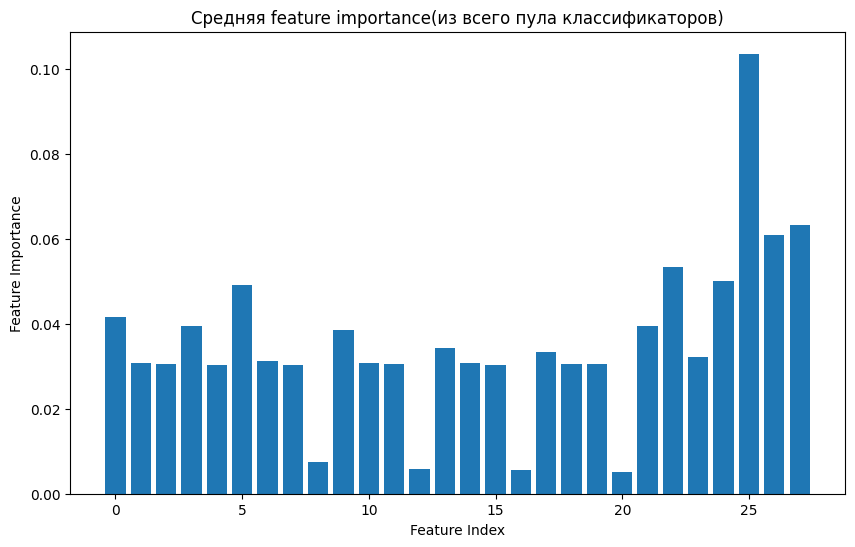

In [528]:
feature_importances_h = np.zeros(X_train_h.shape[1])
for clf in pool_classifiers_:
    feature_importances_h += clf.feature_importances_


feature_importances_h /= len(pool_classifiers_)

plt.figure(figsize=(10, 6))
plt.bar(range(X_train_h.shape[1]), feature_importances_h)
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Средняя feature importance(из всего пула классификаторов)')
plt.show()

Найдем список всех признаков

In [552]:
if hasattr(higgs, 'feature_names'):
    feature_names_h = higgs.feature_names
else:
    feature_names_h = [
        'lepton_pT', 'lepton_eta', 'lepton_phi',
        'missing_energy_magnitude', 'missing_energy_phi',
        'jet_1_pt', 'jet_1_eta', 'jet_1_phi', 'jet_1_b-tag',
        'jet_2_pt', 'jet_2_eta', 'jet_2_phi', 'jet_2_b-tag',
        'jet_3_pt', 'jet_3_eta', 'jet_3_phi', 'jet_3_b-tag',
        'jet_4_pt', 'jet_4_eta', 'jet_4_phi', 'jet_4_b-tag',
        'm_jj', 'm_jjj', 'm_lv', 'm_jlv', 'm_bb', 'm_wbb', 'm_wwbb'
    ]
    

In [553]:
feature_names_h = np.array(feature_names_h)

In [543]:
top_indices = np.argsort(feature_importances_h)[-10:][::-1] 
top_features = [] 
for t in top_indices:
    top_features.append(feature_names_h[t]) 
top_importances = feature_importances_h[top_indices] 

print("Топ 10 самых важных фич:")
for feature, importance in zip(top_features, top_importances):
    print(f"{feature}: {importance:.4f}")

Топ 10 самых важных фич:
m_bb: 0.1036
m_wwbb: 0.0633
m_wbb: 0.0610
m_jjj: 0.0533
m_jlv: 0.0501
jet1pt: 0.0493
lepton_pT: 0.0415
missing_energy_magnitude: 0.0395
m_jj: 0.0394
jet2pt: 0.0384


In [ ]:
df = pd.DataFrame(X_higgs)

columns = [
    'lepton_pT', 'lepton_eta', 'lepton_phi', 'missing_energy_magnitude', 'missing_energy_phi',
    'jet_1_pt', 'jet_1_eta', 'jet_1_phi', 'jet_1_b_tag', 'jet_2_pt', 'jet_2_eta', 'jet_2_phi', 'jet_2_b_tag',
    'jet_3_pt', 'jet_3_eta', 'jet_3_phi', 'jet_3_b_tag', 'jet_4_pt', 'jet_4_eta', 'jet_4_phi', 'jet_4_b_tag',
    'm_jj', 'm_jjj', 'm_lv', 'm_jlv', 'm_bb', 'm_wbb', 'm_wwbb'
]
df.columns = columns 
df

,lepton_pT,lepton_eta,lepton_phi,missing_energy_magnitude,missing_energy_phi,jet_1_pt,jet_1_eta,jet_1_phi,jet_1_b_tag,jet_2_pt,...,jet_4_eta,jet_4_phi,jet_4_b_tag,m_jj,m_jjj,m_lv,m_jlv,m_bb,m_wbb,m_wwbb
0,0.907542,0.329147,0.359412,1.497970,-0.313010,1.095531,-0.557525,-1.588230,2.173076,0.812581,...,-1.138930,-0.000819,0.000000,0.302220,0.833048,0.985700,0.978098,0.779732,0.992356,0.798343
1,0.798835,1.470639,-1.635975,0.453773,0.425629,1.104875,1.282322,1.381664,0.000000,0.851737,...,1.128848,0.900461,0.000000,0.909753,1.108330,0.985692,0.951331,0.803252,0.865924,0.780118
2,1.344385,-0.876626,0.935913,1.992050,0.882454,1.786066,-1.646778,-0.942383,0.000000,2.423265,...,-0.678379,-1.360356,0.000000,0.946652,1.028704,0.998656,0.728281,0.869200,1.026736,0.957904
3,1.105009,0.321356,1.522401,0.882808,-1.205349,0.681466,-1.070464,-0.921871,0.000000,0.800872,...,-0.373566,0.113041,0.000000,0.755856,1.361057,0.986610,0.838085,1.133295,0.872245,0.808487
4,1.595839,-0.607811,0.007075,1.818450,-0.111906,0.847550,-0.566437,1.581239,2.173076,0.755421,...,-0.654227,-1.274345,3.101961,0.823761,0.938191,0.971758,0.789176,0.430553,0.961357,0.957818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98045,0.908091,-0.825006,-0.830871,0.736298,1.512713,0.881811,-0.363440,0.006813,1.086538,0.763227,...,-0.187013,0.716785,0.000000,1.317681,1.010795,0.985962,0.957878,1.454672,0.903937,0.786069
98046,2.512898,0.530759,-1.470626,1.641798,1.613386,0.934027,1.521958,-0.049836,0.000000,1.029891,...,0.053673,-0.386483,0.000000,0.774413,0.745263,0.997088,1.392387,0.864681,1.179783,1.086167
98047,0.903699,0.261943,-0.429149,1.892855,0.313687,0.493396,-1.494282,-1.458506,0.000000,0.575505,...,-0.283621,1.110772,3.101961,0.527038,0.607263,1.125286,0.634106,0.115543,0.425828,0.692506
98048,0.566047,-0.317568,0.062561,0.358186,-1.315823,0.691176,1.154583,-0.242759,2.173076,0.680634,...,-0.844943,-0.294922,0.000000,0.747239,1.008975,0.989497,1.203147,0.892492,1.090807,0.888965


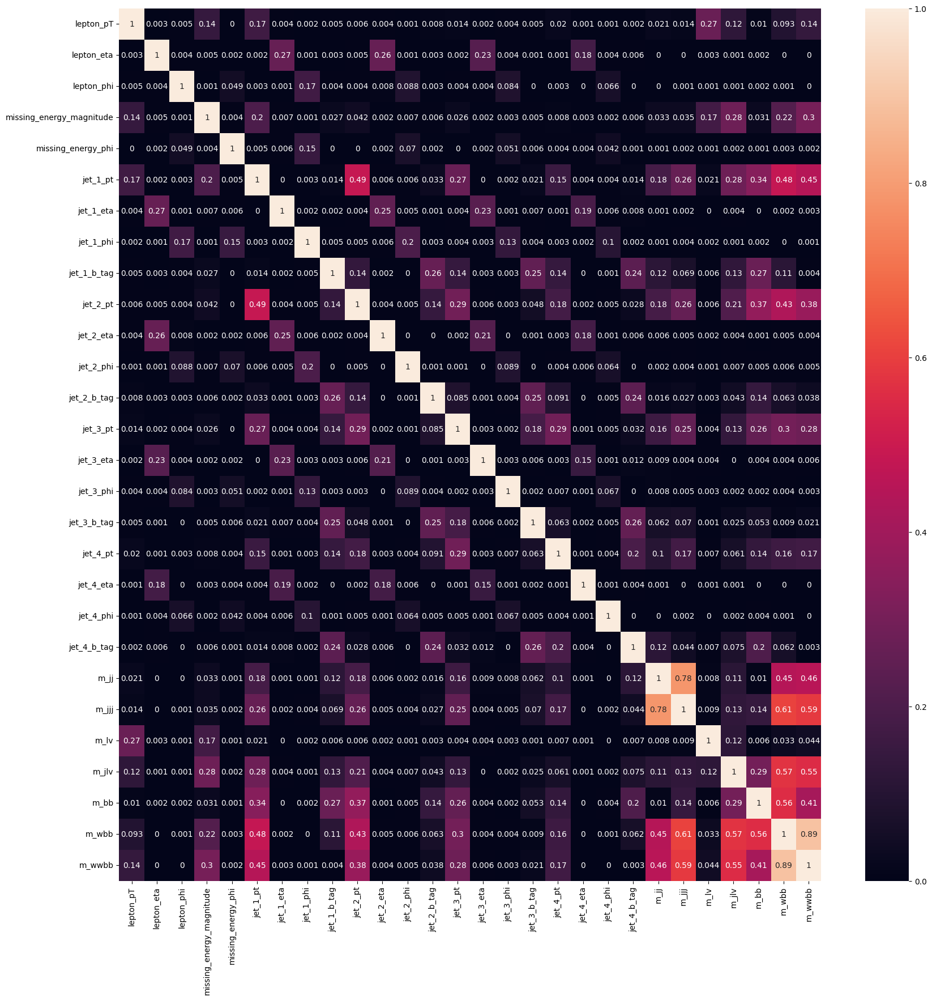

In [563]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(20, 20)
matrix = df.corr().abs().round(3)
sns.heatmap(matrix, annot=True, ax=ax)

plt.show()

Самая высокая корреляция между двумя последними признаками, m_wbb и m_wwbb около 90% и между m_jj и m_jjj около 80%, они все относятся к важным фичам,
поэтому эти корреляции между m_wbb и m_wwbb, а также между m_jj и m_jjj, может указывать на избыточность. 

Можно попробовать удалить один из каждой пары (например, m_wbb и m_jj, так как они чуть менее важные), чтобы упростить модель 

Остальные важные признаки (m_jlv, jet1pt, lepton_pT, missing_energy_magnitude, jet2pt) стоит оставить, тк они не так сильно коррелируют с другими признаками 

# Task 2: Clustering

Реализуйте distance and density based clustering Из лекции 5. Возьмите датасеты из http://cs.joensuu.fi/sipu/datasets/  (хотя бы 4 разных, среди которых как те, где больше трех измерений, так и те, где их только два. Для двумерных делайте визуализации) и покажите как работает на них данный метод (предположим, что мы точно знаем сколько должно быть кластеров), в качестве метрики считайте normalized_mutual_info_score из sklearn. Сделайте выводы на основе графиков расстояния/плотности о структуре данных/наличии выбросов и т.п. 3 балла

**Дополнительно**:

Исследуйте помогают ли методы определния количества кластеров из лекции для этих датасетов. 1 балл

Попробуйте найти методы получше для датасетов исходя из формы и описания датасетов. 1 балл + 1 балл за использование нестандартных методов (можно уточнить у преподавателя будет ли тот или иной фреймворк или метод засчитываться за "нестандартный")


### Реализуем distance and density based clustering 

In [55]:
def calculate_local_density(points, dc):
    distances = cdist(points, points)
    densities = np.sum(distances < dc, axis=1) - 1  # убираем саму точку, тк до нее расстрояние dist=0, то есть dist < dc и мы прибавили лишнюю 1
    return densities

def calculate_min_distance_to_higher_density(points, densities):
    n = len(points)
    distances = cdist(points, points)
    delta = np.zeros(n)
    
    for i in range(n):
        higher_density_indices = np.where(densities > densities[i])[0]
        if len(higher_density_indices) > 0:
            delta[i] = np.min(distances[i, higher_density_indices])  # ближайшая точка с больщей плотностью
        else:
            delta[i] = np.max(distances[i])  # точка с максимальной плотностью
    
    return delta

def find_cluster_centers(densities, delta, num_centers):
    # точки с наибольшими значениями densities * delta
    scores = densities * delta
    cluster_centers = np.argsort(scores)[-num_centers:]
    return cluster_centers


def send_points_to_clusters(points, densities, cluster_centers):
    n = len(points)
    cluster_labels = -np.ones(n, dtype=int)
    distances = cdist(points, points)
    
    # центры кластеров
    for i in cluster_centers:
        cluster_labels[i] = i
    
    sorted_indices = np.argsort(-densities) # сорт по убыванию плотности, чтобы для каждой точки найти соседа с наиб плотностью
    
    for i in sorted_indices:
        if cluster_labels[i] == -1:  # если точка еще не назначена в кластер
            higher_density_indices = np.where(densities > densities[i])[0]
            
            if len(higher_density_indices) > 0:
                # находим ближайшую точку с большей плотностью
                nearest_higher_density = higher_density_indices[np.argmin(distances[i, higher_density_indices])]
                cluster_labels[i] = cluster_labels[nearest_higher_density]
            else:
                # если нет точек с большей плотностью, назначаем точку в кластер самой себя
                cluster_labels[i] = i
    
    return cluster_labels

def identify_noise(points, cluster_labels, noise_threshold):
    distances_to_centers = np.array([np.min(cdist([point], points[cluster_labels != -1])) for point in points])
    noise_labels = (distances_to_centers > noise_threshold) & (cluster_labels == -1)
    return noise_labels

In [227]:
# собираем все в одну функцию
def distance_and_density_based_clustering(points, num_centers, dc=0.1):
    densities = calculate_local_density(points, dc)
    delta = calculate_min_distance_to_higher_density(points, densities)
        
    cluster_centers = find_cluster_centers(densities, delta, num_centers)
     
    # plt.figure(figsize=(10, 6))
    # plt.scatter(densities, delta, c='blue', label='Точки')
    # plt.xlabel('Локальная плотность (p_i)')
    # plt.ylabel('Минимальное расстояние до более плотной точки (delta_i)')
    # plt.title('Зависимость delta_i от p_i')
    # plt.scatter(densities[cluster_centers], delta[cluster_centers], c='red', s=100, label='Центры кластеров')
    # plt.legend()
    # plt.show()

    cluster_labels = send_points_to_clusters(points, densities, cluster_centers)
    noise_labels = identify_noise(points, cluster_labels, noise_threshold=0.2)
    # print(np.sum(noise_labels))
    cluster_labels = np.array([cluster_labels[i] if not noise_labels[i] else -1 for i in range(len(list(cluster_labels)))])
    
    return cluster_labels, cluster_centers

    

In [232]:
def distance_and_density_based_clustering_plt(points, num_centers, dc=0.1):
    densities = calculate_local_density(points, dc)
    delta = calculate_min_distance_to_higher_density(points, densities)

    cluster_centers = find_cluster_centers(densities, delta, num_centers)
     
    plt.figure(figsize=(10, 6))
    plt.scatter(densities, delta, c='blue', label='Точки')
    plt.xlabel('Локальная плотность (p_i)')
    plt.ylabel('Минимальное расстояние до более плотной точки (delta_i)')
    plt.title('Зависимость delta_i от p_i')
    # plt.scatter(densities[cluster_centers], delta[cluster_centers], c='red', s=100, label='Центры кластеров')
    plt.legend()
    plt.show()

    

In [165]:
# функция для присвоения кластеру порядкого номера вместо номера центра кластера
def real_clustesrs_num(cluster_labels):
    centroids = np.unique(cluster_labels)
    nums = {}

    for idx, item in enumerate(centroids):
        nums[item] = idx + 1

    cluster_labels = np.array([nums[cl] for cl in cluster_labels])  
    return cluster_labels  


## Рассмотрим 2d датасет Unbalance
Будем перебирать различные dc (три плотных кластера располагаются близко друг к другу, но далеко от 5 разреженных кластеров, поэтому сложно подобрать оптимальное dc)

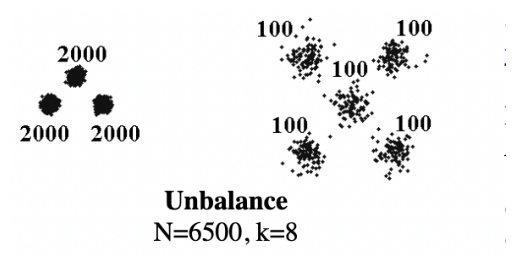

In [166]:
image_path = 'data/unbalanced/unbalanced_true.png'
img = mpimg.imread(image_path)
plt.imshow(img)
plt.axis('off') 
plt.show()

In [258]:
data = np.loadtxt('data/unbalanced/points.txt')

3500


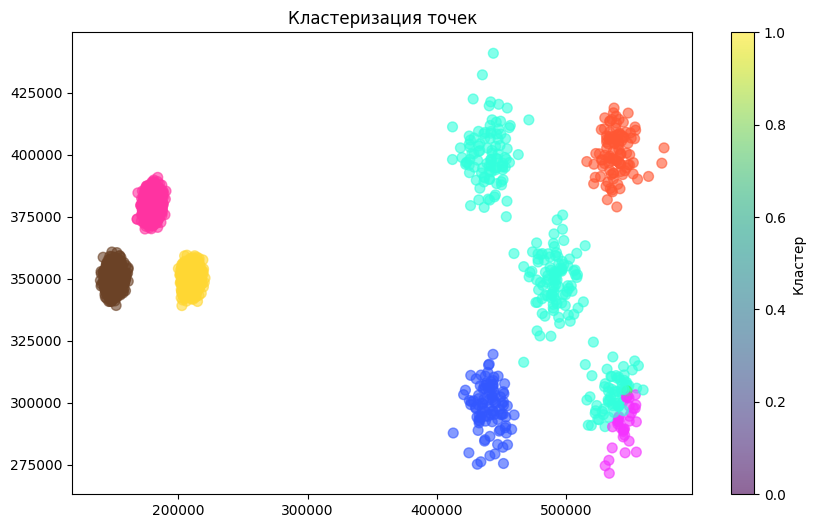

3550


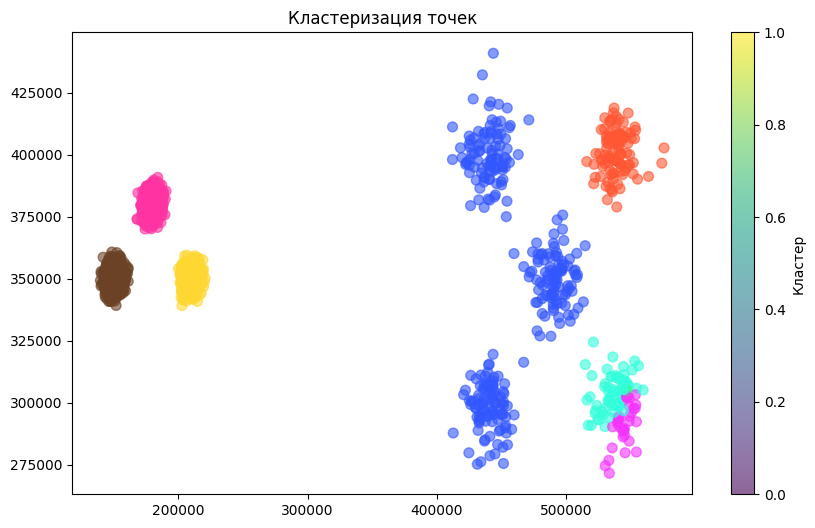

3600


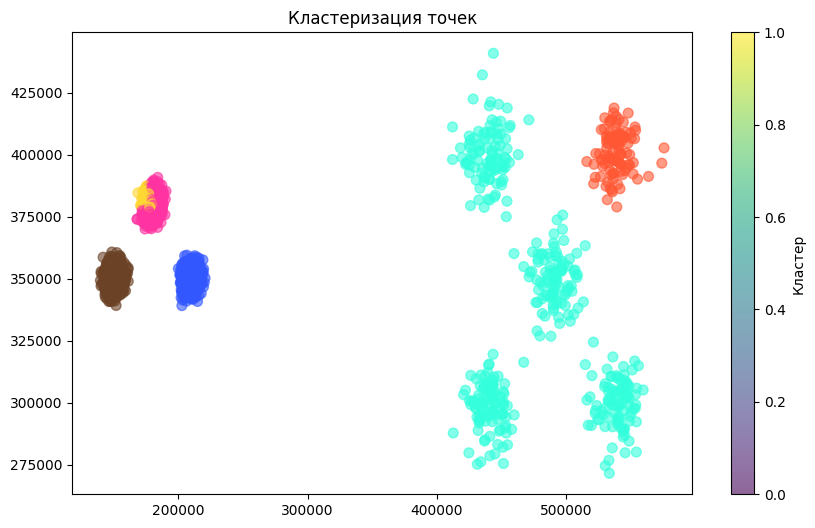

3650


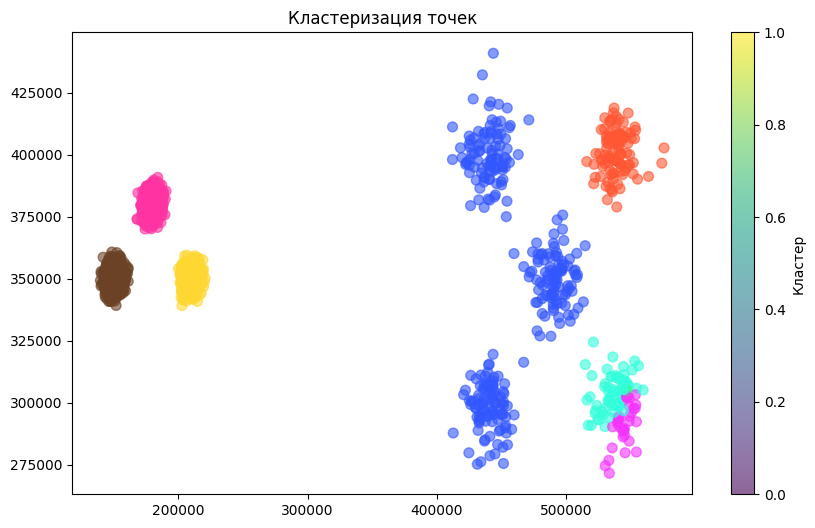

3700


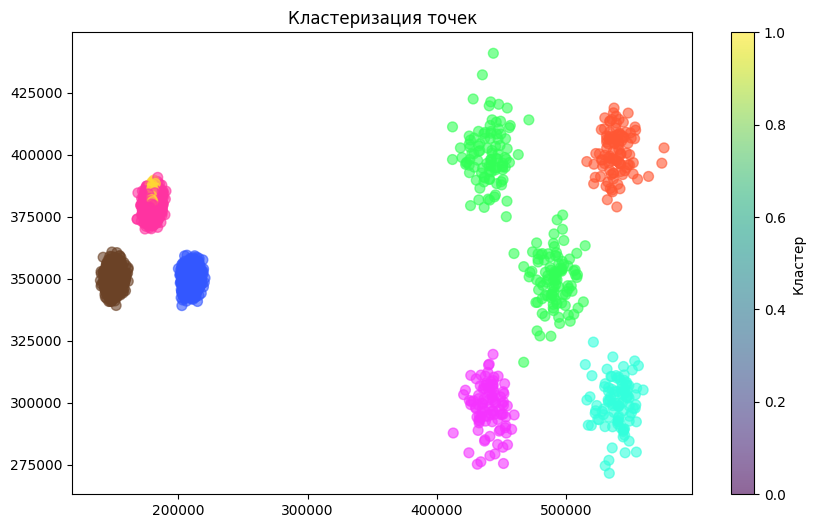

3750


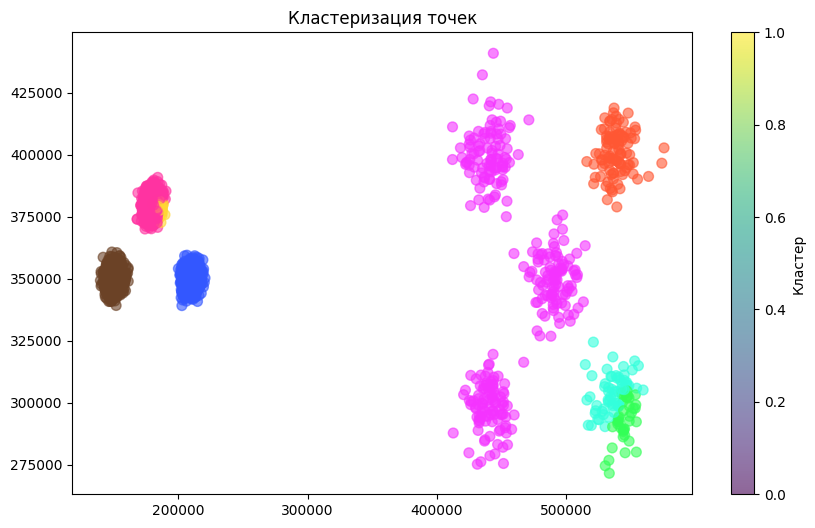

3800


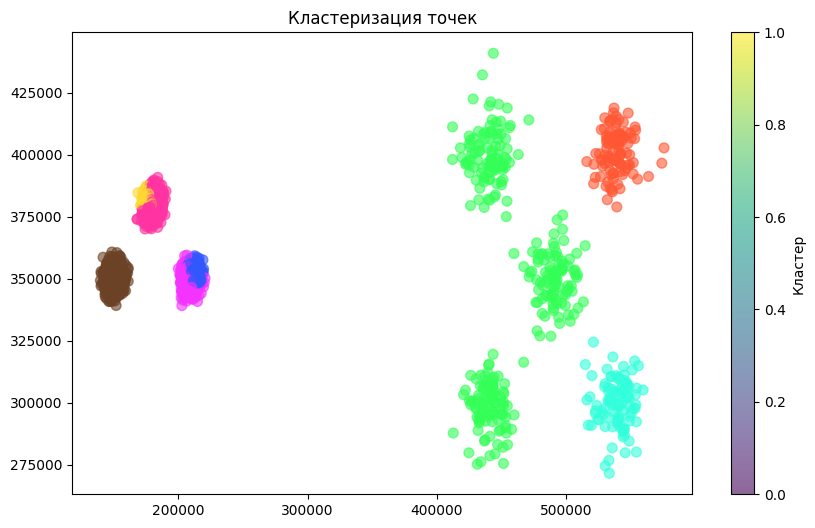

3850


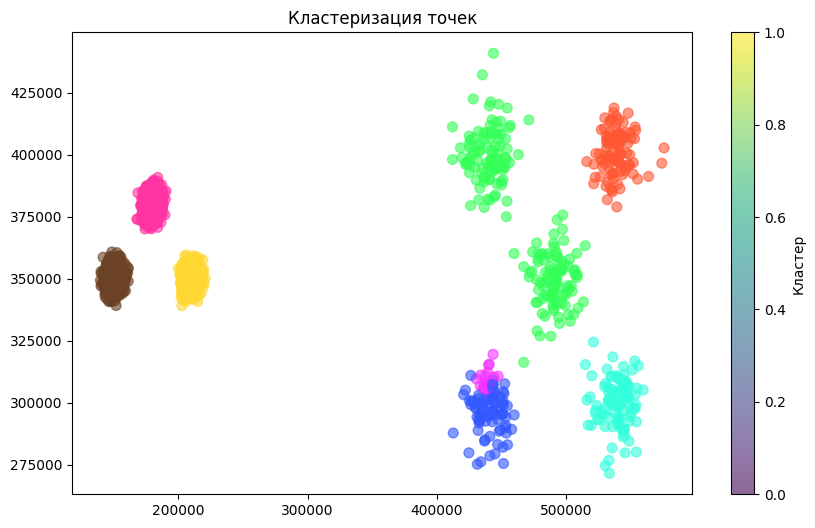

3900


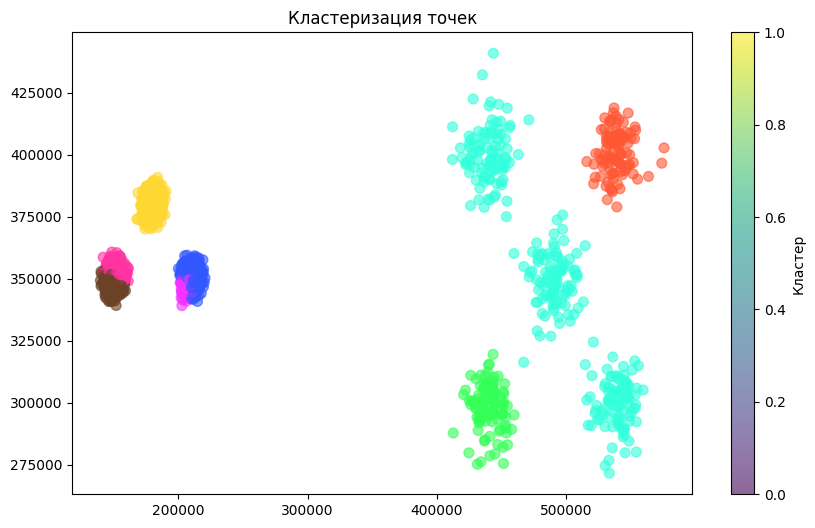

3950


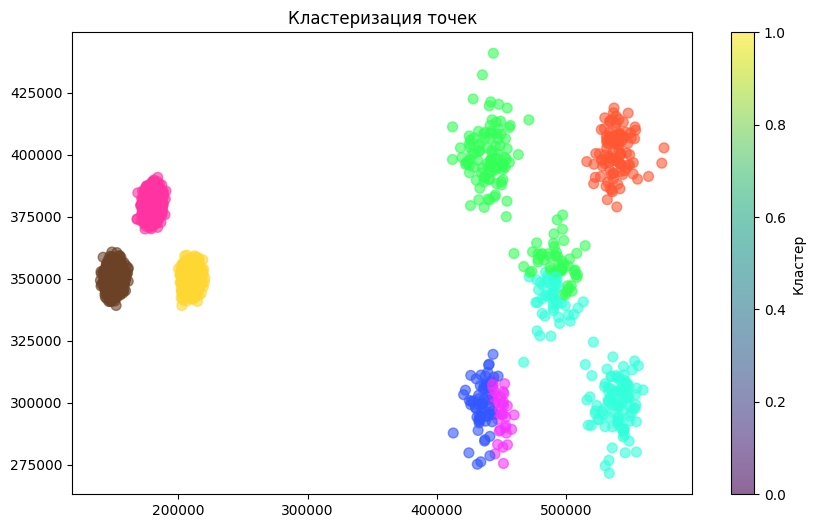

4000


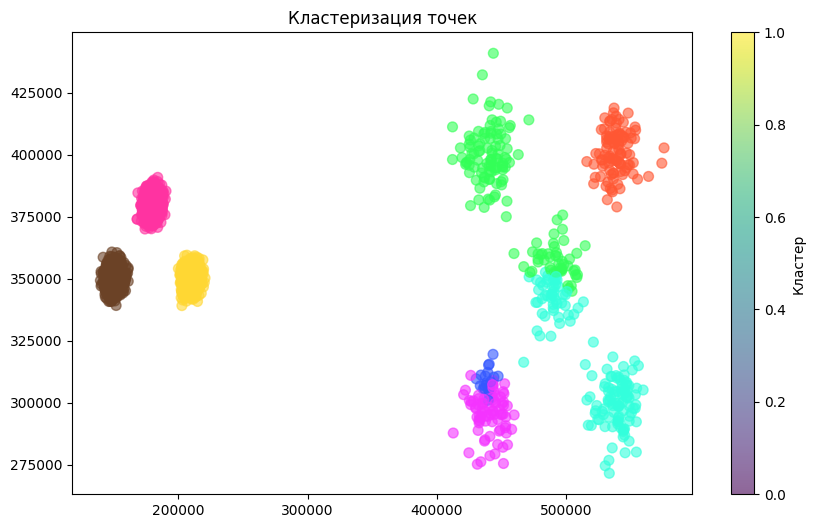

4050


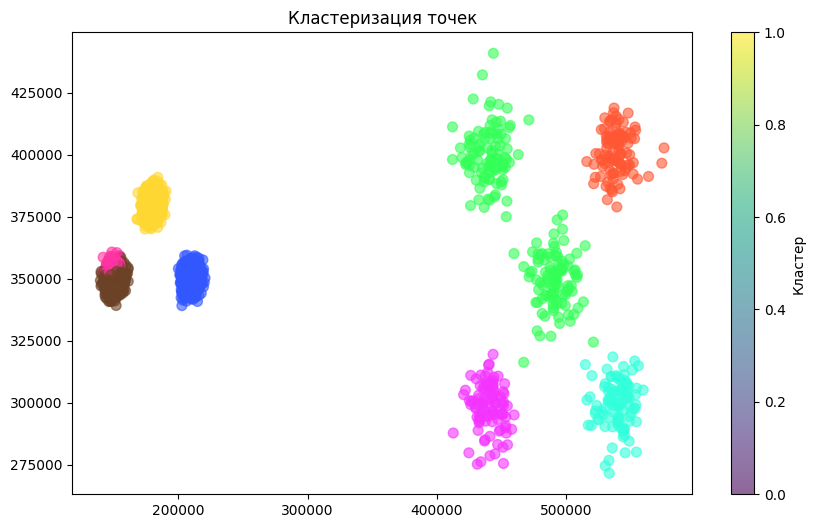

4100


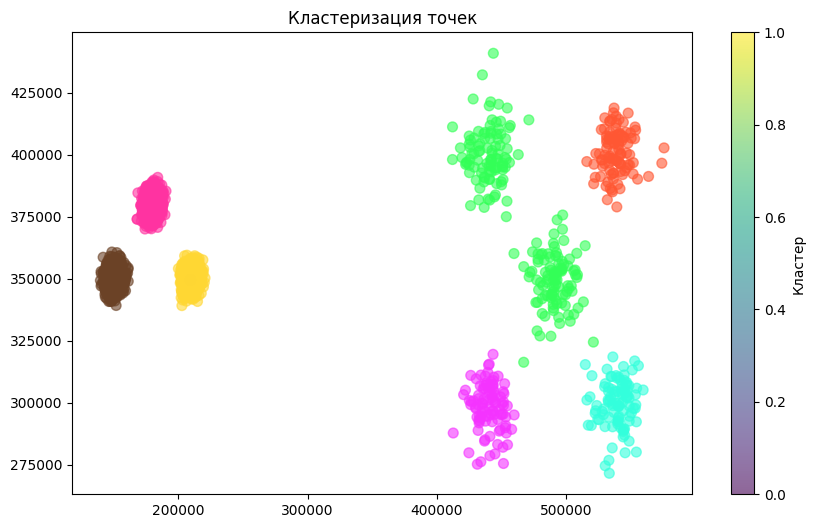

4150


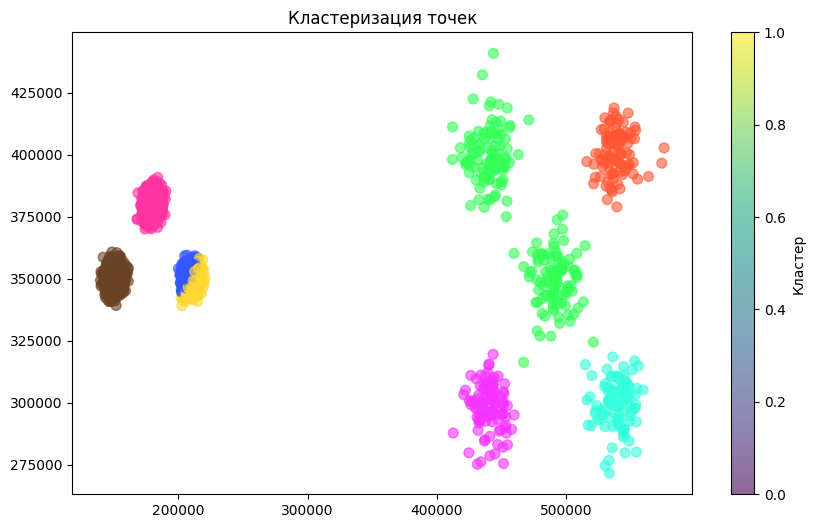

4200


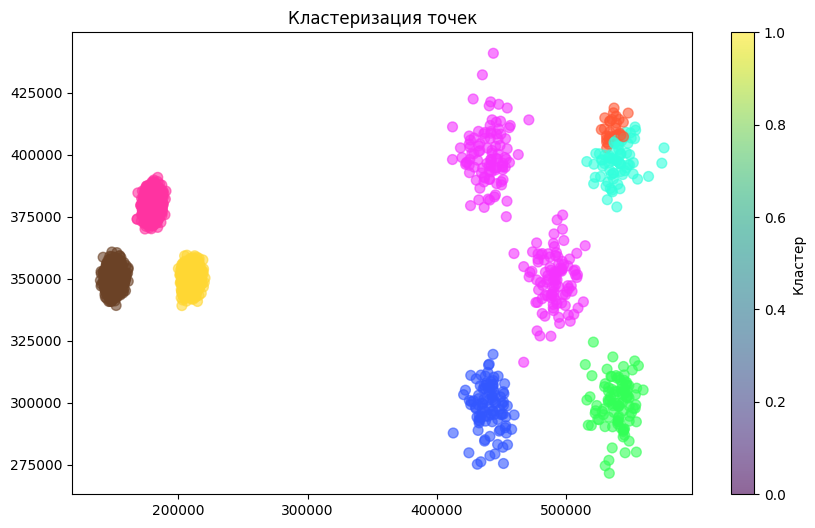

4250


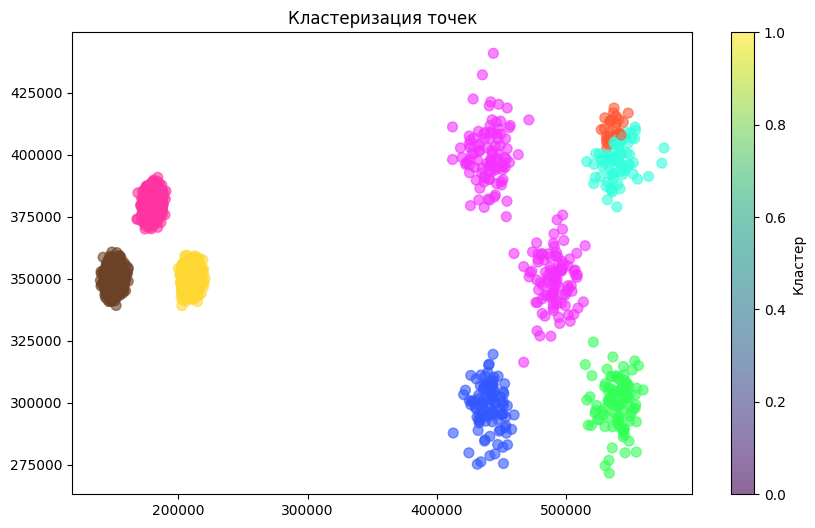

4300


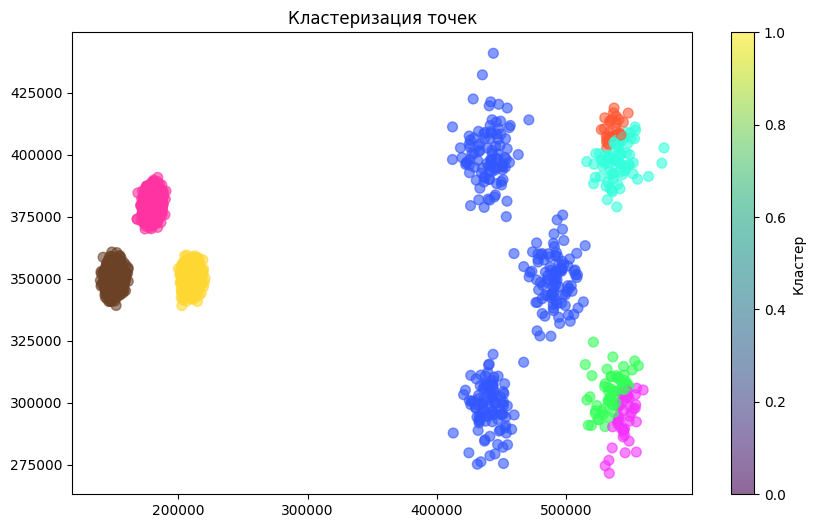

In [167]:
for dc in range(3500, 4301, 50):
    print(dc)
    num_clusters = 8
    cluster_labels, cluster_centers = distance_and_density_based_clustering(data, num_clusters, dc=dc)
    cluster_labels = real_clustesrs_num(cluster_labels)

    plt.figure(figsize=(10, 6))
    colors = ['#6B4226','#FF33A1', '#FFD733', '#3357FF', '#F433FF','#33FF57', '#33FFDC', '#FF5733']
    plt.scatter(data[:, 0], data[:, 1], c=[colors[label-1] for label in cluster_labels], s=50, alpha=0.6)
    plt.title('Кластеризация точек')
    plt.colorbar(label='Кластер')
    plt.show()

In [ ]:
for dc in range(3500, 4301, 50):
    print(dc)
    num_clusters = 8
    cluster_labels, cluster_centers = distance_and_density_based_clustering(data, num_clusters, dc=dc)
    cluster_labels = real_clustesrs_num(cluster_labels)

    plt.figure(figsize=(10, 6))
    colors = ['#6B4226','#FF33A1', '#FFD733', '#3357FF', '#F433FF','#33FF57', '#33FFDC', '#FF5733']
    plt.scatter(data[:, 0], data[:, 1], c=[colors[label-1] for label in cluster_labels], s=50, alpha=0.6)
    plt.title('Кластеризация точек')
    plt.colorbar(label='Кластер')
    plt.show()

***Если взять dc маленьким, то 5 кластеров справа будут отнесены в один и разбиение будет просиходить между оставшимися,*** **пример**

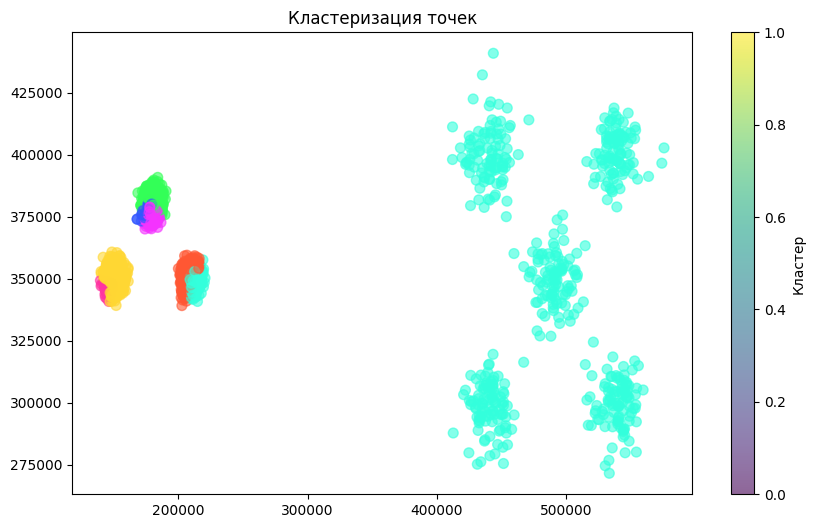

In [168]:
num_clusters = 8
cluster_labels, cluster_centers = distance_and_density_based_clustering(data, num_clusters, dc=100)
cluster_labels = real_clustesrs_num(cluster_labels)

plt.figure(figsize=(10, 6))
colors = ['#6B4226','#FF33A1', '#FFD733', '#3357FF', '#F433FF','#33FF57', '#33FFDC', '#FF5733']
plt.scatter(data[:, 0], data[:, 1], c=[colors[label-1] for label in cluster_labels], s=50, alpha=0.6)
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

Остановимся на 4250

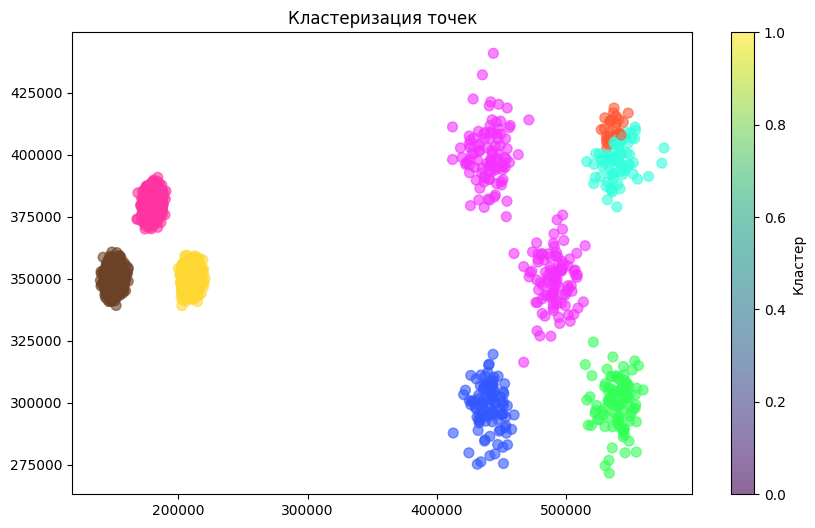

In [169]:
num_clusters = 8
cluster_labels, cluster_centers = distance_and_density_based_clustering(data, num_clusters, dc=4250)
cluster_labels = real_clustesrs_num(cluster_labels)

plt.figure(figsize=(10, 6))
colors = ['#6B4226','#FF33A1', '#FFD733', '#3357FF', '#F433FF','#33FF57', '#33FFDC', '#FF5733']
plt.scatter(data[:, 0], data[:, 1], c=[colors[label-1] for label in cluster_labels], s=50, alpha=0.6)
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

In [170]:
true_labels = np.loadtxt('data/unbalanced/true_clusters.txt')

In [171]:
nmi = normalized_mutual_info_score(true_labels, cluster_labels)
print(f"Normalized mutual information: {nmi}")


Normalized Mutual Information: 0.9884952686596148


**normalized_mutual_info_score получился довольно высокий (около 1 - хороший результат) за счет того, что три плотных кластера по 2000 точек правильно найдены, а ошибки есть только в двух разреженных классах по 100 точек**

#### Посмотрим на графики плотности/расстояния

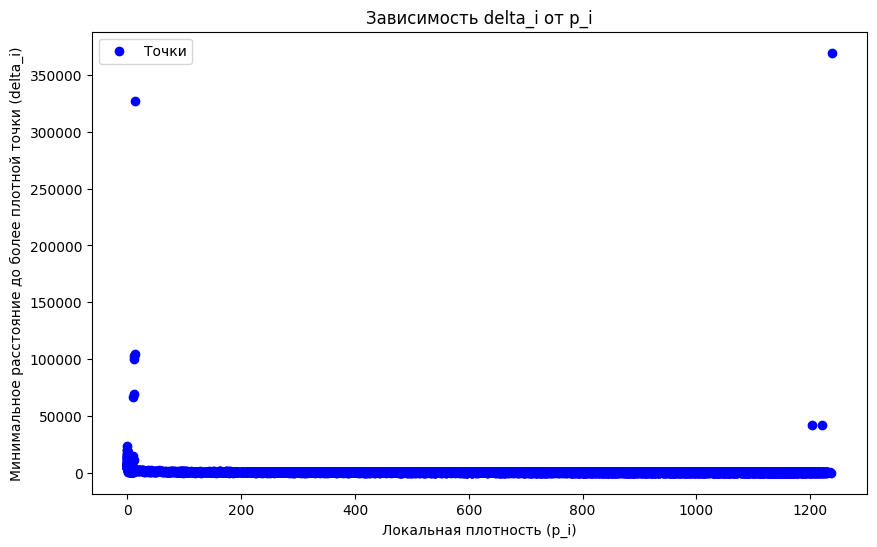

In [259]:
distance_and_density_based_clustering_plt(data, 8, dc=4250)

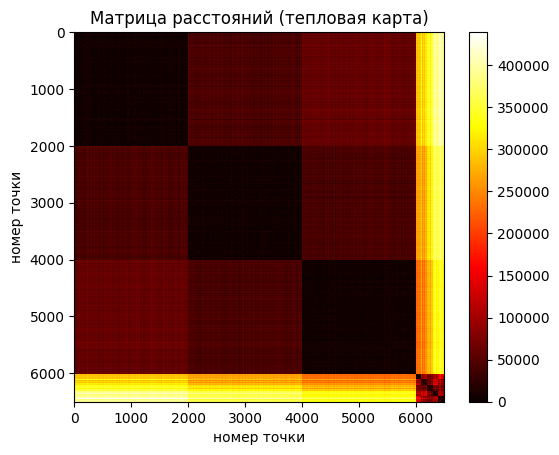

In [243]:
distance_matrix = cdist(data, data)

plt.imshow(distance_matrix, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Матрица расстояний (тепловая карта)')
plt.xlabel('номер точки')
plt.ylabel('номер точки')
plt.show()


### Выводы о данных и методе
На основе двух графиков:
- В верхней части графика есть несколько точек с большими значениями $\delta_i $, они являются кандидатами в центры кластеров (тк по данному алгоритму кластеризации такие точки считаются потенциальными центрами кластеров)
- Основная масса точек имеет низкие значения $\delta_i $, что означает, что они расположены в плотных областях и имеют близких соседей с большей плотностью, что говорит о существовании кластеров с высокой локальной плотностью (как мы видим на визуализации выше, у нас ессть три плотных кластера по 2000 точек)
- Локальная плотность $ p_i $ сильно варьируется: есть точки с очень высокой плотностью и точки с низкой плотностью, то есть  в данных присутствуют как плотные, так и разреженные области (тоже видно на картинках выше)
- По матрице расстояний тоже хорошо видна структура данных: бОльшая часть точек расположена близко друг другу (и по черным квадратам, то есть минимальным расстояниям как раз выделяется три плотных кластера), и совсем малая часть точек расположена в отдалениии от этого большинства, но близко друг к другу (и по маленькому квадрату справа внизу тоже можно заметить четкие 5 кластеров). Данные устроены так (если посмотреть на файлы с правильным разбиением), что сначала перечислены все точки из одного кластера, потом из следующего и тд (все представленные тут датасеты)

По результату получившейся кластеризации:
- normalized_mutual_info_score получился довольно высокий (около 0.99) за счет того, что три плотных кластера по 2000 точек правильно найдены, а ошибки есть только в двух разреженных классах по 100 точек
- Алгоритм хорошо справился с кластеризацией плотных кластеров (по 2000 точек)
- Алгоритм не смог полностью корректно разделить разреженные группы, возможно, потому что они близки друг к другу, при этом параметр dc отвечает за радиус локальной плотности и трудно подобрать идеальный параметр dc, тк плотные кластеры и разреженные кластеры имеют разные характеристики плотности, и тот же параметр dc может работать хорошо для плотных, но плохо для разреженных

## Рассмотрим еще один 2d датасет A1

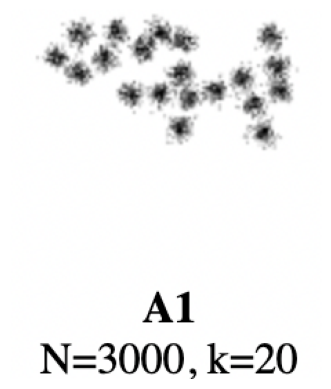

In [172]:
image_path = 'data/a1/a1_true.png'
img = mpimg.imread(image_path)
plt.imshow(img)
plt.axis('off') 
plt.show()

In [260]:
data = np.loadtxt('data/a1/points.txt')
true_labels = np.loadtxt('data/a1/true_clusters.txt')

Также попробуем разные dc (сильно меньше 500 брать нет смысла, тк справа кластеры кучно собраны и это слишком маленькое число)

**пример**

Normalized mutual information: 0.6142854927898603


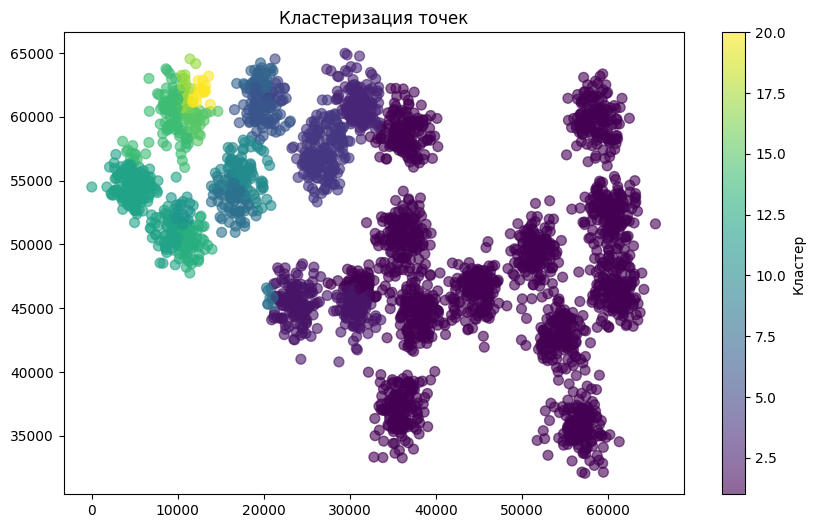

In [184]:
num_clusters = 20
cluster_labels_, cluster_centers_ = distance_and_density_based_clustering(data, num_clusters, dc=100)
cluster_labels_ = real_clustesrs_num(cluster_labels_)
print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels_)}")

plt.figure(figsize=(10, 6))
plt.scatter(data[:, 0], data[:, 1], c=cluster_labels_, s=50, alpha=0.6) 
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

500
Normalized mutual information: 0.8901289287017787


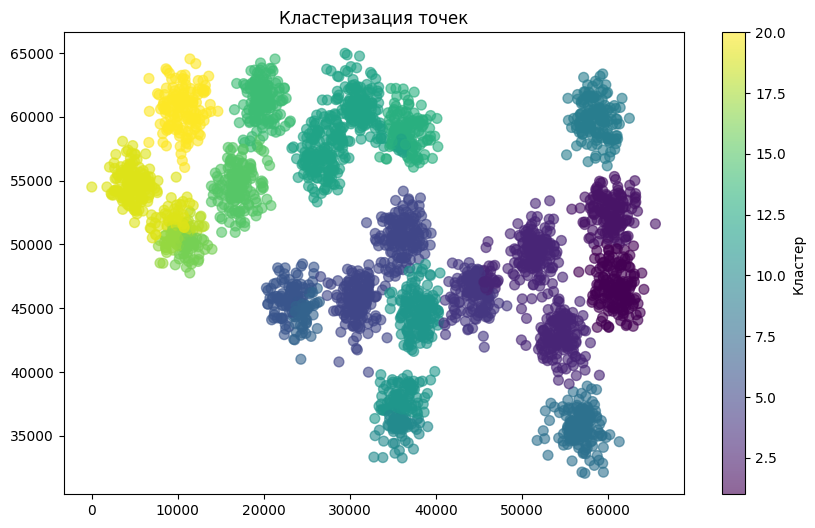

600
Normalized mutual information: 0.8792606079241931


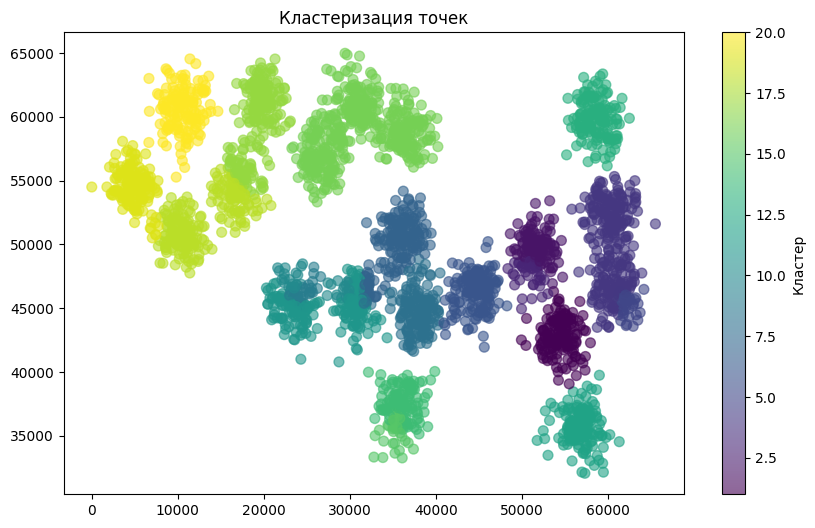

700
Normalized mutual information: 0.9172859832099052


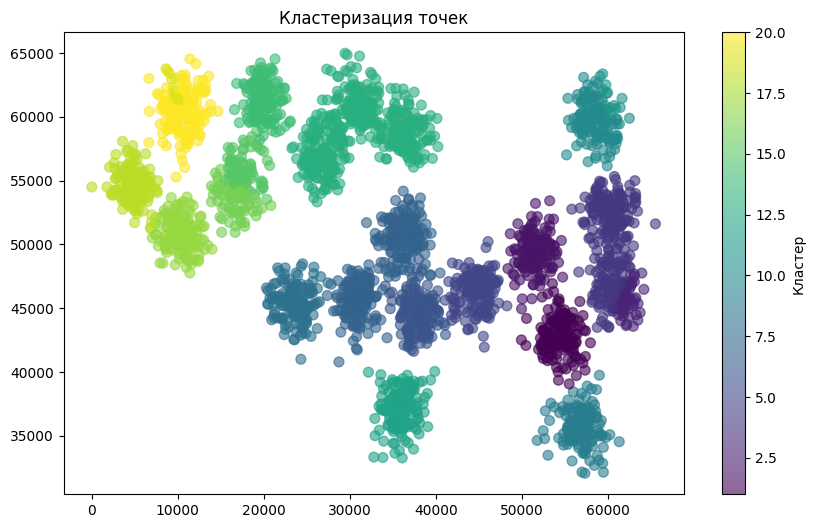

800
Normalized mutual information: 0.9106822642520529


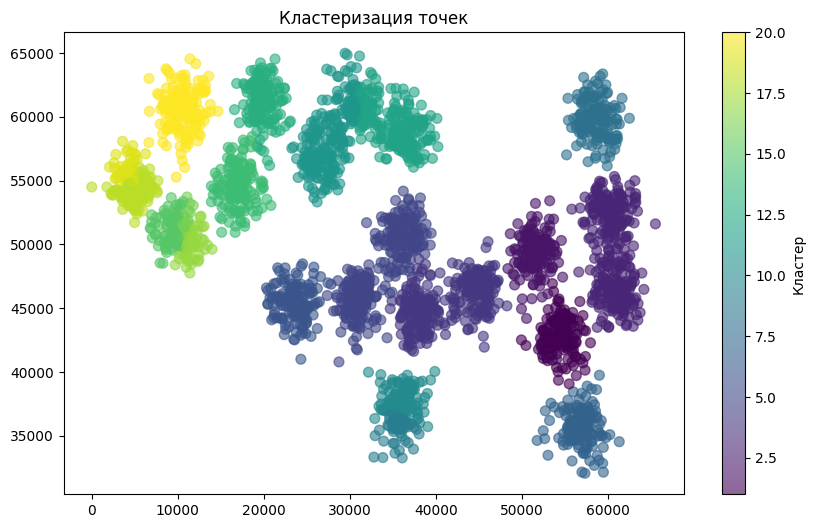

900
Normalized mutual information: 0.8361146904807312


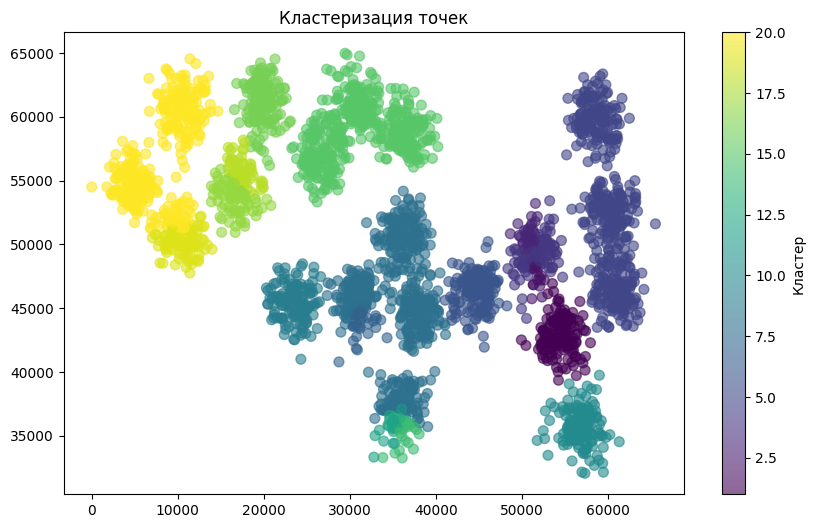

1000
Normalized mutual information: 0.8830261401396223


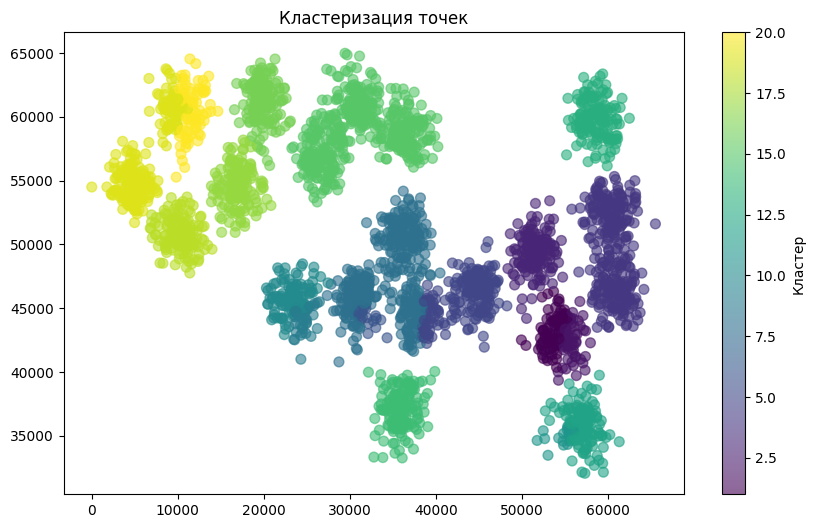

1100
Normalized mutual information: 0.8864781490410374


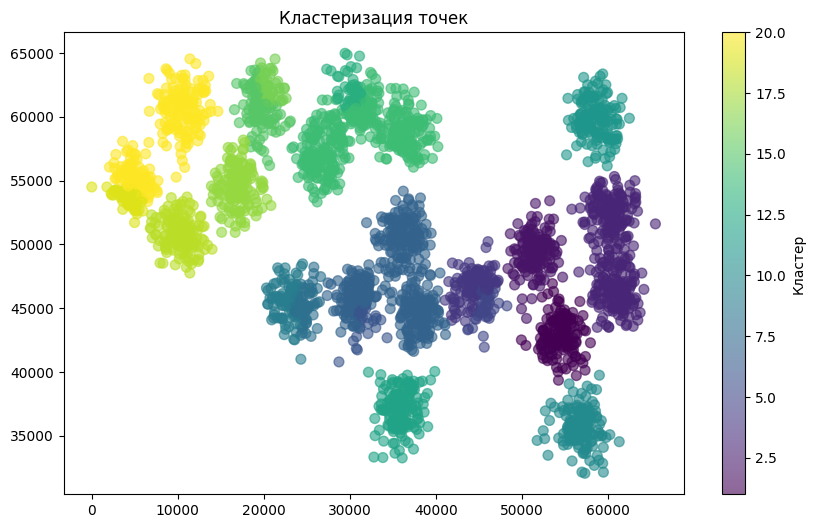

1200
Normalized mutual information: 0.9274093262946714


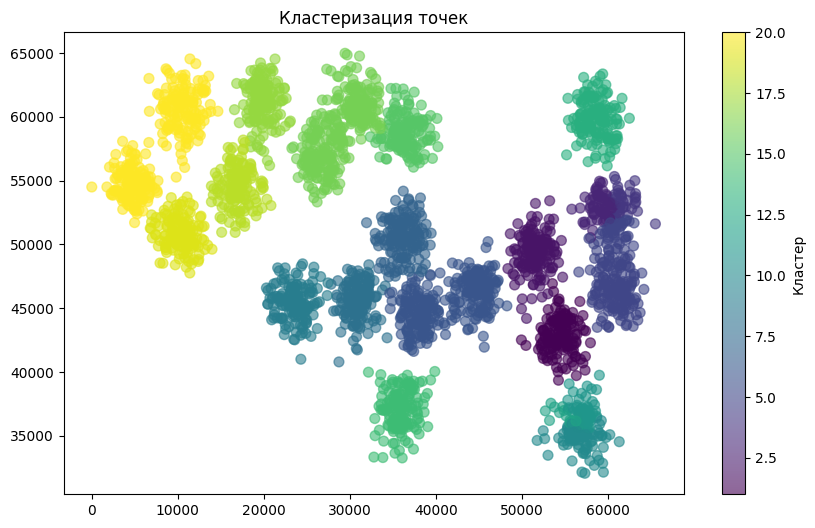

1300
Normalized mutual information: 0.9243653580716272


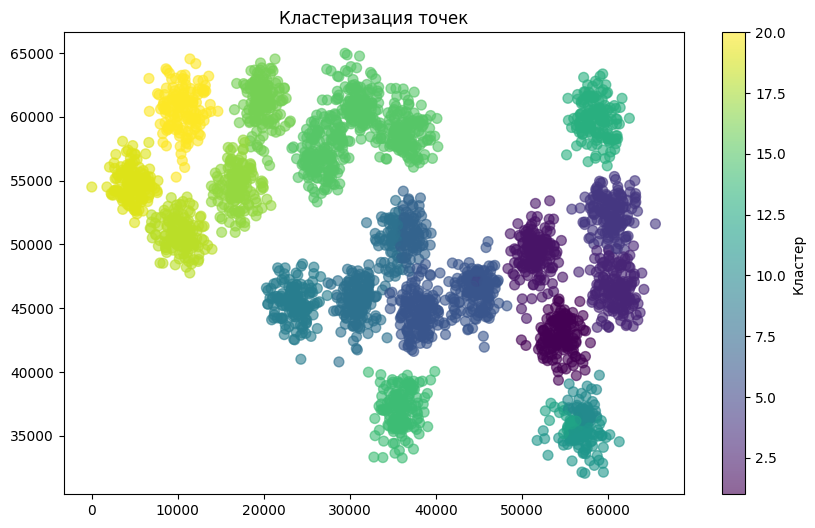

1400
Normalized mutual information: 0.9376521566347258


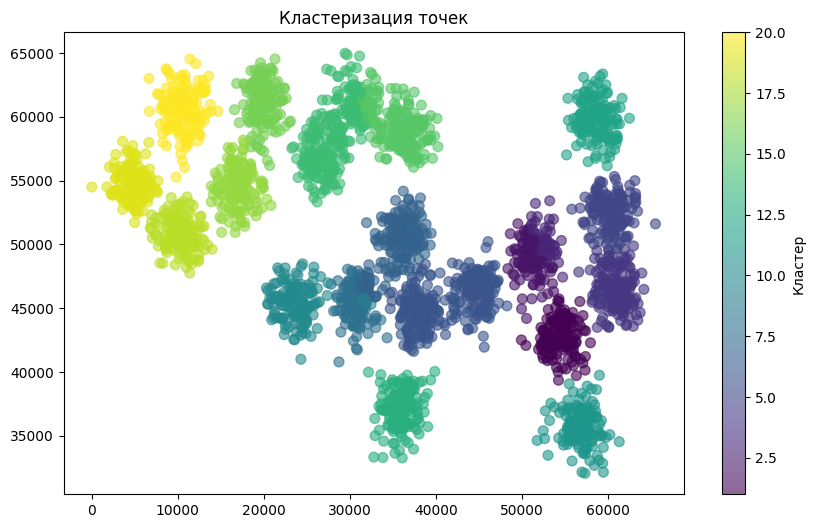

1500
Normalized mutual information: 0.9176398001407203


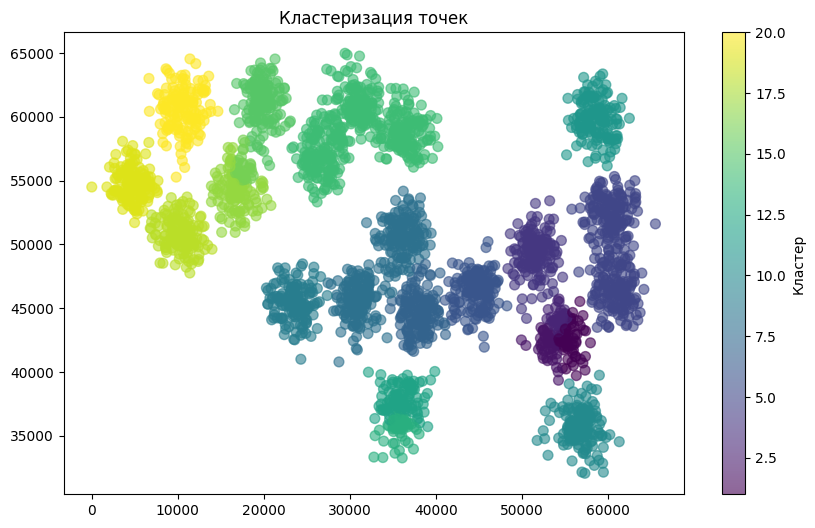

1600
Normalized mutual information: 0.8695906504682539


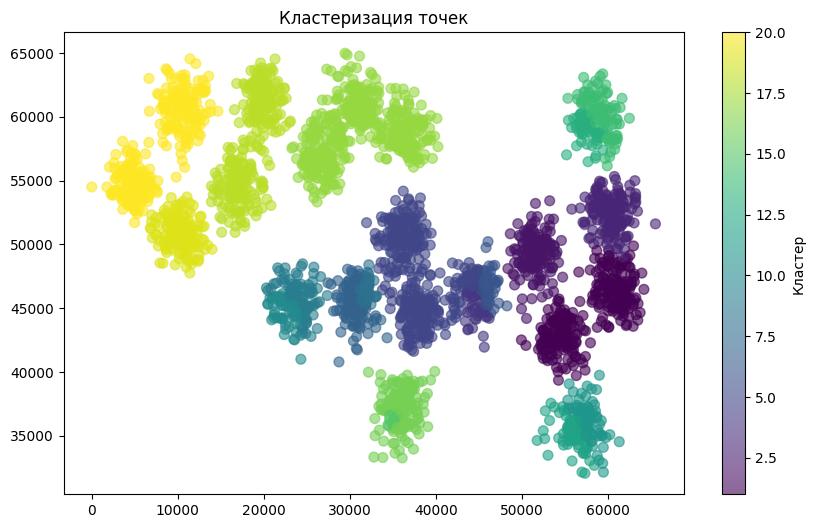

1700
Normalized mutual information: 0.8860365206937337


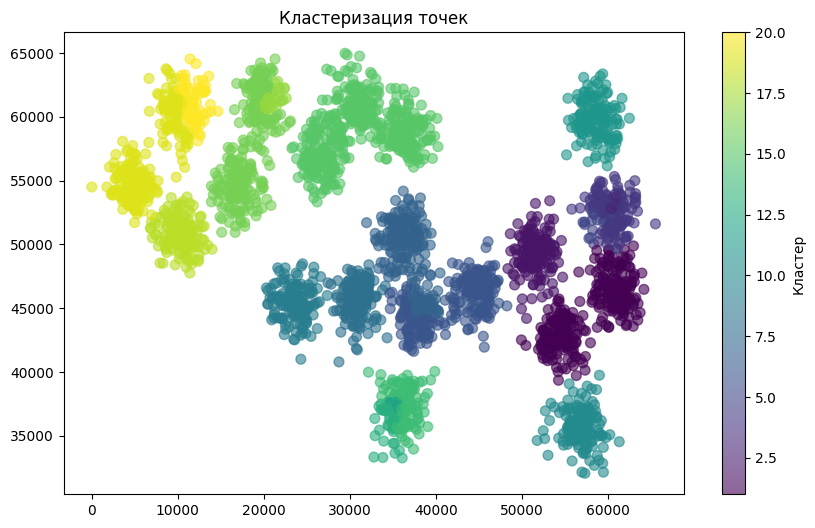

1800
Normalized mutual information: 0.8791127353854368


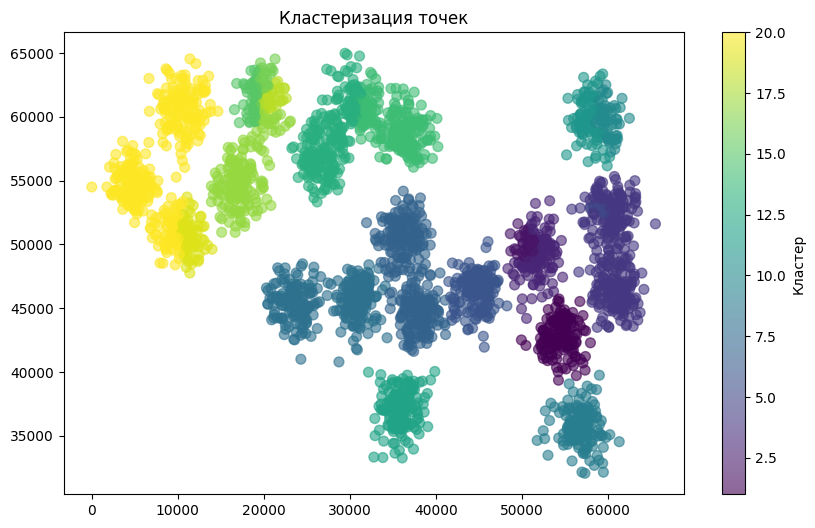

1900
Normalized mutual information: 0.8911026588616509


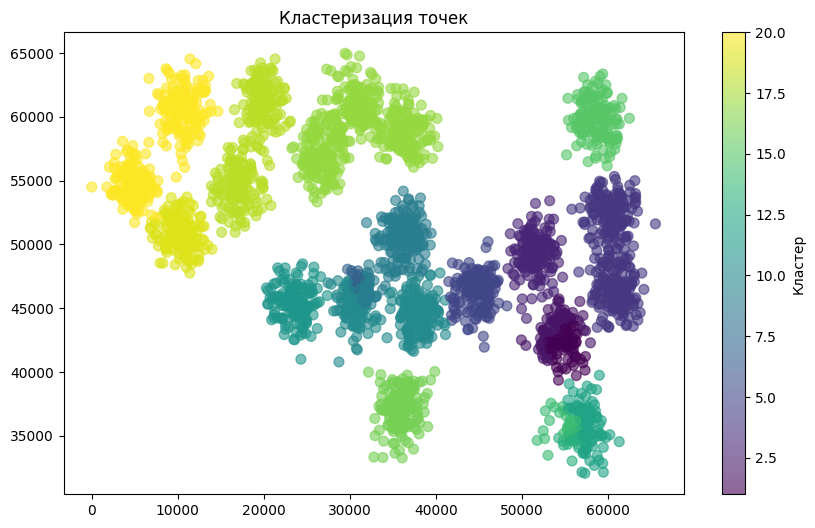

2000
Normalized mutual information: 0.884837670365854


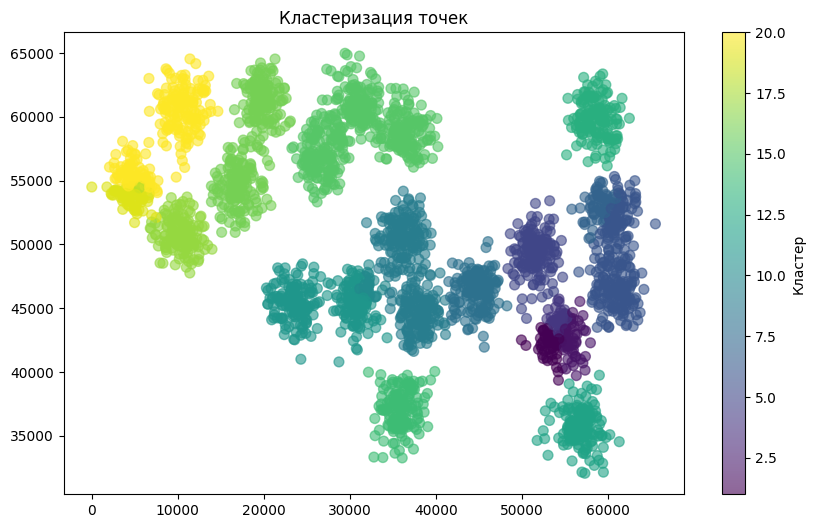

2100
Normalized mutual information: 0.8256062781040124


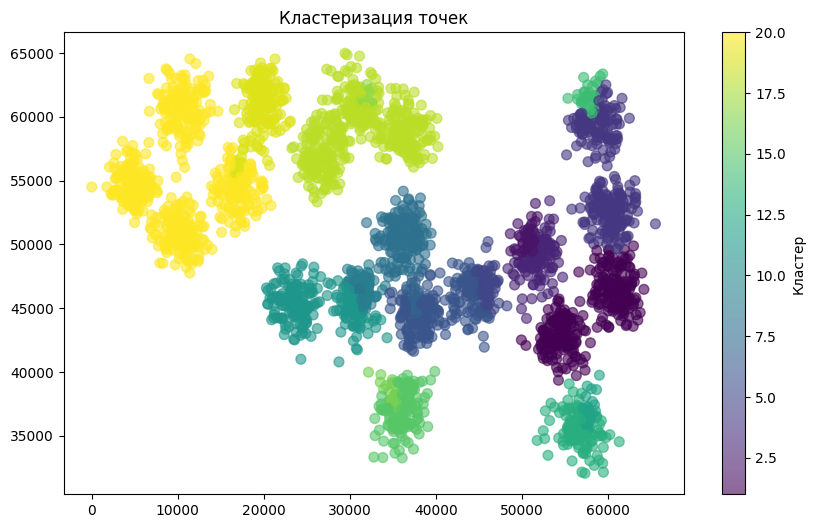

2200
Normalized mutual information: 0.906386921297027


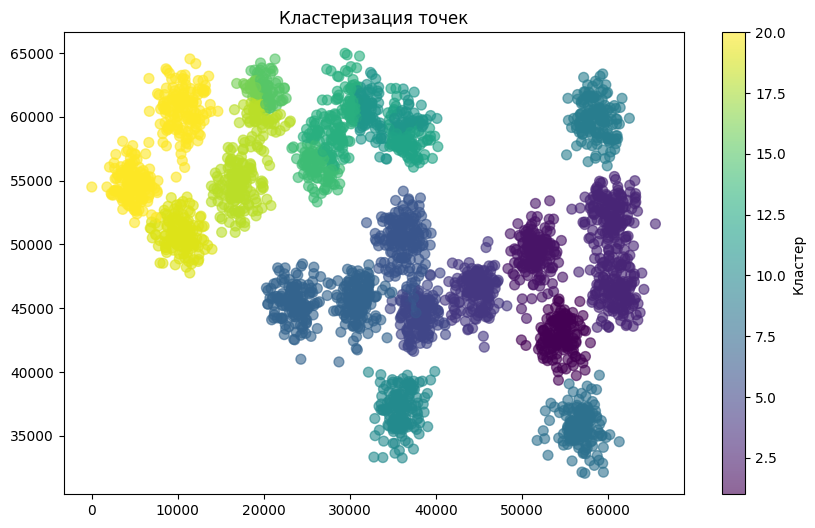

2300
Normalized mutual information: 0.9167219107847467


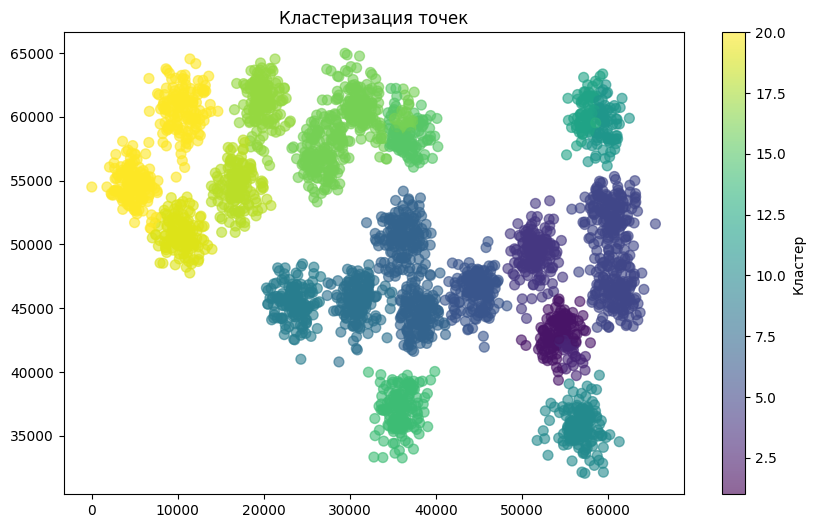

2400
Normalized mutual information: 0.9092702444897052


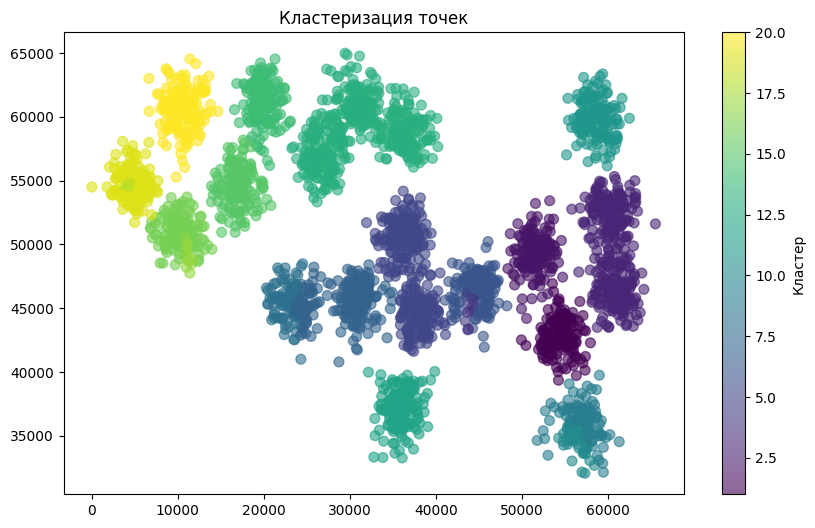

2500
Normalized mutual information: 0.8896036721394991


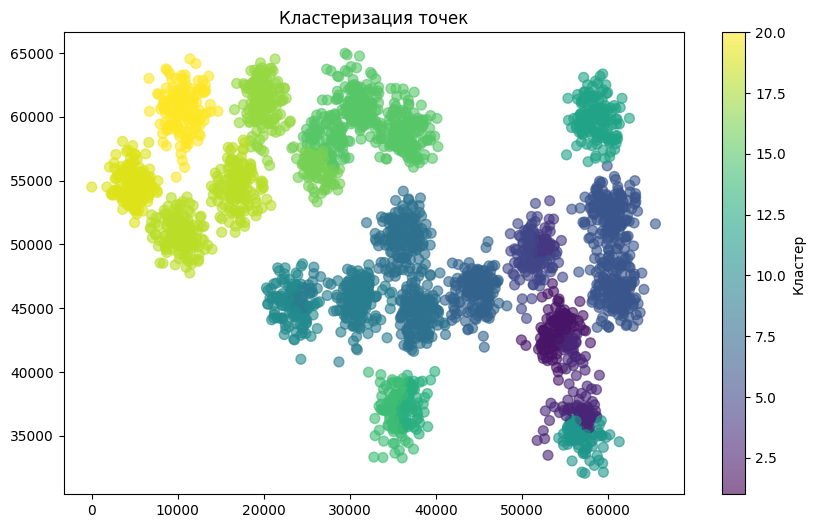

2600
Normalized mutual information: 0.8657657875985558


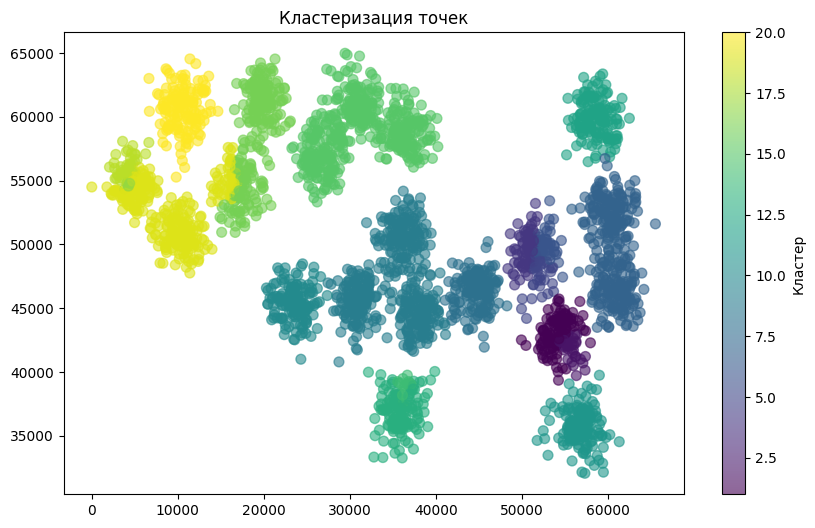

2700
Normalized mutual information: 0.840489679419635


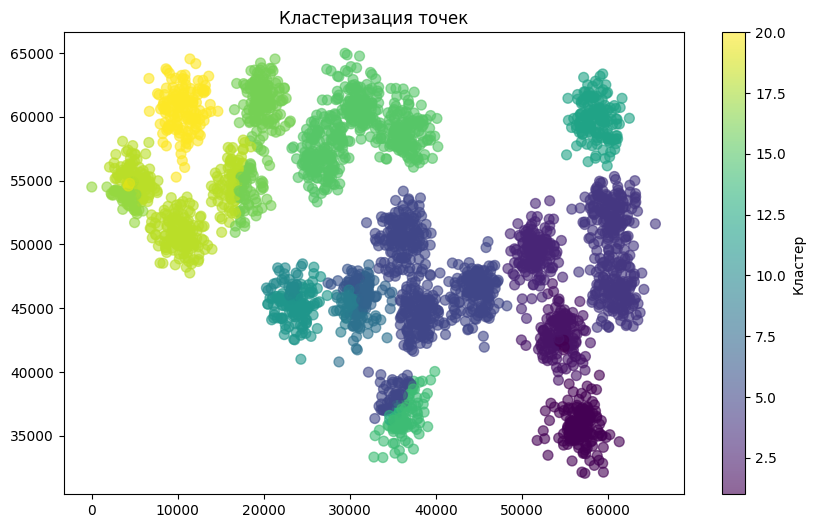

2800
Normalized mutual information: 0.8510734902296722


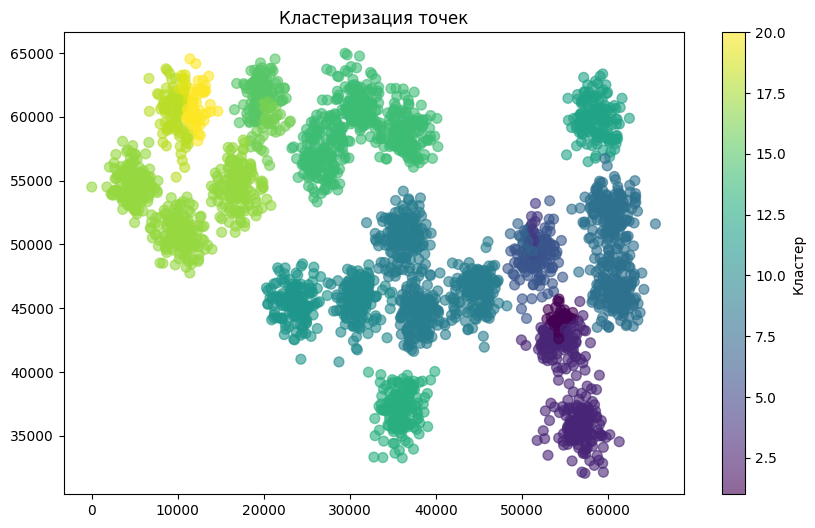

2900
Normalized mutual information: 0.8839668812873844


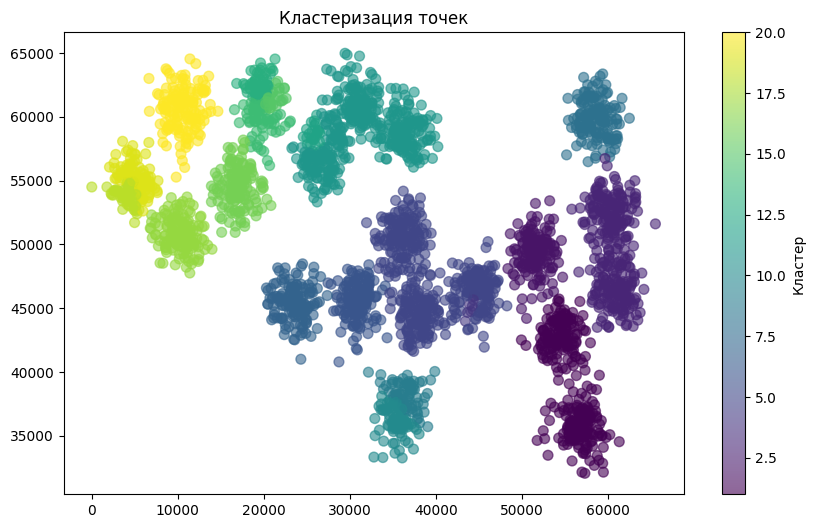

3000
Normalized mutual information: 0.8153054444399676


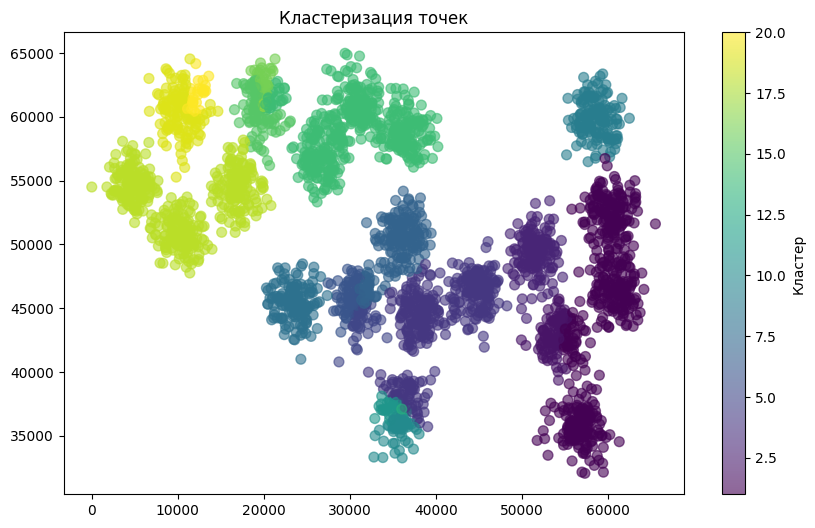

In [180]:
for dc in range(500, 3001, 100):
    print(dc)
    num_clusters = 20
    cluster_labels, cluster_centers = distance_and_density_based_clustering(data, num_clusters, dc=dc)
    cluster_labels = real_clustesrs_num(cluster_labels)
    print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels)}")

    plt.figure(figsize=(10, 6))
    plt.scatter(data[:, 0], data[:, 1], c=cluster_labels, s=50, alpha=0.6) 
    plt.title('Кластеризация точек')
    plt.colorbar(label='Кластер')
    plt.show()

**САмый большой nmi получился при dc=1400 Normalized mutual information: 0.9376**
Посмотрим в оскрестности 1400

1300
Normalized mutual information: 0.9243653580716272


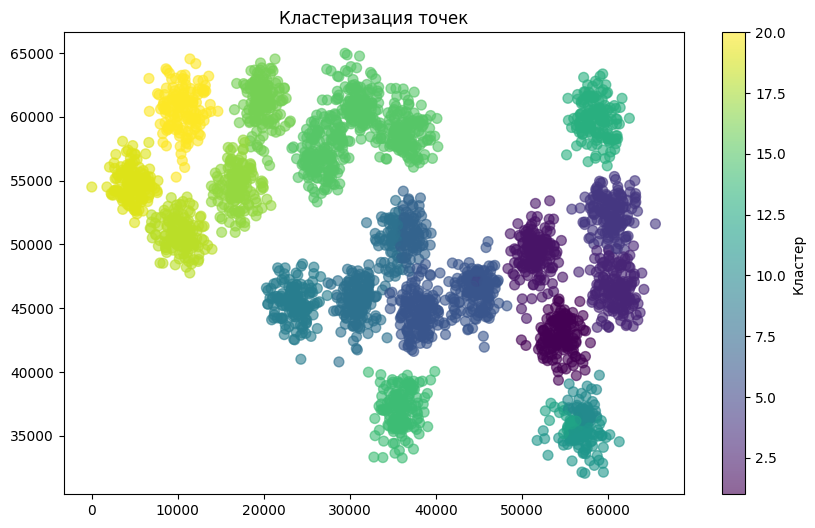

1320
Normalized mutual information: 0.9155054959558364


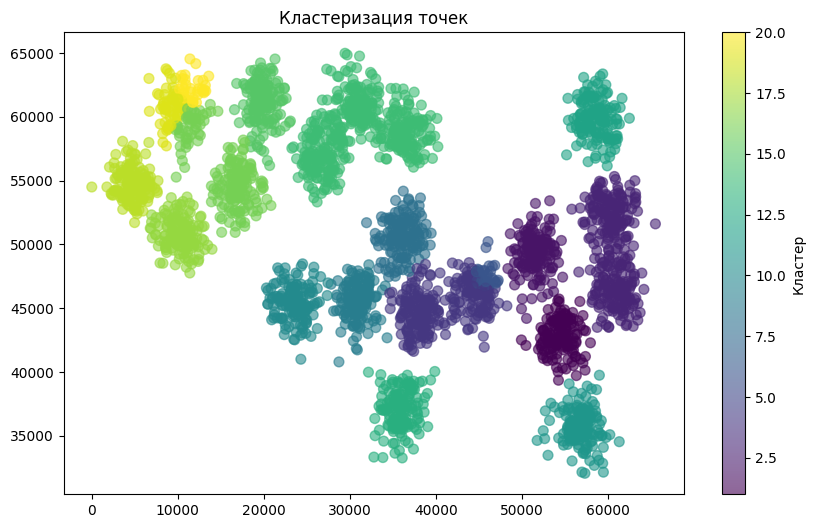

1340
Normalized mutual information: 0.8613835391853681


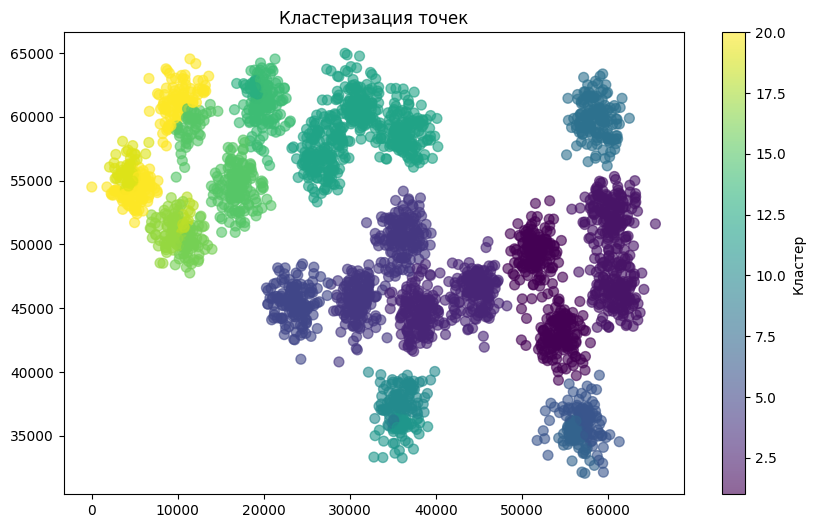

1360
Normalized mutual information: 0.878684337592147


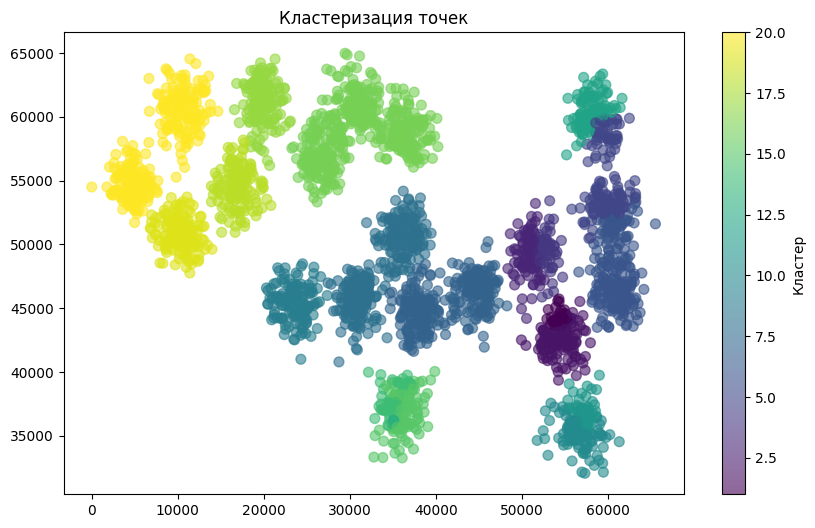

1380
Normalized mutual information: 0.9121875457225455


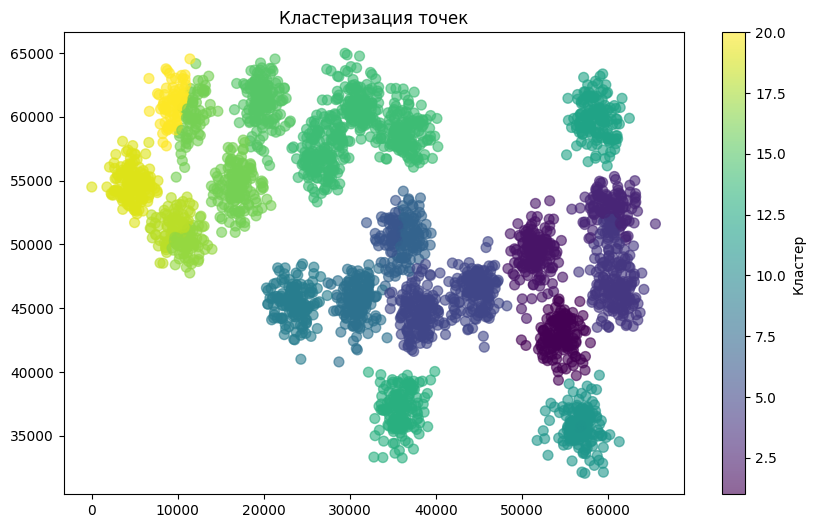

1400
Normalized mutual information: 0.9376521566347258


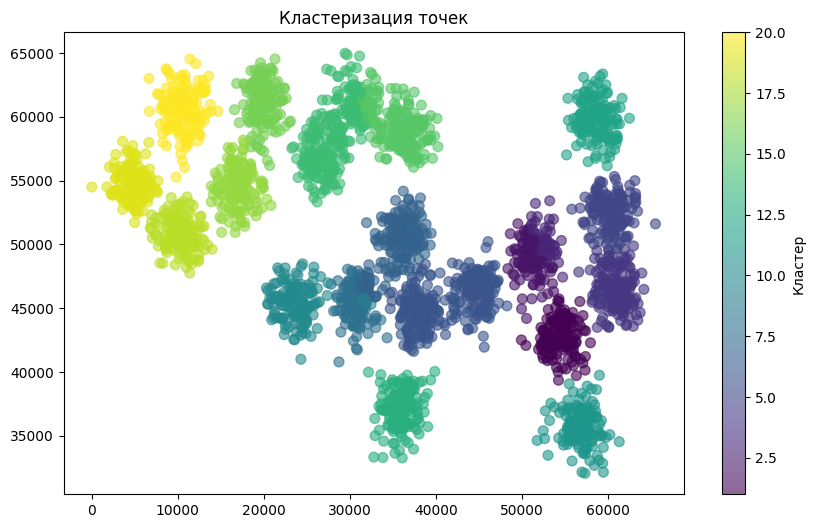

1420
Normalized mutual information: 0.9663837065031978


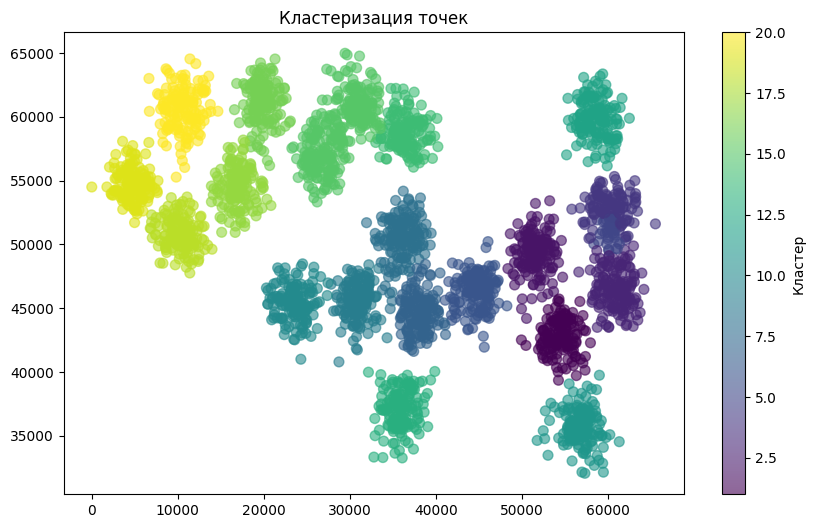

1440
Normalized mutual information: 0.8798588582489386


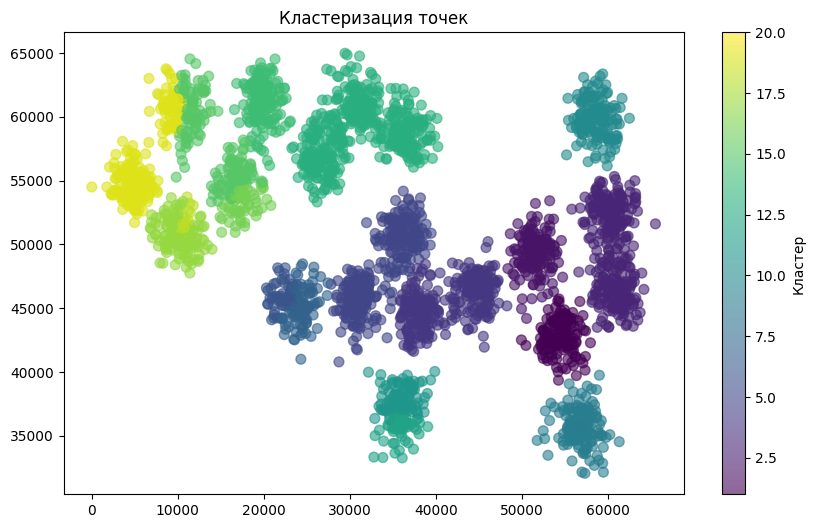

1460
Normalized mutual information: 0.9047454335952514


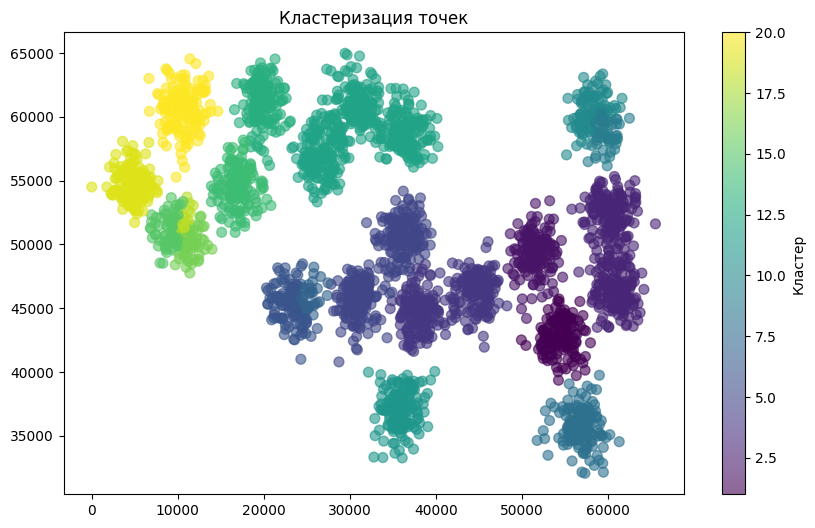

1480
Normalized mutual information: 0.9373164389244175


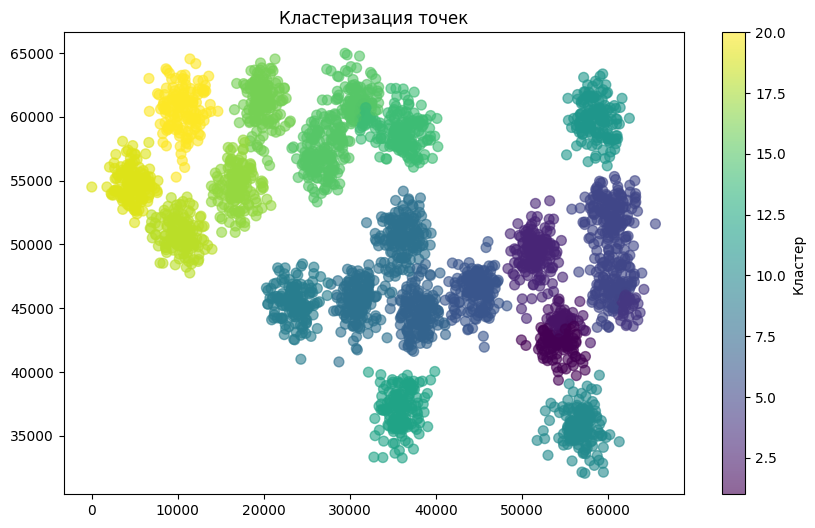

In [181]:
for dc in range(1300, 1500, 20):
    print(dc)
    num_clusters = 20
    cluster_labels, cluster_centers = distance_and_density_based_clustering(data, num_clusters, dc=dc)
    cluster_labels = real_clustesrs_num(cluster_labels)
    print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels)}")

    plt.figure(figsize=(10, 6))
    plt.scatter(data[:, 0], data[:, 1], c=cluster_labels, s=50, alpha=0.6) 
    plt.title('Кластеризация точек')
    plt.colorbar(label='Кластер')
    plt.show()

**Итак, при dc=1420 Normalized mutual information: 0.96638**

Возьмем этот dc

Normalized mutual information: 0.9663837065031978


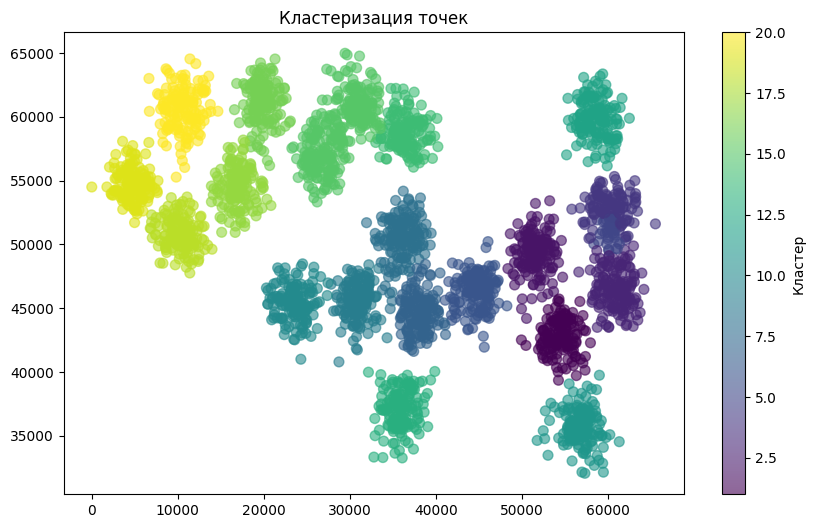

In [182]:
num_clusters = 20
cluster_labels, cluster_centers = distance_and_density_based_clustering(data, num_clusters, dc=1420)
cluster_labels = real_clustesrs_num(cluster_labels)
print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels)}")

plt.figure(figsize=(10, 6))
plt.scatter(data[:, 0], data[:, 1], c=cluster_labels, s=50, alpha=0.6) 
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

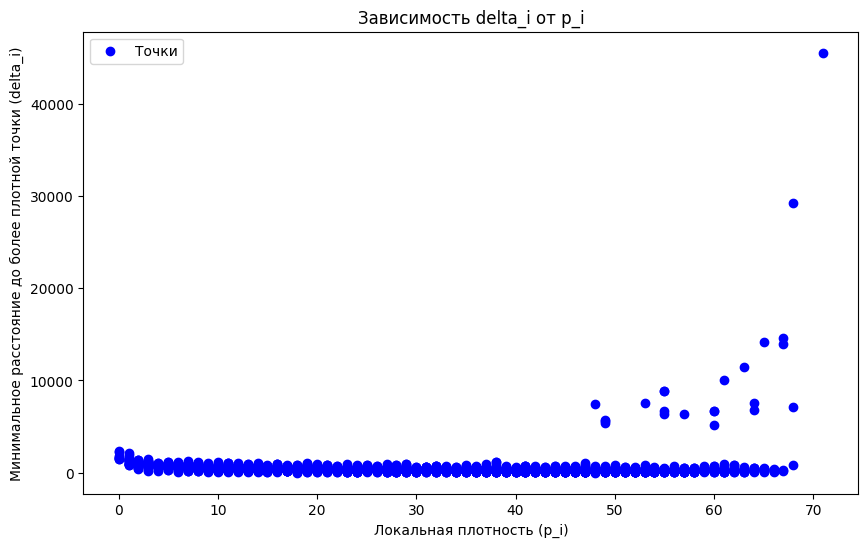

In [261]:
distance_and_density_based_clustering_plt(data, 20, dc=1420)


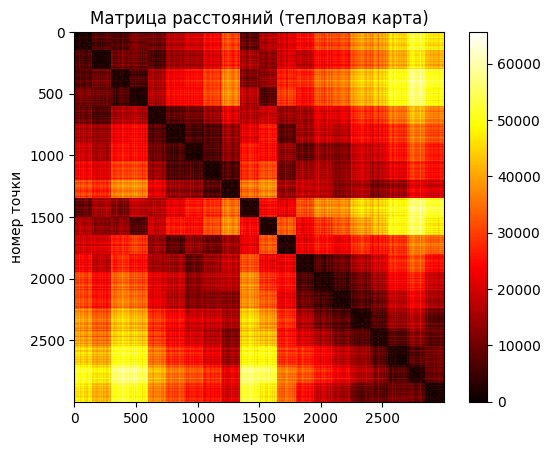

In [246]:
distance_matrix = cdist(data, data)

plt.imshow(distance_matrix, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Матрица расстояний (тепловая карта)')
plt.xlabel('номер точки')
plt.ylabel('номер точки')
plt.show()


### Выводы о данных и методе
На основе двух графиков:
- В верхней части графика есть несколько точек с высокими значениями $ \delta_i $ и эти точки являются кандидатами в центры кластеров
- Большинство точек сосредоточено внизу, что говорит о том, что эти точки принадлежат плотным группам (видно по картинкам выше, что точки отчетливо делятся на несколько плотных групп), то есть в данных есть четко выраженные кластеры, где точки с высокой плотностью расположены близко друг к другу
- В средней части графика видно несколько точек, у которых заметно большее значение $ \delta_i $, чем у большинства, и при этом у них большая плотность, то есть это точки, которые находятся чуть дальше от плотных точек, можно сказать, "выбросы" из кластеров
- Видно, что плотность точек $ p_i $ изменяется в не очень широком диапазоне, то есть разные кластеры имеют разную плотность (есть как более плотные кластеры, так и более разреженные области относительно них), но при этом их плотности не отличаются так сильно, как в 1-м датасете 
- По матрице расстояний тоже выделяется 20 кластеров и при этом есть точки из разных кластеров близкие друг к другу (видно, что некоторые кластеры находятся очень близко друг к другу и сложно определить точную границу между ними)


По результату получившейся кластеризации:
- normalized_mutual_info_score получился близким к единице (около 0.97), что говорит о хорошем качестве кластеризации, и даже визуально видно, что кластеры хорошо разделены и имеют четкие границы
- На картинке с кластерами видно, что некоторые кластеры более плотные, а другие более разреженные ( что соответствует данным из графика зависимости $\delta$ от p, где плотность точек варьировалась)

## Теперь посмотрим на датасеты с большей размерностью


## Датасет dim032
#### N=1024 k=16 D=32

In [262]:
data = np.loadtxt('data/dim032/points.txt')
true_labels = np.loadtxt('data/dim032/true_clusters.txt')

**переберем dc, визуализируем только по первым двум столбцам**

In [196]:
num_clusters = 16
for dc in range(1, 30):
    print(f"dc={dc}")
    cluster_labels_, cluster_centers_ = distance_and_density_based_clustering(data, num_clusters, dc=dc)
    cluster_labels_ = real_clustesrs_num(cluster_labels_)
    print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels_)}")

    # plt.figure(figsize=(10, 6))
    # plt.scatter(data[:, 0], data[:, 1], c=cluster_labels_, s=50, alpha=0.6) 
    # plt.title('Кластеризация точек')
    # plt.colorbar(label='Кластер')
    # plt.show()

dc=1


Normalized mutual information: 0.38952450920097315
dc=2
Normalized mutual information: 0.8153071078763332
dc=3
Normalized mutual information: 0.8253504472964264
dc=4
Normalized mutual information: 0.790986111628342
dc=5
Normalized mutual information: 0.5618996192604178
dc=6
Normalized mutual information: 0.6509595647817483
dc=7
Normalized mutual information: 0.6254616274482773
dc=8
Normalized mutual information: 0.11717848603711985
dc=9
Normalized mutual information: 0.7732873174908994
dc=10
Normalized mutual information: 0.5142975933376015
dc=11
Normalized mutual information: 0.5426555687915449
dc=12
Normalized mutual information: 0.3650390551311463
dc=13
Normalized mutual information: 0.7671953822549098
dc=14
Normalized mutual information: 0.1317646845509464
dc=15
Normalized mutual information: 0.6068989913114514
dc=16
Normalized mutual information: 0.36155553981260335
dc=17
Normalized mutual information: 0.3623903282491622
dc=18
Normalized mutual information: 0.3709237759449254
dc=1

**Посмотрим в области 3, тк там был наибольший normalized_mutual_info_score**

dc=2.5
Normalized mutual information: 0.7966096961794049


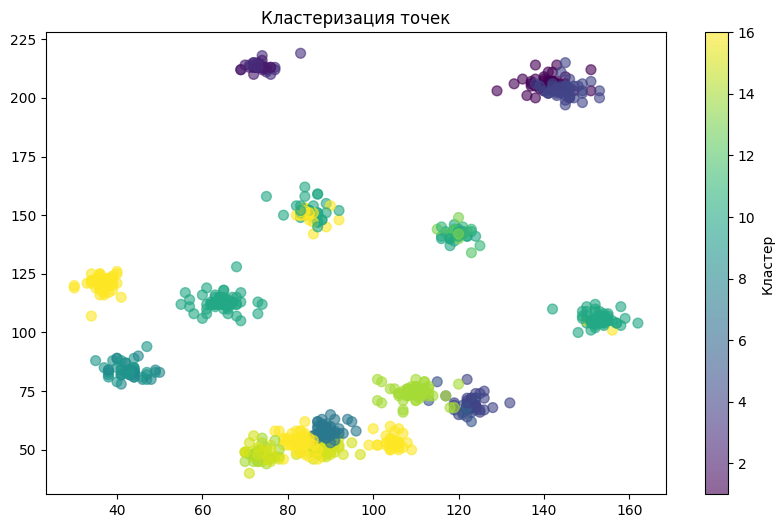

dc=2.6
Normalized mutual information: 0.7966096961794049


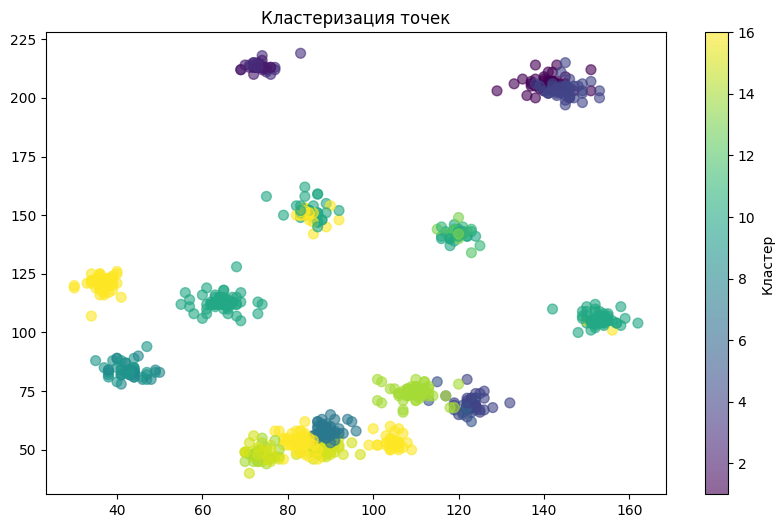

dc=2.7
Normalized mutual information: 0.7679618934690222


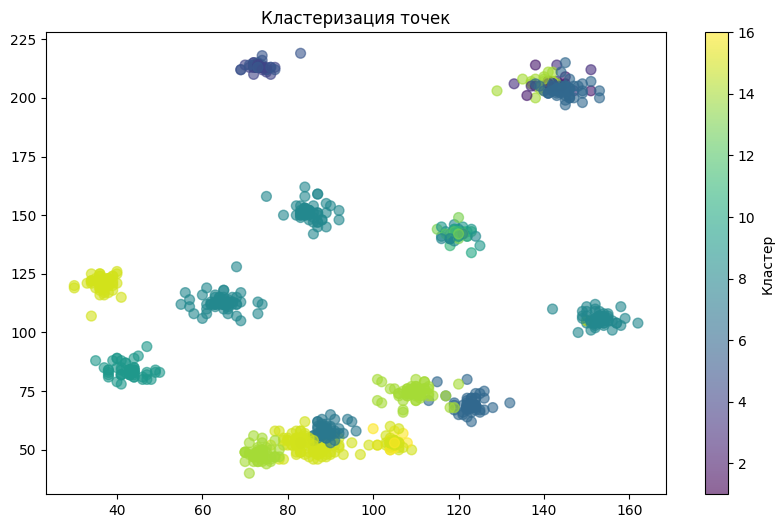

dc=2.8
Normalized mutual information: 0.7679618934690222


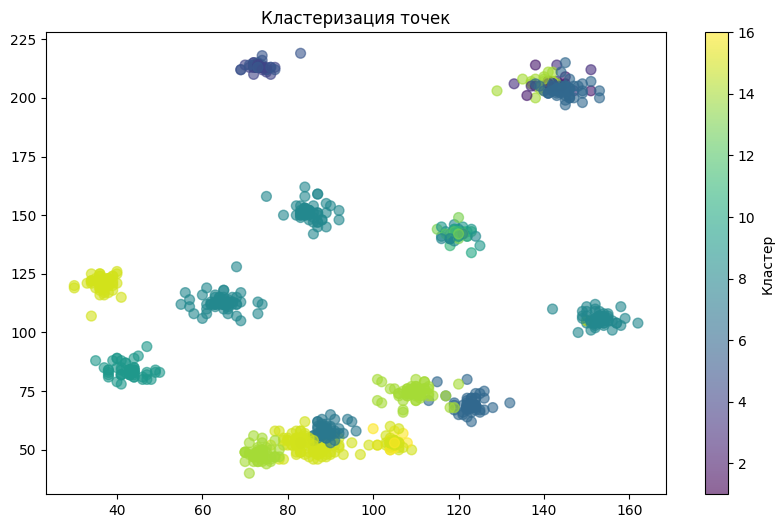

dc=2.9
Normalized mutual information: 0.8253504472964264


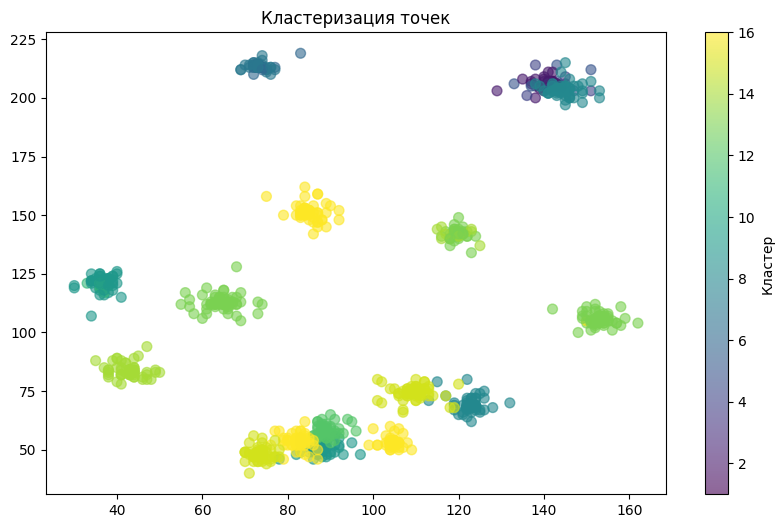

dc=3.0
Normalized mutual information: 0.8253504472964264


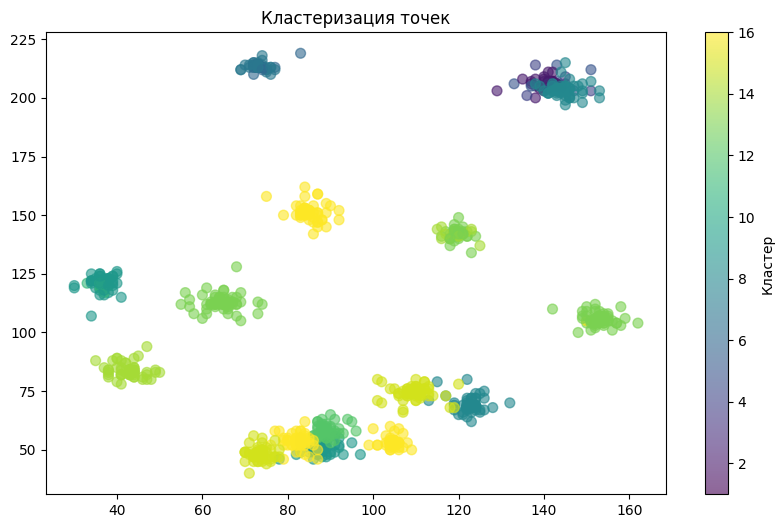

dc=3.1
Normalized mutual information: 0.8255654825949466


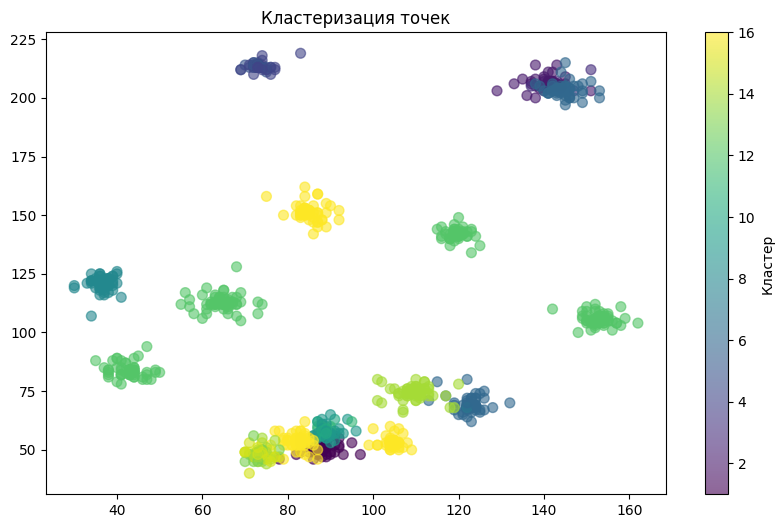

dc=3.2
Normalized mutual information: 0.7462673650787887


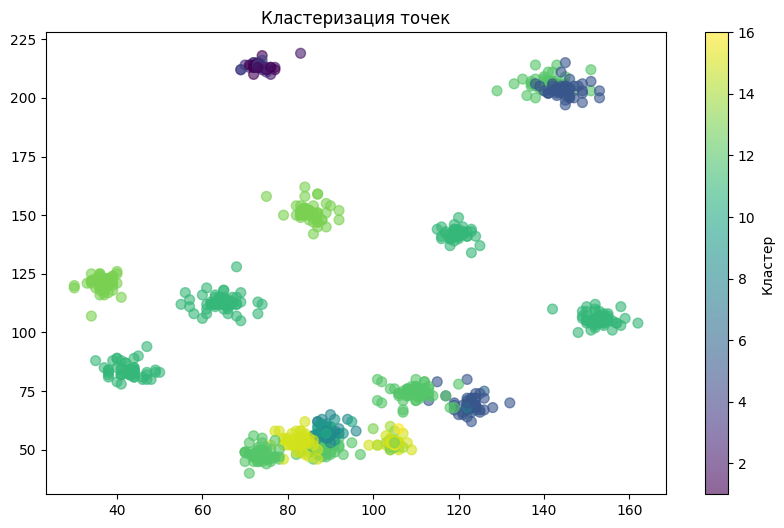

dc=3.3
Normalized mutual information: 0.7462673650787887


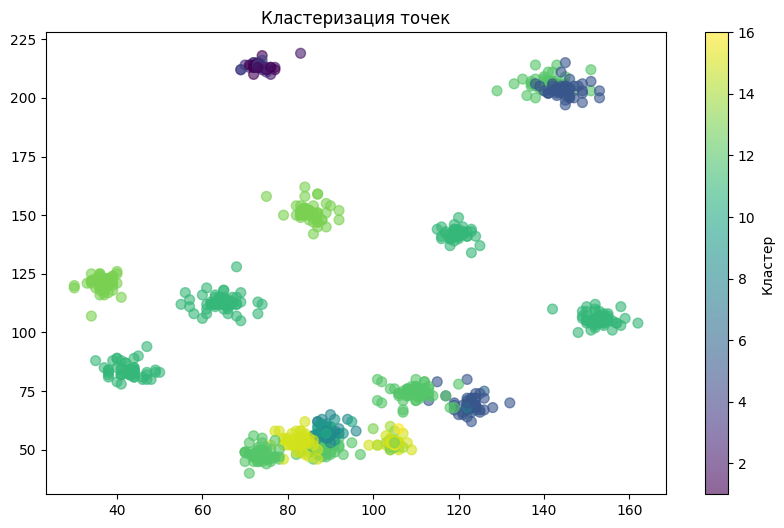

dc=3.4
Normalized mutual information: 0.7773789683574416


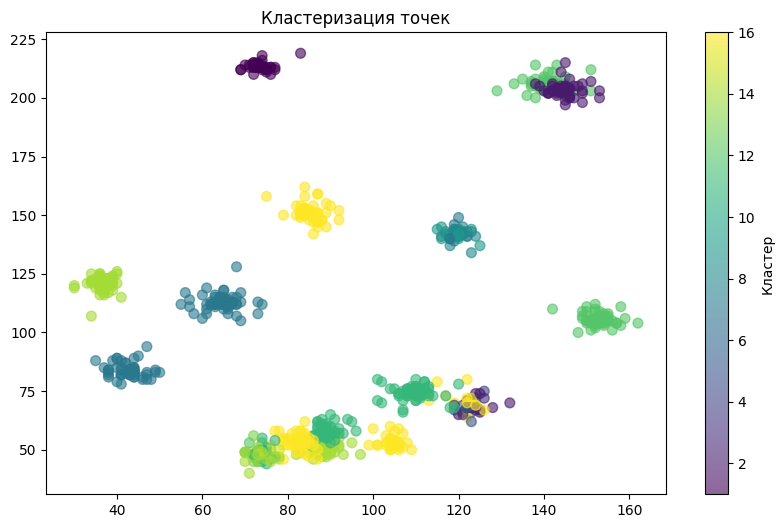

dc=3.5
Normalized mutual information: 0.8372795415874312


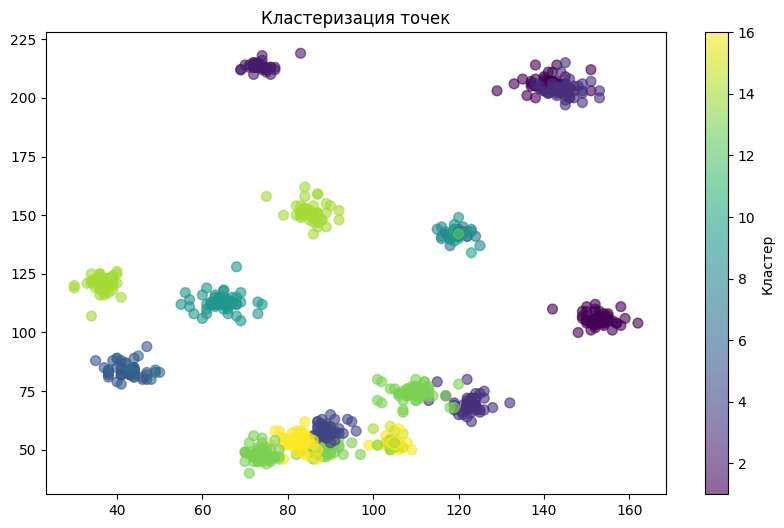

dc=3.6
Normalized mutual information: 0.8372795415874312


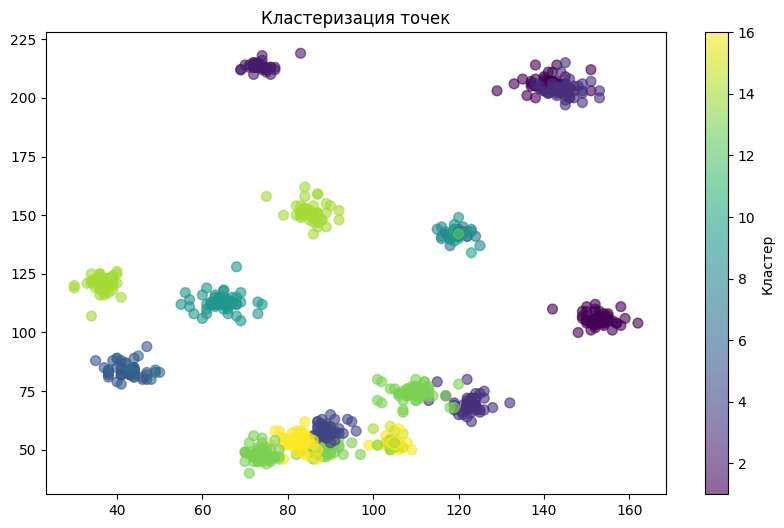

dc=3.7
Normalized mutual information: 0.7456999361998917


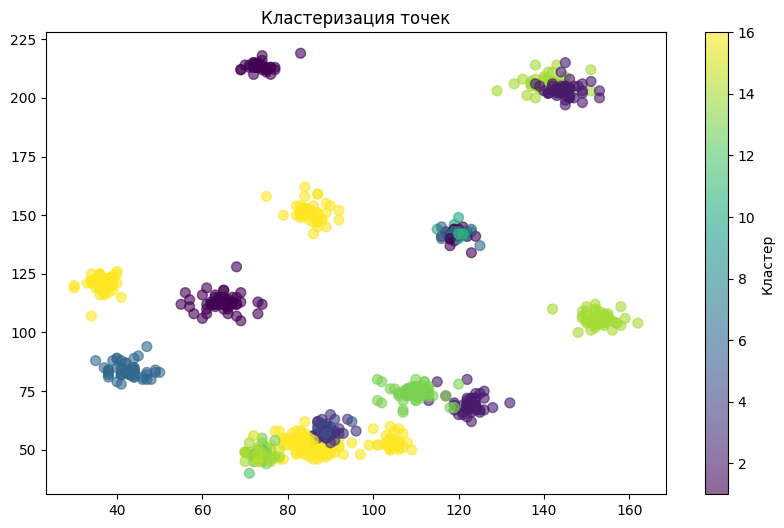

dc=3.8
Normalized mutual information: 0.7531519900679098


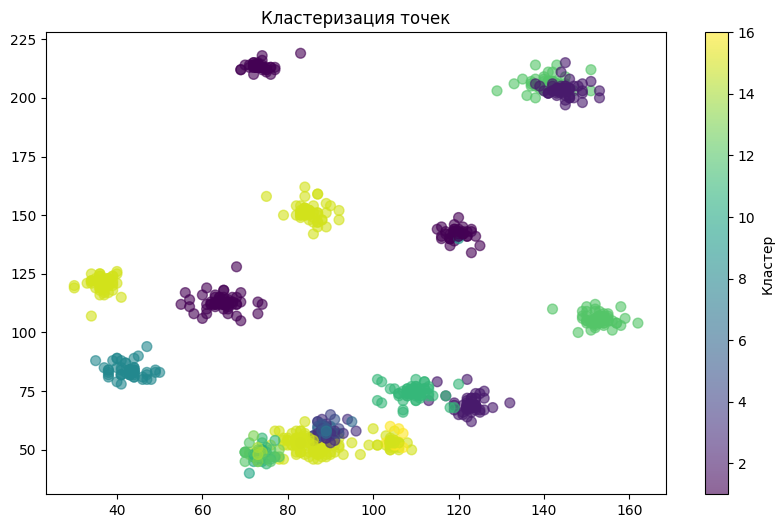

dc=3.9
Normalized mutual information: 0.790986111628342


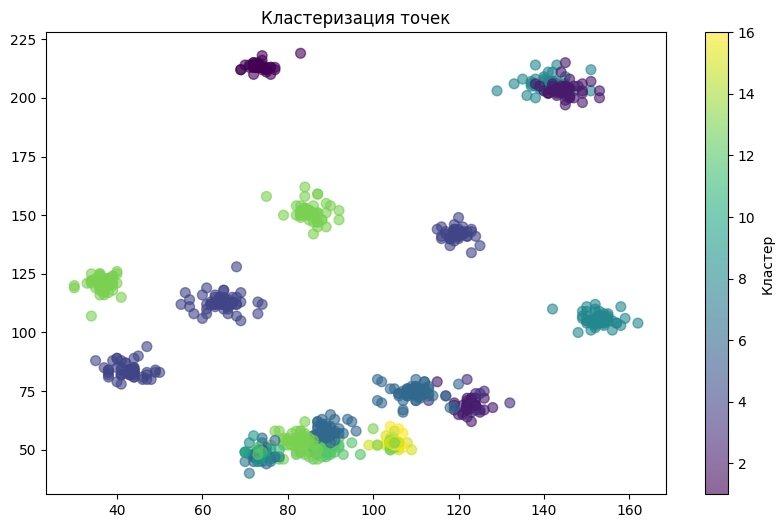

In [194]:
num_clusters = 16
nmis = {}
for dc in range(25, 40):
    dc = dc/10
    print(f"dc={dc}")
    cluster_labels_, cluster_centers_ = distance_and_density_based_clustering(data, num_clusters, dc=dc)
    cluster_labels_ = real_clustesrs_num(cluster_labels_)
    nmis[dc] = normalized_mutual_info_score(true_labels, cluster_labels_)
    print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels_)}")

    plt.figure(figsize=(10, 6))
    plt.scatter(data[:, 0], data[:, 1], c=cluster_labels_, s=50, alpha=0.6) 
    plt.title('Кластеризация точек')
    plt.colorbar(label='Кластер')
    plt.show()

**Найдем значение с наибольшим normalized_mutual_info_score**

In [195]:
print(max(nmis, key=nmis.get))

3.5


Normalized mutual information: 0.8372795415874312


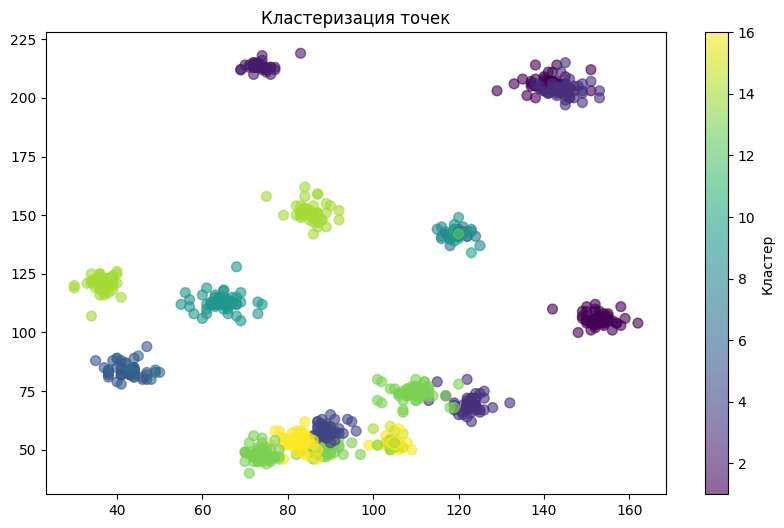

In [197]:
num_clusters = 16
cluster_labels_, cluster_centers_ = distance_and_density_based_clustering(data, num_clusters, dc=3.5)
cluster_labels_ = real_clustesrs_num(cluster_labels_)
nmis[dc] = normalized_mutual_info_score(true_labels, cluster_labels_)
print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels_)}")

plt.figure(figsize=(10, 6))
plt.scatter(data[:, 0], data[:, 1], c=cluster_labels_, s=50, alpha=0.6) 
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

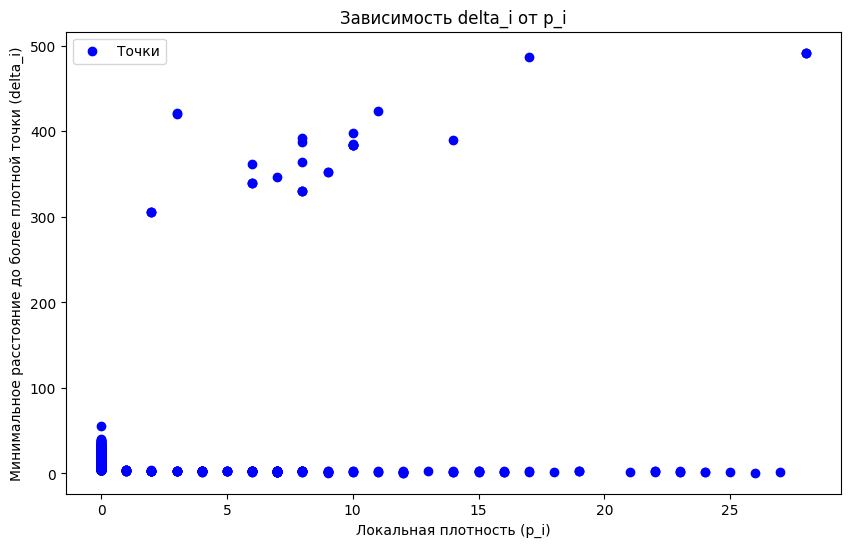

In [263]:
distance_and_density_based_clustering_plt(data, 16, dc=3.5)


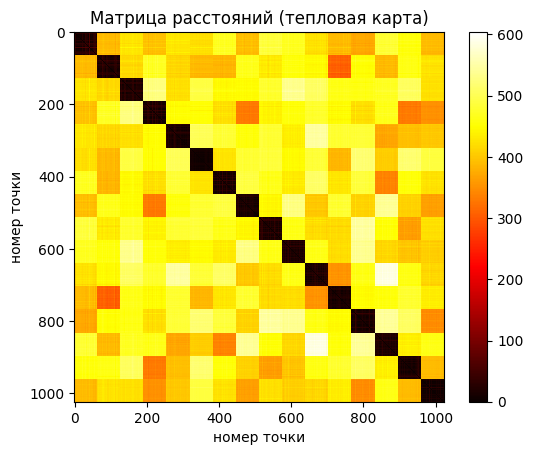

In [252]:
distance_matrix = cdist(data, data)

plt.imshow(distance_matrix, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Матрица расстояний (тепловая карта)')
plt.xlabel('номер точки')
plt.ylabel('номер точки')
plt.show()

### Выводы о данных и методе
На основе двух графиков:
- Аналогично точки с высокой локальной плотностью $ p_i $ и большим расстоянием $ \delta_i $ являются потенциальными центрами кластеров
- Большинство точек имеют низкое значение $ \delta_i $ (они имеют соседей с более высокой плотностью рядом с собой) 
- Точки с очень большими значениями $ \delta_i $, но относительно низким $ p_i $ могут быть выбросами или редкими объектами (тоже так называемые "выбросы" из кластеров)
- По матрице расстояний видно, что в основном точки расположены далеко друг от друга, если не считать кластер, к которому они принадлежат (опять выдеряется отчетливо 16 кластеров)

По результату получившейся кластеризации:
- normalized_mutual_info_score высокий (около 0.84 ), но пониже, чем в предыдущих датасетах (могла повлиять бОльшая размерность)

## Датасет G2
#### N=2048, k=2, D=4
визуализируем снова по первым двум столбцам

In [335]:
data = np.loadtxt('data/g2/points.txt')
true_labels = np.loadtxt('data/g2/true_clusters.txt')

In [342]:
num_clusters = 2
nmis = {}
for dc in range(1, 1000, 2):
    cluster_labels_, cluster_centers_ = distance_and_density_based_clustering(data, num_clusters, dc=dc)
    cluster_labels_ = real_clustesrs_num(cluster_labels_)
    nmis[dc] = normalized_mutual_info_score(true_labels, cluster_labels_)
    

In [343]:
print(max(nmis, key=nmis.get))

9


In [344]:
nmis[9]

1.0

Normalized mutual information: 1.0


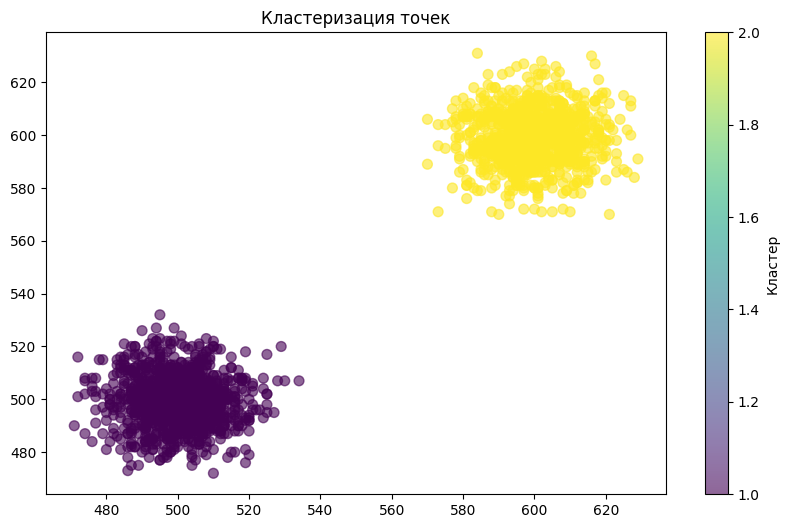

In [345]:
num_clusters = 2
cluster_labels_, cluster_centers_ = distance_and_density_based_clustering(data, num_clusters, dc=9)
cluster_labels_ = real_clustesrs_num(cluster_labels_)
# nmis[dc] = normalized_mutual_info_score(true_labels, cluster_labels_)
print(f"Normalized mutual information: {normalized_mutual_info_score(true_labels, cluster_labels_)}")

plt.figure(figsize=(10, 6))
plt.scatter(data[:, 0], data[:, 1], c=cluster_labels_, s=50, alpha=0.6) 
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

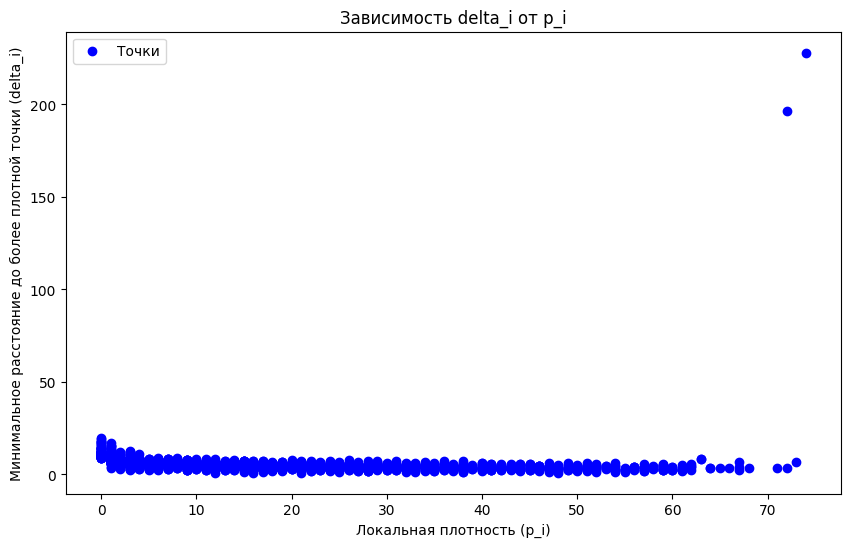

In [346]:
distance_and_density_based_clustering_plt(data, 2, dc=9)


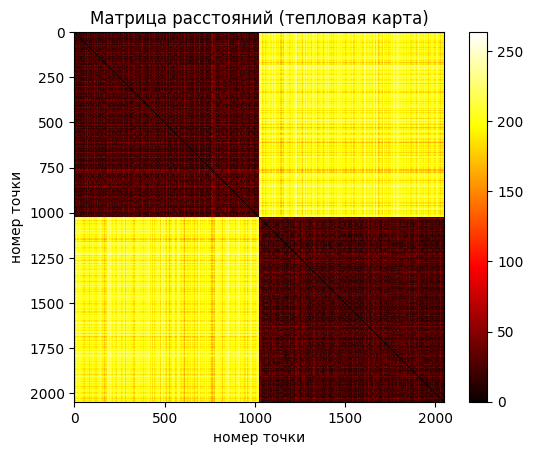

In [347]:
distance_matrix = cdist(data, data)

plt.imshow(distance_matrix, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Матрица расстояний (тепловая карта)')
plt.xlabel('номер точки')
plt.ylabel('номер точки')
plt.show()


### Выводы о данных и методе
На основе двух графиков:
- Отчетливо выделяются две точки с наибольшими $ p_i $ и  $ \delta_i $ и они являются центрами кластеров
- Остальные точки имеют низкое значение $ \delta_i $, то есть находятся в плотном кластере 
- По матрице расстояний видно, что точки из одного кластера расположены близко друг к другу и далеко от точек другого кластера

По результату получившейся кластеризации:
- normalized_mutual_info_score получился идеальным =1, то есть разбиение совершенно верное 

## Дополнительно


Исследуйте помогают ли методы определния количества кластеров из лекции для этих датасетов. 1 балл

Попробуйте найти методы получше для датасетов исходя из формы и описания датасетов. 1 балл + 1 балл за использование нестандартных методов (можно уточнить у преподавателя будет ли тот или иной фреймворк или метод засчитываться за "нестандартный")

### Попробуем для каждого набора данных методы определения кол-ва кластеров с лекции

In [371]:
# метод локтя 
def elbow_method(X, start_k = 1, end_k=10):
    inertia = []
    for k in range(start_k, end_k):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
    
    plt.plot(range(start_k, end_k), inertia, marker='o')
    plt.title('Метод локтя')
    plt.xlabel('Количество кластеров')
    plt.ylabel('Сумма квадратов отклонений (inertia)')
    plt.show()

In [370]:
# метод силуэта 
def silhouette_method(X, start_k = 2, end_k=10):
    silhouette_scores = []
    for k in range(start_k, end_k):  
        kmeans = KMeans(n_clusters=k, random_state=42)
        cluster_labels = kmeans.fit_predict(X)
        score = silhouette_score(X, cluster_labels)
        silhouette_scores.append(score)
    
    plt.plot(range(start_k, end_k), silhouette_scores, marker='o')
    plt.title('Метод силуэта')
    plt.xlabel('Количество кластеров')
    plt.ylabel('Силуэтный коэффициент')
    plt.show()

In [372]:
def gap_statistic(X, start_k = 1, end_k=10, n=10):
    gaps = []

    for k in range(start_k, end_k):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        inertia = kmeans.inertia_

        wk = []
        for _ in range(n):
            random_data = np.random.uniform(
                low=np.min(X, axis=0),
                high=np.max(X, axis=0),
                size=X.shape
            )
            kmeans.fit(random_data)
            wk.append(kmeans.inertia_)

        gap = np.log(np.mean(wk)) - np.log(inertia)
        gaps.append(gap)
    
    plt.plot(range(start_k, end_k), gaps, '-o')
    plt.xlabel('Количество кластеров')
    plt.ylabel('Gap')
    plt.title('GAP')
    plt.show()

In [374]:
def bic_method(X,start_k=1, end_k=10):
    bic_values = []
    # icl_bic_values = []

    for n in range(start_k, end_k):
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(X)
        bic_values.append(gmm.bic(X))
    
   
    plt.plot(range(start_k,end_k), bic_values, label='BIC')
    # plt.plot(n_range, icl_bic_values, label='ICL-BIC')
    plt.xlabel('Количество кластеров')
    plt.ylabel('Значение критерия')
    plt.title('BIC')
    plt.legend()
    plt.show()

In [350]:
data_g2 = np.loadtxt('data/g2/points.txt')
data_a1 = np.loadtxt('data/a1/points.txt')
data_dim032 = np.loadtxt('data/dim032/points.txt')
data_unbalanced = np.loadtxt('data/unbalanced/points.txt')

### Датасет g2
кол-во кластеров = 2

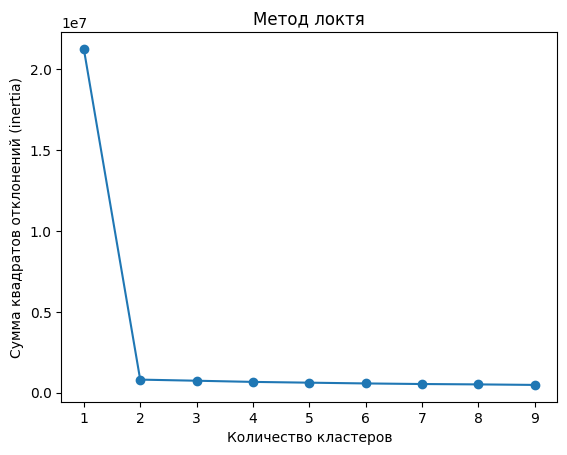

In [376]:
elbow_method(data_g2,1, 10)

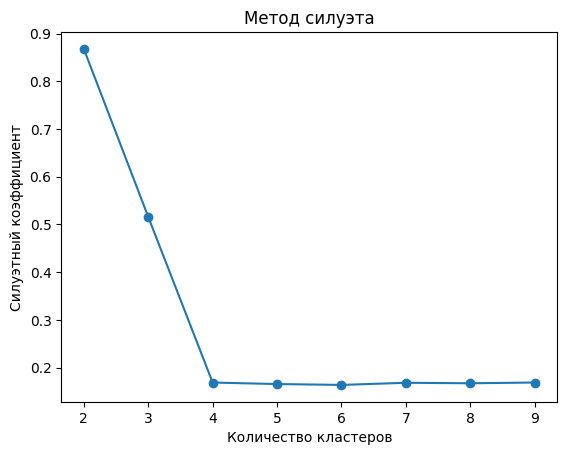

In [377]:
silhouette_method(data_g2, 2, 10)

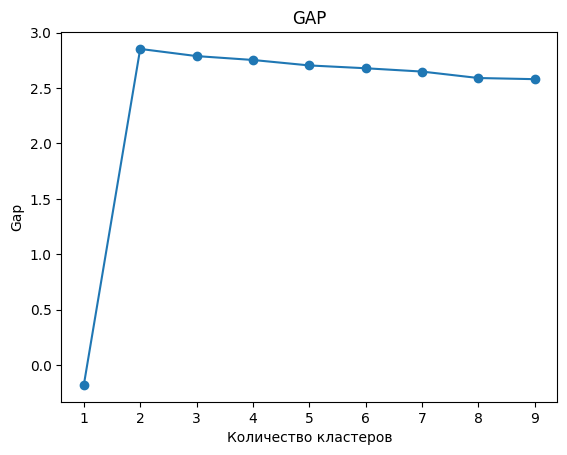

In [ ]:
gap_statistic(data_g2, 1, 10)

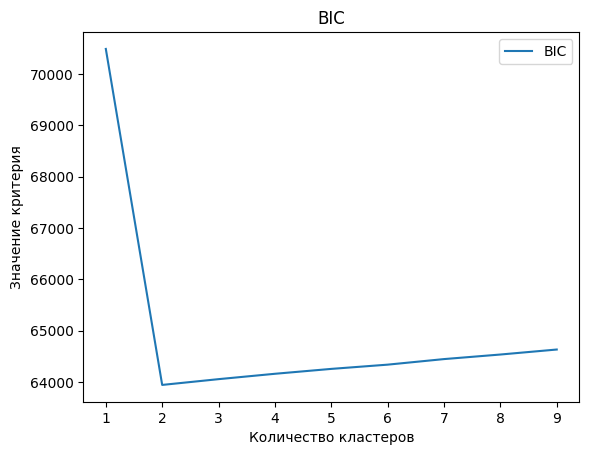

In [379]:
bic_method(data_g2, 1, 10)

Для датасета g2 подходят (видно по картинкам, что получилось определить кол-во кластеров)
- метод локтя ("локоть" в двойке)
- метод силуэта (наибольшее значение в двойке)
- gap (наибольший разрыв в двойке)
- bic (минимум на двойке)

То есть все методы подходят, это может быть обусловлено простотой данных, ведь выше мы смогли получить идеальное разбиение



## Датасет dim032
кластеров = 16

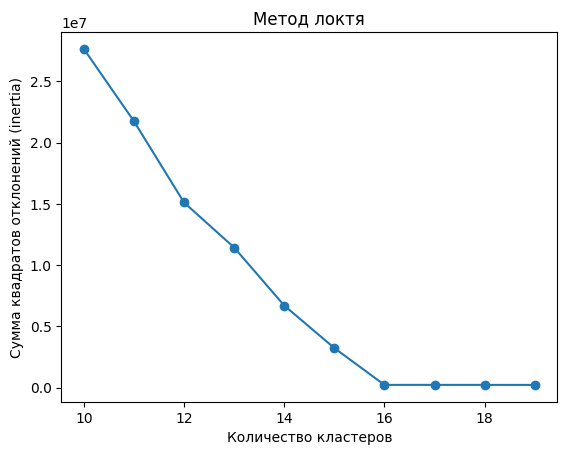

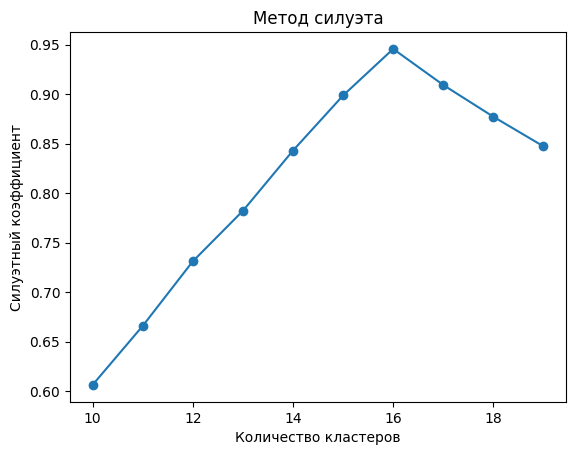

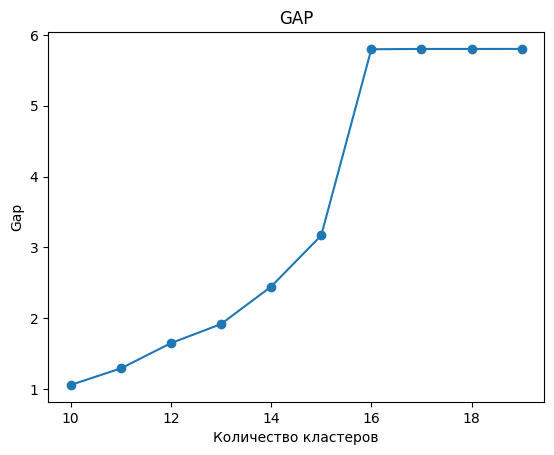

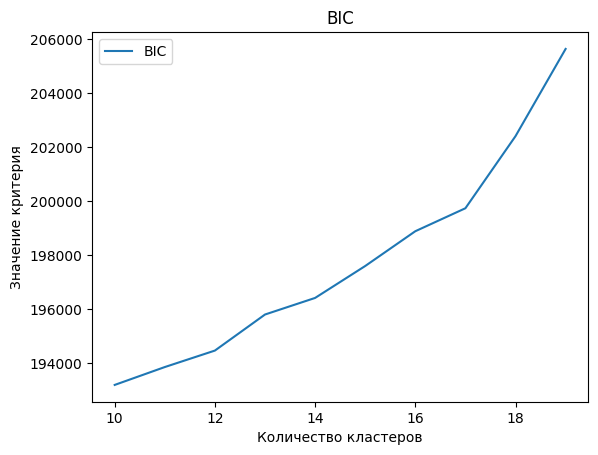

In [380]:
elbow_method(data_dim032, 10, 20)
silhouette_method(data_dim032, 10, 20)
gap_statistic(data_dim032, 10, 20)
bic_method(data_dim032, 10, 20)


Для датасета dim032 подходят (видно по картинкам, что получилось определить кол-во кластеров)
- метод локтя ("локоть" в 16)
- метод силуэта (наибольшее значение в 16)
- gap (наибольший разрыв в 16)

не подходит 
- BIC (минимум в 10)

Размерность у данных сильно выше и BIC предполагает, что данные соответствуют определённому распределению, поэтому если у данных более сложная структура BIC может дать некорректные результаты



### Датасет a1
кластеров = 20

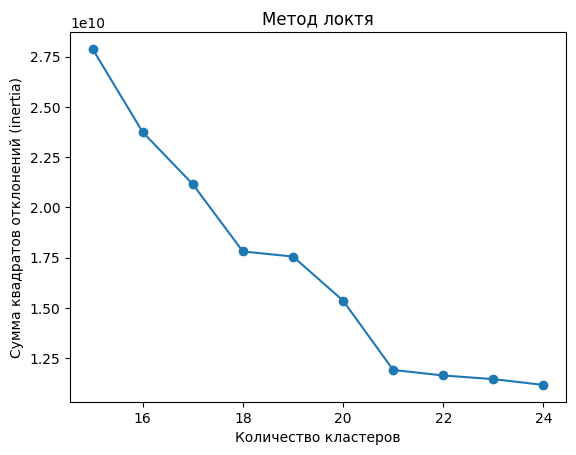

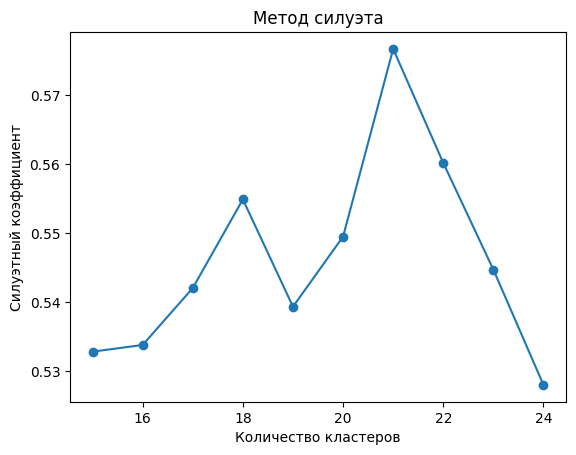

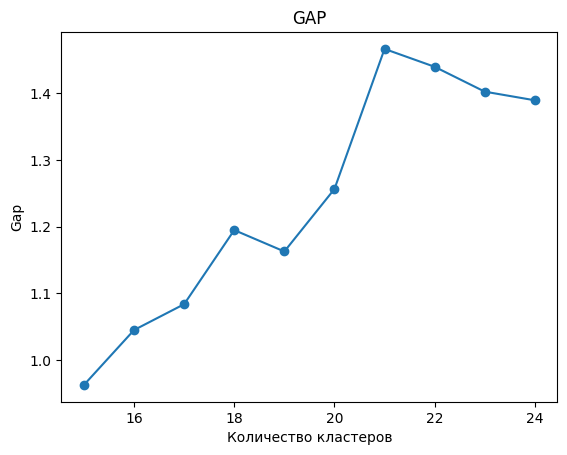

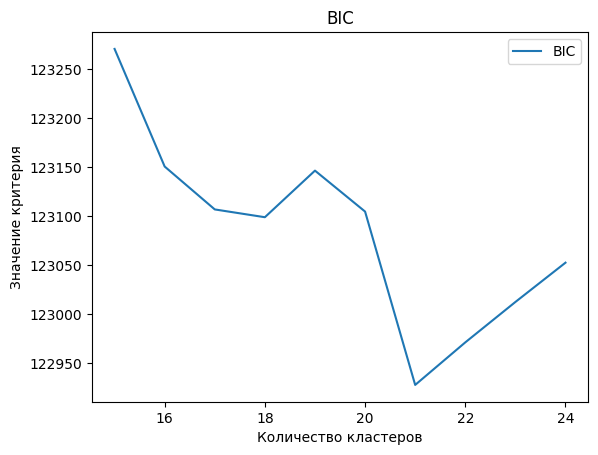

In [382]:
elbow_method(data_a1, 15, 25)
silhouette_method(data_a1,  15, 25)
gap_statistic(data_a1, 15, 25)
bic_method(data_a1,  15, 25)


Для датасета a1 все методы показывают, что оптимален  21 кластер
- метод локтя ("локоть" в 21)
- метод силуэта (наибольшее значение в 21)
- gap (наибольший разрыв в 21)
- BIC (минимум в 21)

Возможные причины:
- В данных есть небольшие выбросы из кластеров, которые методы интерпретируют как отдельный кластер
- У некоторых кластеров есть высокое перекрытие с другими кластерами, поэтому методы могли определить два один кластер как два, но с высоким перекрытием

**Например, как это делает kmeans, если указать 21 кластер (нижний кластер выделяется как 2), а тк k-means работает лучше всего когда кластеры пересекаются (из лекции), то получаем один цельный кластер разделенный на два пересекающихся**

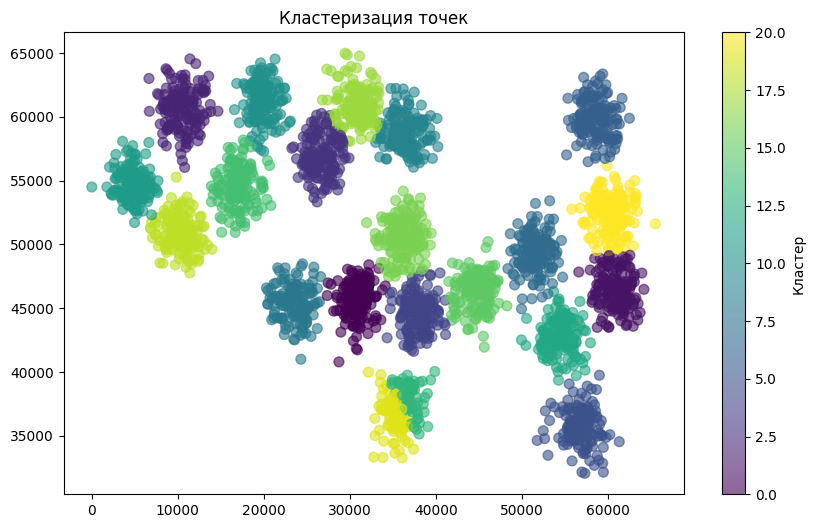

In [398]:
kmeans = KMeans(n_clusters=21, random_state=42)
ccc = kmeans.fit_predict(data_a1)
plt.figure(figsize=(10, 6))
plt.scatter(data_a1[:, 0], data_a1[:, 1], c=ccc, s=50, alpha=0.6) 
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

### Датасет unbalance
кластеров = 8

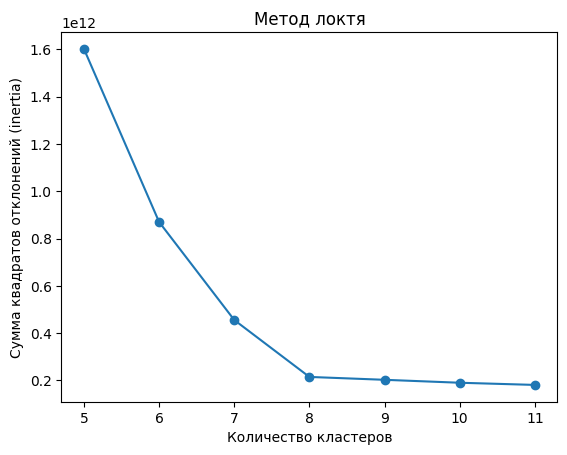

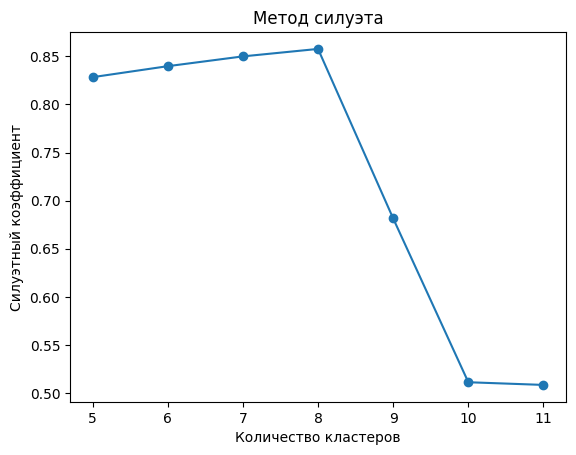

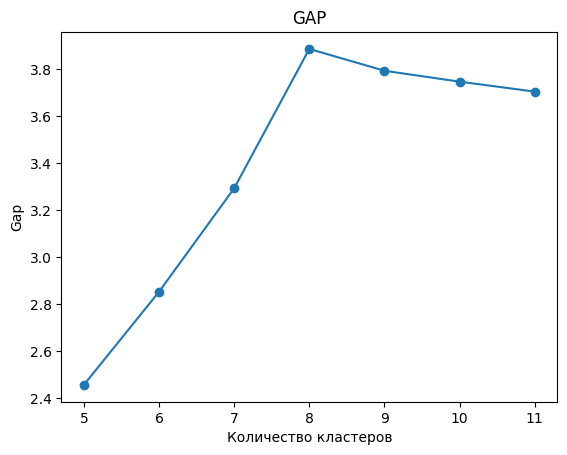

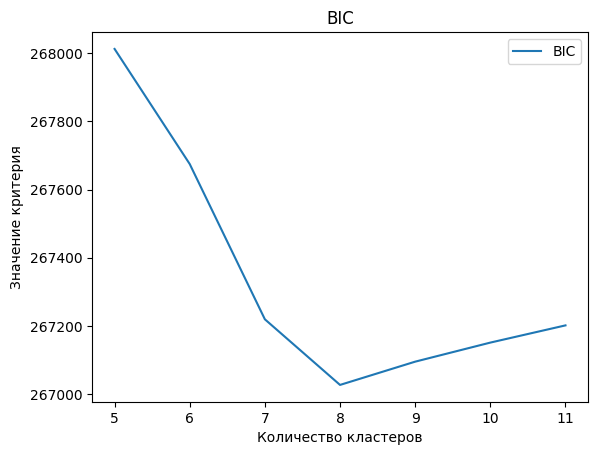

In [400]:
elbow_method(data_unbalanced, 5, 12)
silhouette_method(data_unbalanced,  5, 12)
gap_statistic(data_unbalanced, 5, 12)
bic_method(data_unbalanced, 5, 12)


Для датасета unbalance подходят (видно по картинкам, что получилось определить кол-во кластеров)
- метод локтя ("локоть" в 8)
- метод силуэта (наибольшее значение в 8)
- gap (наибольший разрыв в 8)
- bic (минимум на 8)

То есть все методы подходят, это может быть обусловлено тем, что клатсеры хорошо разделимы 


### Попробуйте найти методы получше для датасетов исходя из формы и описания датасетов. 1 балл + 1 балл за использование нестандартных методов (можно уточнить у преподавателя будет ли тот или иной фреймворк или метод засчитываться за "нестандартный")

Посмотрим на датасет a1, на котором все методы показали 21, как оптимальное число кластеров

Используем index dunn: оптимальное количество кластеров соответствует максимальному значению индекса

Хорошо работает для плотных кластеров, когда они близки, но можно найти разделение по плотности, это как раз наш случай, тк по картинкам выше видно было, что в этом датасете кластеры расположены близко друг к другу

k=10, dunn_index=0.3024435303850312
k=11, dunn_index=0.2970330060654833
k=12, dunn_index=0.27853311207728815
k=13, dunn_index=0.26869255592000446
k=14, dunn_index=0.22301819837493628
k=15, dunn_index=0.26440750988107004
k=16, dunn_index=0.26440750988107004
k=17, dunn_index=0.25556841943983855
k=18, dunn_index=0.25556841943983855
k=19, dunn_index=0.24411676495957796
k=20, dunn_index=0.315864541810664
k=21, dunn_index=0.1301079701699782
k=22, dunn_index=0.12771547157942884
k=23, dunn_index=0.12771547157942884
k=24, dunn_index=0.12771547157942884


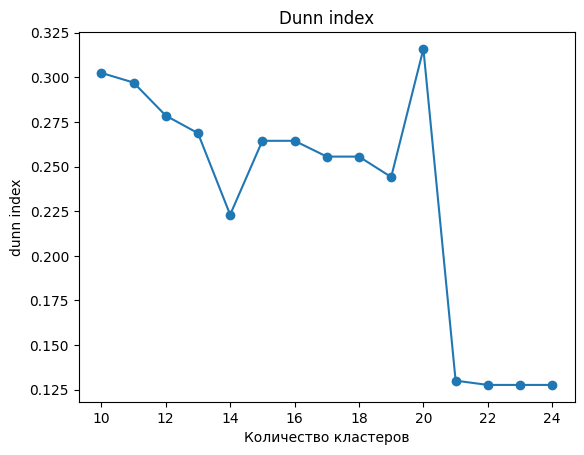

In [572]:
def dunn_method(data, start_k, end_k):
    di = []
    for n in range(start_k, end_k):
        kmeans = KMeans(n_clusters=n, random_state=4)
        kmeans.fit(data)
        labels = kmeans.labels_
        cm = ClusteringMetric(X=data, y_pred=labels)

        print(f"k={n}, dunn_index={cm.dunn_index()}")
        di.append(cm.dunn_index())
        # print(cm.DI())
    plt.plot(range(start_k, end_k), di, '-o')
    plt.xlabel('Количество кластеров')
    plt.ylabel('dunn index')
    plt.title('Dunn index')
    plt.show()
dunn_method(data_a1, 10, 25)



**Для датасета a1 этот метод справился с определением оптимального количества кластеров (21), хотя предыдущие 4 метода не справились**

проверим, что этот метод работает на других датасетах

k=3, dunn_index=0.18440748074741495
k=4, dunn_index=0.15888782800853307
k=5, dunn_index=0.1935151937447571
k=6, dunn_index=0.21433059212634056
k=7, dunn_index=0.28730871054330687
k=8, dunn_index=0.47564337429758397
k=9, dunn_index=0.03542509498872145
k=10, dunn_index=0.03542509498872145


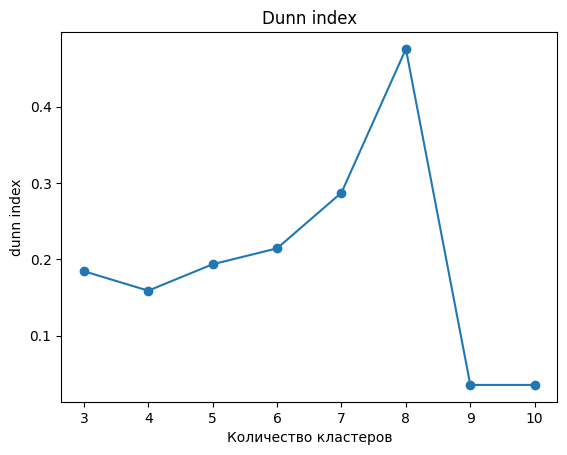

In [573]:
dunn_method(data_unbalanced, 3, 11)

k=1, dunn_index=0.0
k=2, dunn_index=2.127121137244033
k=3, dunn_index=0.13150690750439342
k=4, dunn_index=0.13046442494443206
k=5, dunn_index=0.13065979501704844
k=6, dunn_index=0.13129025430138974
k=7, dunn_index=0.15145943183156524
k=8, dunn_index=0.1641288485986072
k=9, dunn_index=0.1645587150781299


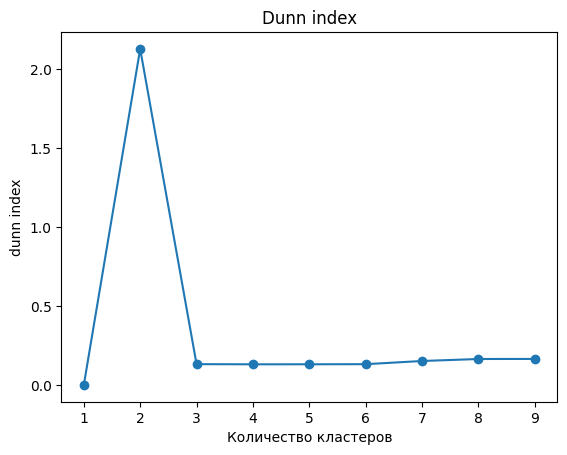

In [574]:
dunn_method(data_g2, 1, 10)

k=15, dunn_index=0.03898822145823163
k=16, dunn_index=0.03898822145823163
k=17, dunn_index=0.038870349633367385
k=18, dunn_index=0.043508515310343235
k=19, dunn_index=0.0493023052276601
k=20, dunn_index=0.0493023052276601
k=21, dunn_index=0.04083646590625168
k=22, dunn_index=0.04083646590625168
k=23, dunn_index=0.03980823701869578


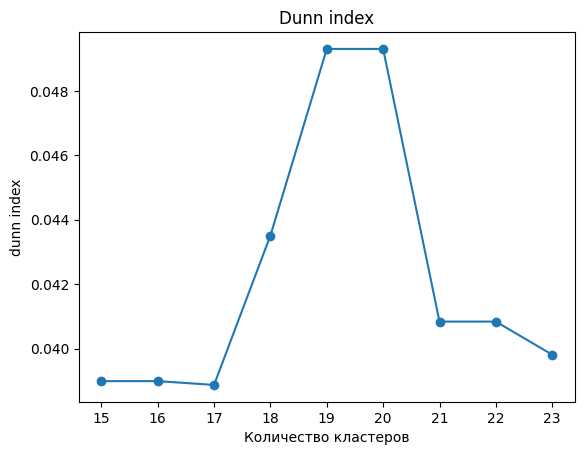

In [579]:
dunn_method(data_unbalanced, 15, 24)

на всех датасетах метод сработал 

**Попробуем еще один метод с использованием индекса Дэвиса-Боулдина —  метрика, которая оценивает качество кластеризации на основе компактности кластеров и расстояния между ними. Чем меньше значение индекса, тем лучше кластеризация**

20


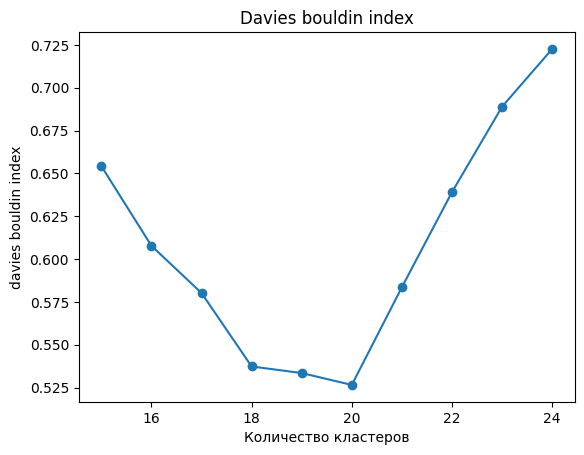

In [586]:
def db_method(data,start_k, end_k):
    dbi_scores = []
    cluster_range = range(start_k, end_k)

    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters, random_state=4)
        labels = kmeans.fit_predict(data)
        dbi = davies_bouldin_score(data, labels)
        dbi_scores.append(dbi)

    # оптимальное количество кластеров - это то, при котором DBI минимален
    optimal_clusters = cluster_range[np.argmin(dbi_scores)]
    print(optimal_clusters)
    plt.plot(range(start_k, end_k), dbi_scores, '-o')
    plt.xlabel('Количество кластеров')
    plt.ylabel('davies bouldin index')
    plt.title('Davies bouldin index')
    plt.show()


db_method(data_a1, 15, 25)

4


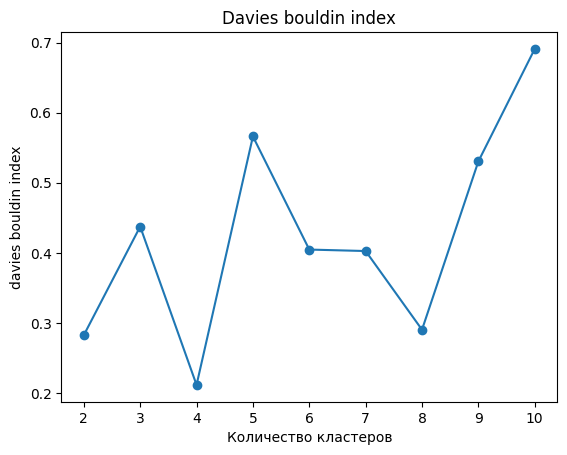

In [592]:
db_method(data_unbalanced, 2, 11)

2


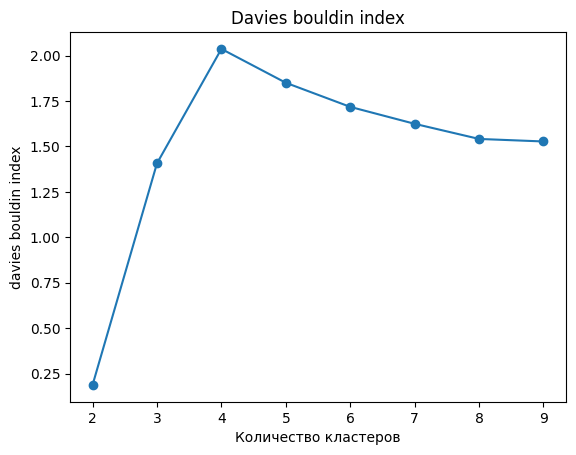

In [590]:
db_method(data_g2, 2, 10)

16


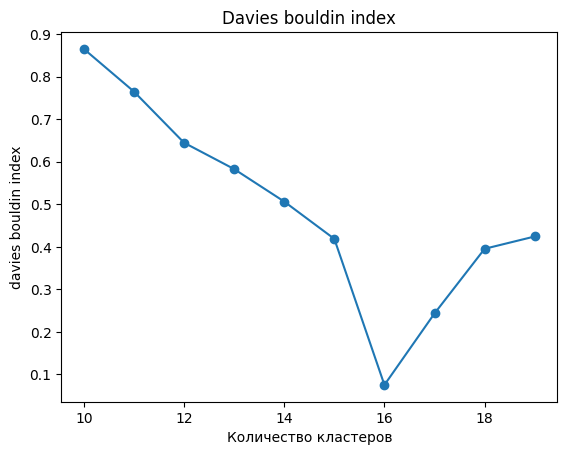

In [591]:
db_method(data_dim032, 10, 20)

Для всех датасетов кроме `unbalance` этот метод показал правильное оптимальное количество кластеров

Индекс Дэвиса-Боулдина оценивает качество кластеризации на основе двух факторов:
- Компактность кластеров (насколько близки точки внутри одного кластера)
- Разделение кластеров (насколько далеко кластеры находятся друг от друга)

У нас есть 3 плотных кластера и 5 разреженных, поэтому, возможно, когда разреженные кластеры объединены в один индекс ниже, так как их плотность низкая и  расстояние между ними относительно мало, и получается, что они как бы сосредоточены в одной области, где плотность сильно ниже, чем в каждом из 3-х плотных кластеров


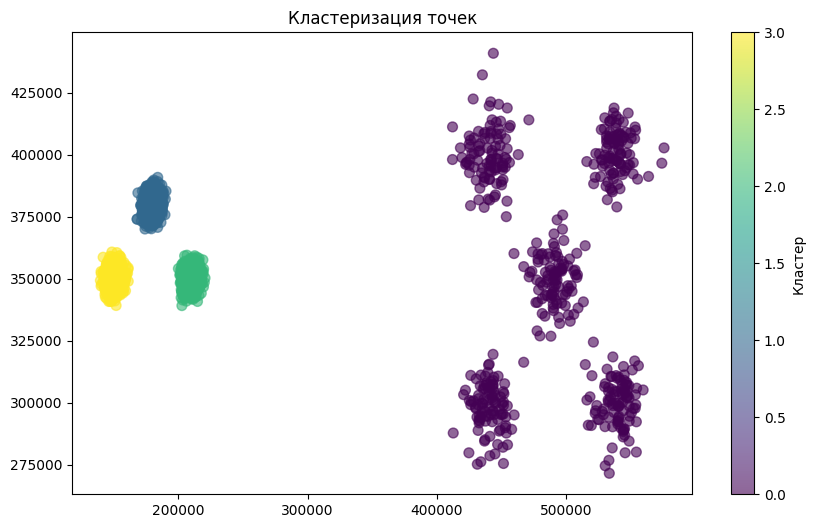

In [596]:
kmeans = KMeans(n_clusters=4, random_state=4)
ccc = kmeans.fit_predict(data_unbalanced)
plt.figure(figsize=(10, 6))
plt.scatter(data_unbalanced[:, 0], data_unbalanced[:, 1], c=ccc, s=50, alpha=0.6) 
plt.title('Кластеризация точек')
plt.colorbar(label='Кластер')
plt.show()

Посмотрим еще на AIC (информационный критерий, как и bic)

$
\text{AIC} = 2k - 2\ln(\hat{L})
$

- $ k $ — количество параметров модели,
- $ \hat{L} $ — максимальное значение функции правдоподобия модели


In [619]:
def aic_method(X,start_k=1, end_k=10):
    aic_values = []

    for n in range(start_k, end_k):
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(X)
        aic_values.append(gmm.bic(X))
    
    print(np.argmin(np.array(aic_values))+start_k)
    plt.plot(range(start_k, end_k), aic_values, label='AIC')
    plt.xlabel('Количество кластеров')
    plt.ylabel('Значение критерия')
    plt.title('AIC')
    plt.legend()
    plt.show()

21


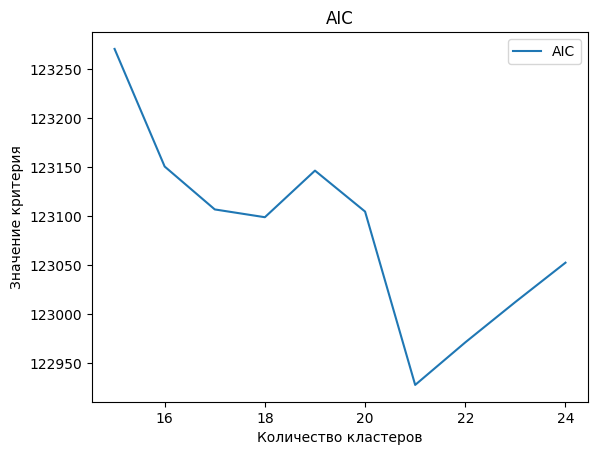

In [620]:
aic_method(data_a1, 15, 25)

как и bic на датасете показывает 21

8


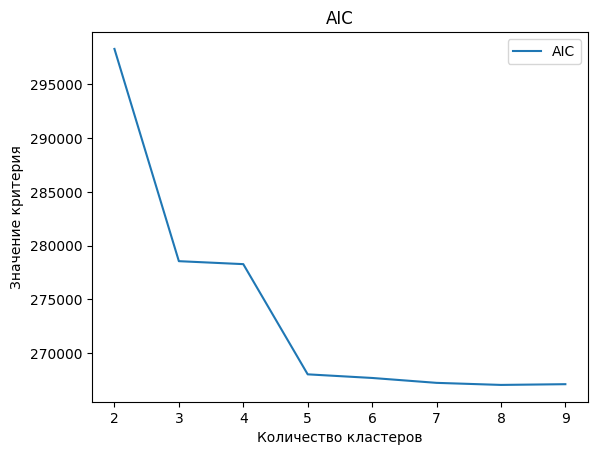

In [621]:
aic_method(data_unbalanced, 2, 10)


8 - это правильно определенное кол-во кластеров

15


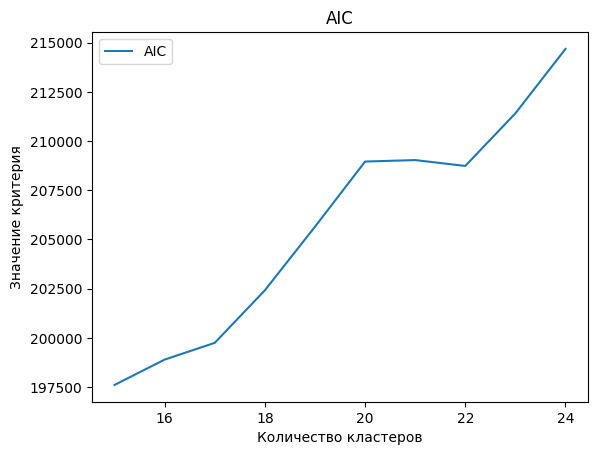

In [622]:
aic_method(data_dim032, 15, 25)


правильное кол-во кластеров 16, но aic показал себя лучше (15), чем bic, тк он показал 10 вместо 16

2


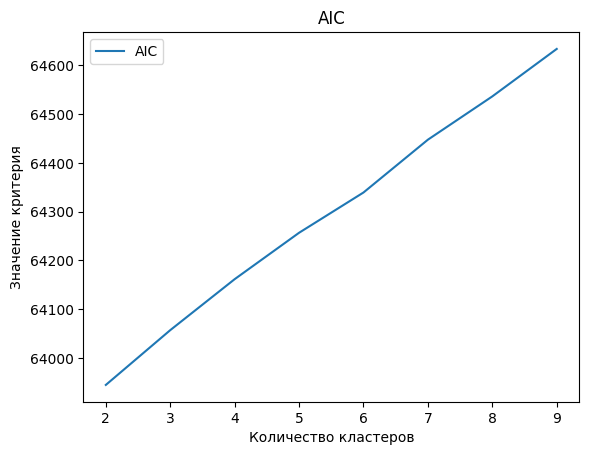

In [623]:
aic_method(data_g2, 2, 10)


верное кол-во кластеров 2